# LIBRARY

In [ ]:
# Base Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Data Analysis Libraries
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.preprocessing import MinMaxScaler,StandardScaler, RobustScaler, LabelEncoder, OneHotEncoder
from sklearn.metrics import classification_report,confusion_matrix,mean_squared_error,accuracy_score,recall_score,precision_score,f1_score,roc_auc_score
from sklearn.model_selection import train_test_split, cross_val_score,GridSearchCV, RandomizedSearchCV
from sklearn.utils import class_weight
from imblearn.over_sampling import SMOTE
import scipy.stats as stats
from scipy.stats import shapiro, levene, kruskal, ttest_ind, f_oneway
from tabulate import tabulate

# Machine Learning Libraries
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline

#Deep Learning Libraries
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization

import warnings
warnings.filterwarnings("ignore")

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


# IMPORT DATA

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from google.colab import drive
drive.mount('/content/drive')
data = '/content/drive/MyDrive/parkinsons.csv'
data = pd.read_csv(data)
data

Mounted at /content/drive


,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,...,FunctionalAssessment,Tremor,Rigidity,Bradykinesia,PosturalInstability,SpeechProblems,SleepDisorders,Constipation,Diagnosis,DoctorInCharge
0,3058,85,0,3,1,19.619878,0,5.108241,1.380660,3.893969,...,1.572427,1,0,0,0,0,0,0,0,DrXXXConfid
1,3059,75,0,0,2,16.247339,1,6.027648,8.409804,8.513428,...,4.787551,0,1,0,1,0,1,0,1,DrXXXConfid
2,3060,70,1,0,0,15.368239,0,2.242135,0.213275,6.498805,...,2.130686,1,0,0,0,1,0,1,1,DrXXXConfid
3,3061,52,0,0,0,15.454557,0,5.997788,1.375045,6.715033,...,3.391288,1,1,1,0,0,0,1,1,DrXXXConfid
4,3062,87,0,0,1,18.616042,0,9.775243,1.188607,4.657572,...,3.200969,0,0,0,1,0,1,0,0,DrXXXConfid
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2100,5158,87,1,0,2,38.483841,0,12.674393,5.325900,5.947278,...,8.076254,1,0,0,0,1,1,0,0,DrXXXConfid
2101,5159,67,0,0,1,33.694396,1,0.977018,0.108599,4.825187,...,1.665751,0,0,0,1,0,1,1,1,DrXXXConfid
2102,5160,65,0,0,2,22.829631,0,6.152286,5.775103,0.334244,...,4.785614,0,0,0,0,1,1,0,1,DrXXXConfid
2103,5161,61,1,0,0,16.871030,1,0.292094,2.280475,9.598513,...,8.378979,1,0,1,0,0,1,1,1,DrXXXConfid


# PREPROCESSING

In [ ]:
#DETEKSI NILAI KOSONG#
data.info()
data.isna()
data.isna().sum()
data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2105 entries, 0 to 2104
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   PatientID                 2105 non-null   int64  
 1   Age                       2105 non-null   int64  
 2   Gender                    2105 non-null   int64  
 3   Ethnicity                 2105 non-null   int64  
 4   EducationLevel            2105 non-null   int64  
 5   BMI                       2105 non-null   float64
 6   Smoking                   2105 non-null   int64  
 7   AlcoholConsumption        2105 non-null   float64
 8   PhysicalActivity          2105 non-null   float64
 9   DietQuality               2105 non-null   float64
 10  SleepQuality              2105 non-null   float64
 11  FamilyHistoryParkinsons   2105 non-null   int64  
 12  TraumaticBrainInjury      2105 non-null   int64  
 13  Hypertension              2105 non-null   int64  
 14  Diabetes

,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,...,FunctionalAssessment,Tremor,Rigidity,Bradykinesia,PosturalInstability,SpeechProblems,SleepDisorders,Constipation,Diagnosis,DoctorInCharge
0,3058,85,0,3,1,19.619878,0,5.108241,1.380660,3.893969,...,1.572427,1,0,0,0,0,0,0,0,DrXXXConfid
1,3059,75,0,0,2,16.247339,1,6.027648,8.409804,8.513428,...,4.787551,0,1,0,1,0,1,0,1,DrXXXConfid
2,3060,70,1,0,0,15.368239,0,2.242135,0.213275,6.498805,...,2.130686,1,0,0,0,1,0,1,1,DrXXXConfid
3,3061,52,0,0,0,15.454557,0,5.997788,1.375045,6.715033,...,3.391288,1,1,1,0,0,0,1,1,DrXXXConfid
4,3062,87,0,0,1,18.616042,0,9.775243,1.188607,4.657572,...,3.200969,0,0,0,1,0,1,0,0,DrXXXConfid
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2100,5158,87,1,0,2,38.483841,0,12.674393,5.325900,5.947278,...,8.076254,1,0,0,0,1,1,0,0,DrXXXConfid
2101,5159,67,0,0,1,33.694396,1,0.977018,0.108599,4.825187,...,1.665751,0,0,0,1,0,1,1,1,DrXXXConfid
2102,5160,65,0,0,2,22.829631,0,6.152286,5.775103,0.334244,...,4.785614,0,0,0,0,1,1,0,1,DrXXXConfid
2103,5161,61,1,0,0,16.871030,1,0.292094,2.280475,9.598513,...,8.378979,1,0,1,0,0,1,1,1,DrXXXConfid


In [ ]:
dataku = data.drop(["DoctorInCharge","PatientID"], axis = 1)

In [ ]:
dataku

,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,...,MoCA,FunctionalAssessment,Tremor,Rigidity,Bradykinesia,PosturalInstability,SpeechProblems,SleepDisorders,Constipation,Diagnosis
0,85,0,3,1,19.619878,0,5.108241,1.380660,3.893969,9.283194,...,29.181289,1.572427,1,0,0,0,0,0,0,0
1,75,0,0,2,16.247339,1,6.027648,8.409804,8.513428,5.602470,...,12.332639,4.787551,0,1,0,1,0,1,0,1
2,70,1,0,0,15.368239,0,2.242135,0.213275,6.498805,9.929824,...,29.927783,2.130686,1,0,0,0,1,0,1,1
3,52,0,0,0,15.454557,0,5.997788,1.375045,6.715033,4.196189,...,21.304268,3.391288,1,1,1,0,0,0,1,1
4,87,0,0,1,18.616042,0,9.775243,1.188607,4.657572,9.363925,...,8.336364,3.200969,0,0,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2100,87,1,0,2,38.483841,0,12.674393,5.325900,5.947278,6.296231,...,28.634010,8.076254,1,0,0,0,1,1,0,0
2101,67,0,0,1,33.694396,1,0.977018,0.108599,4.825187,6.342325,...,13.106537,1.665751,0,0,0,1,0,1,1,1
2102,65,0,0,2,22.829631,0,6.152286,5.775103,0.334244,9.740019,...,26.527734,4.785614,0,0,0,0,1,1,0,1
2103,61,1,0,0,16.871030,1,0.292094,2.280475,9.598513,8.289390,...,19.873404,8.378979,1,0,1,0,0,1,1,1


In [ ]:
def grab_col_names(dataframe, cat_th=10, car_th=20):

    # cat_cols, cat_but_car
    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "O"]
    num_but_cat = [col for col in dataframe.columns if dataframe[col].nunique() < cat_th and dataframe[col].dtypes != "O"]
    cat_but_car = [col for col in dataframe.columns if dataframe[col].nunique() > car_th and dataframe[col].dtypes == "O"]
    cat_cols = cat_cols + num_but_cat
    cat_cols = [col for col in cat_cols if col not in cat_but_car]

    # num_cols
    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != "O"]
    num_cols = [col for col in num_cols if col not in num_but_cat]

    print(f"Observations: {dataframe.shape[0]}")
    print(f"Variables: {dataframe.shape[1]}")
    print(f'cat_cols: {len(cat_cols)}')
    print(f'num_cols: {len(num_cols)}')
    print(f'cat_but_car: {len(cat_but_car)}')
    print(f'num_but_cat: {len(num_but_cat)}')

    return cat_cols, num_cols, cat_but_car


cat_cols, num_cols, cat_but_car = grab_col_names(dataku)

Observations: 2105
Variables: 33
cat_cols: 18
num_cols: 15
cat_but_car: 0
num_but_cat: 18


In [ ]:
cat_cols, num_cols, cat_but_car

(['Gender',
  'Ethnicity',
  'EducationLevel',
  'Smoking',
  'FamilyHistoryParkinsons',
  'TraumaticBrainInjury',
  'Hypertension',
  'Diabetes',
  'Depression',
  'Stroke',
  'Tremor',
  'Rigidity',
  'Bradykinesia',
  'PosturalInstability',
  'SpeechProblems',
  'SleepDisorders',
  'Constipation',
  'Diagnosis'],
 ['Age',
  'BMI',
  'AlcoholConsumption',
  'PhysicalActivity',
  'DietQuality',
  'SleepQuality',
  'SystolicBP',
  'DiastolicBP',
  'CholesterolTotal',
  'CholesterolLDL',
  'CholesterolHDL',
  'CholesterolTriglycerides',
  'UPDRS',
  'MoCA',
  'FunctionalAssessment'],
 [])

**ANALISIS DATA**

        Gender      Ratio
Gender                   
0         1068  50.736342
1         1037  49.263658


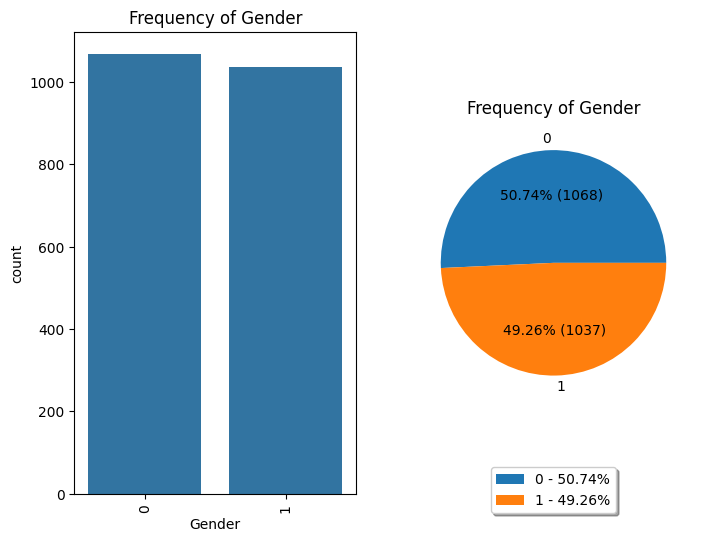

           Ethnicity      Ratio
Ethnicity                      
0               1270  60.332542
1                425  20.190024
3                213  10.118765
2                197   9.358670


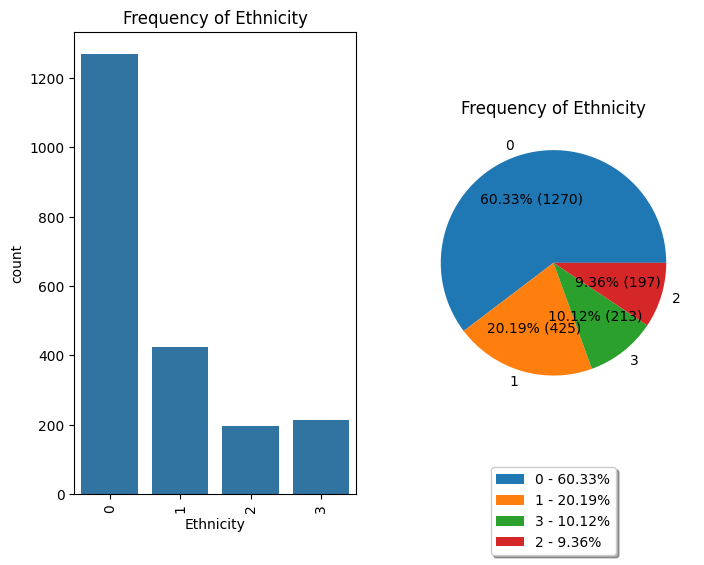

                EducationLevel      Ratio
EducationLevel                           
1                          840  39.904988
2                          656  31.163895
0                          388  18.432304
3                          221  10.498812


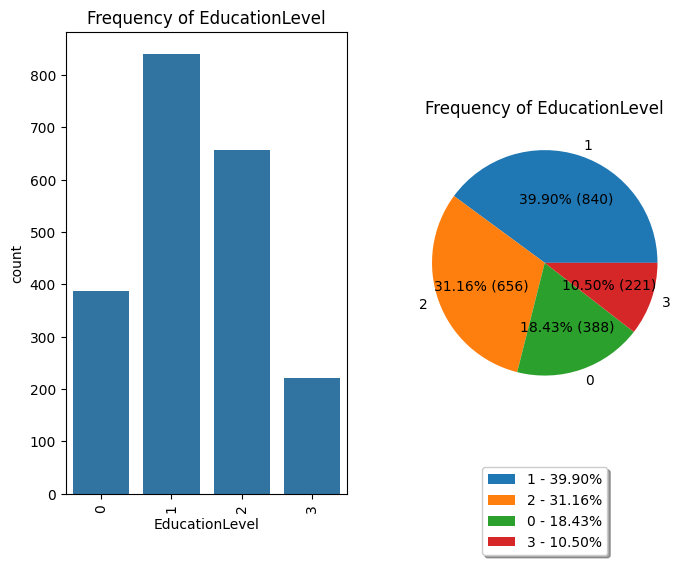

         Smoking      Ratio
Smoking                    
0           1481  70.356295
1            624  29.643705


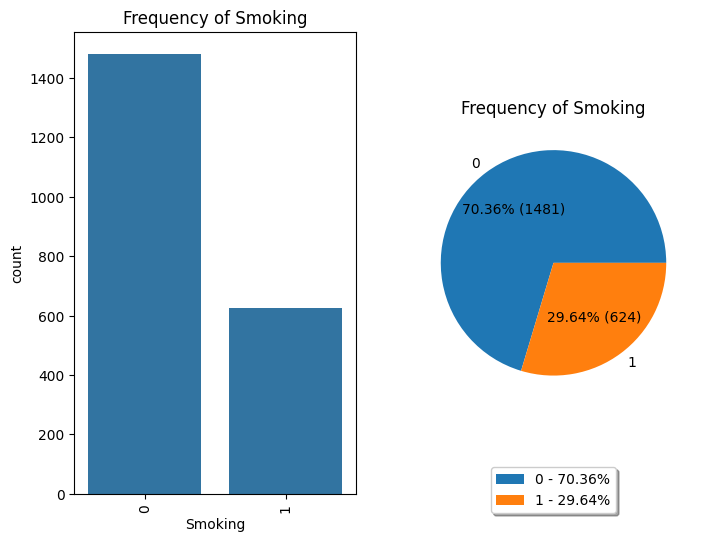

                         FamilyHistoryParkinsons      Ratio
FamilyHistoryParkinsons                                    
0                                           1798  85.415677
1                                            307  14.584323


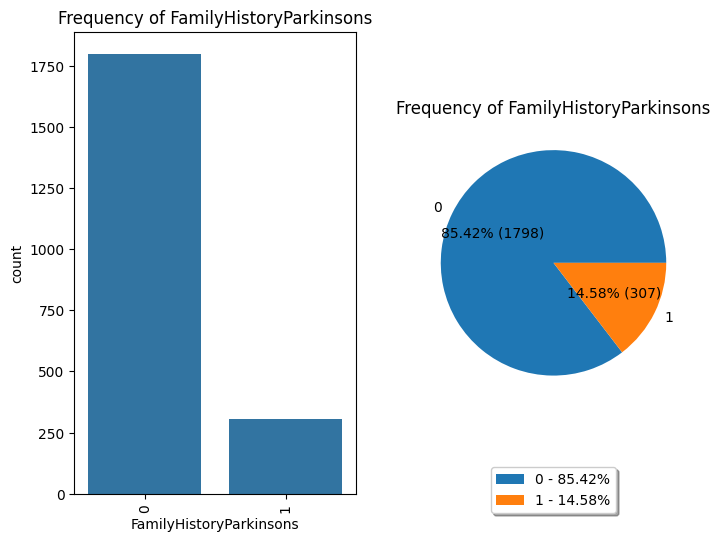

                      TraumaticBrainInjury     Ratio
TraumaticBrainInjury                                
0                                     1881  89.35867
1                                      224  10.64133


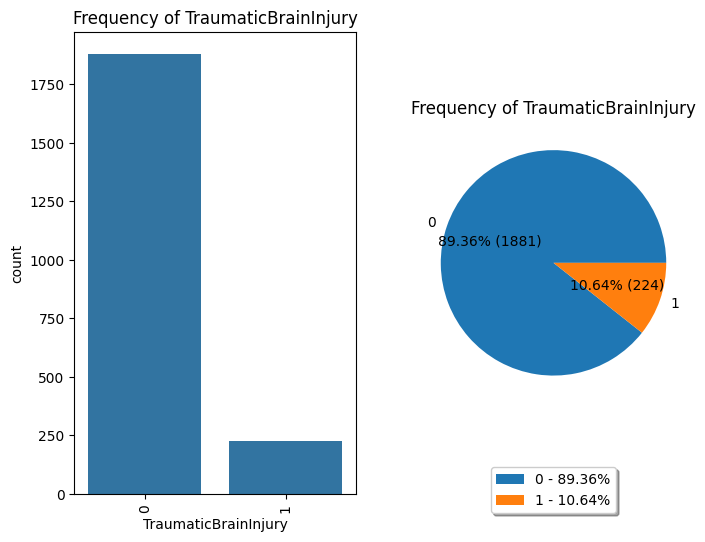

              Hypertension      Ratio
Hypertension                         
0                     1798  85.415677
1                      307  14.584323


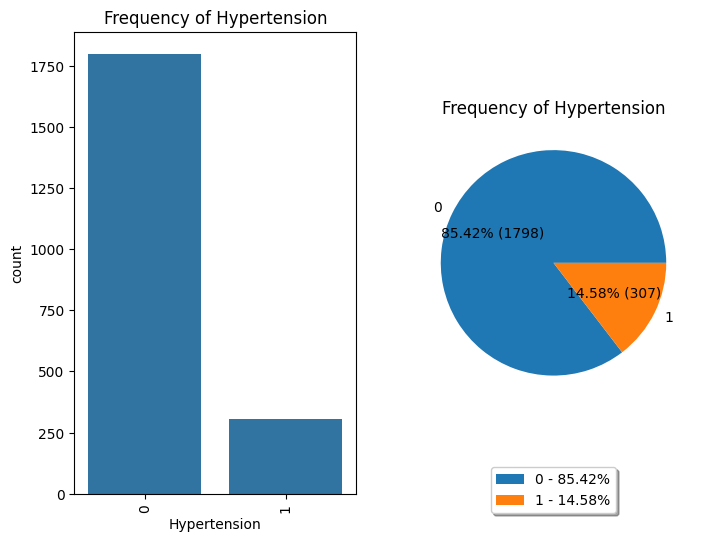

          Diabetes      Ratio
Diabetes                     
0             1793  85.178147
1              312  14.821853


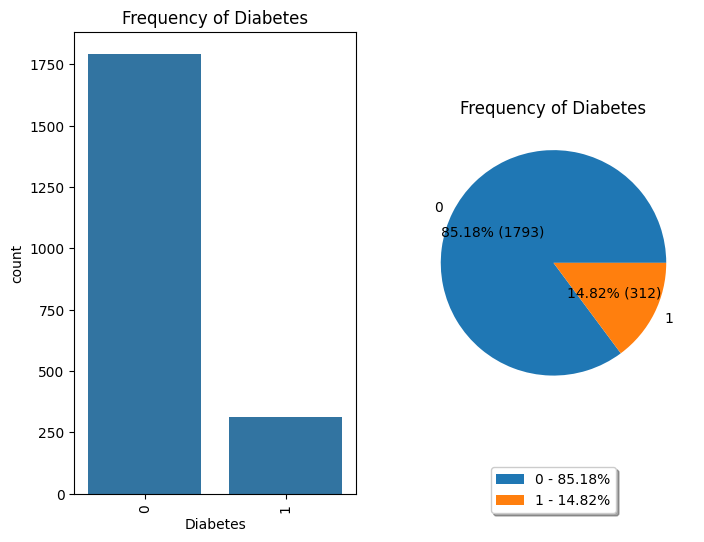

            Depression      Ratio
Depression                       
0                 1673  79.477435
1                  432  20.522565


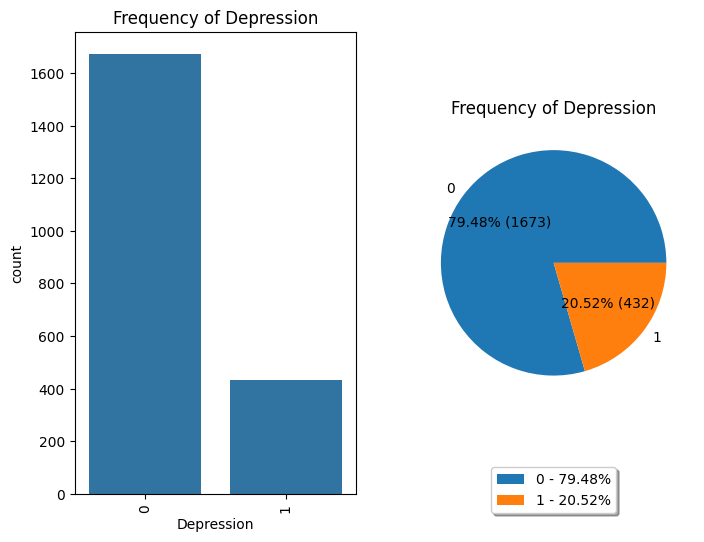

        Stroke      Ratio
Stroke                   
0         2002  95.106888
1          103   4.893112


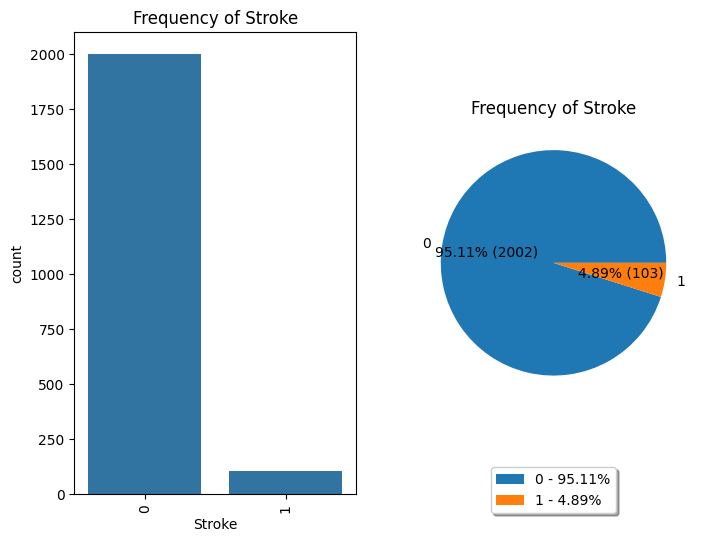

        Tremor      Ratio
Tremor                   
0         1196  56.817102
1          909  43.182898


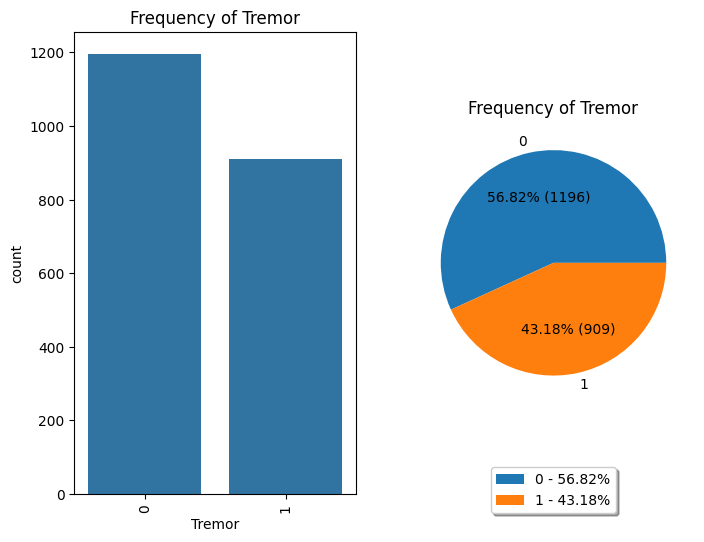

          Rigidity      Ratio
Rigidity                     
0             1573  74.726841
1              532  25.273159


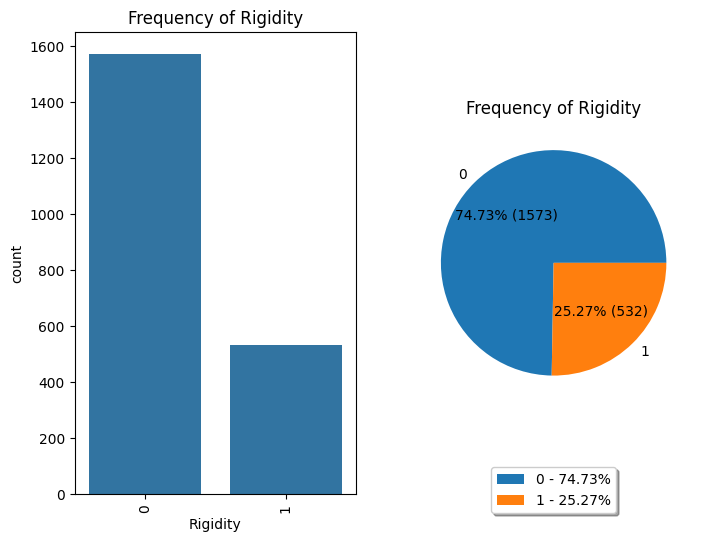

              Bradykinesia      Ratio
Bradykinesia                         
0                     1668  79.239905
1                      437  20.760095


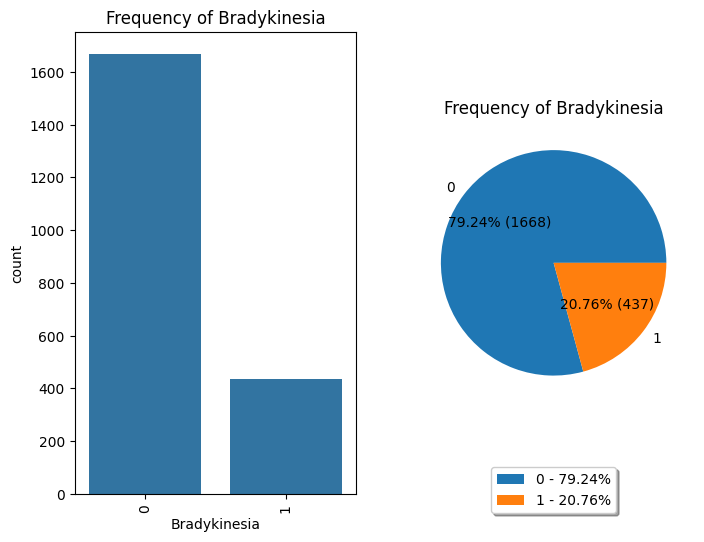

                     PosturalInstability      Ratio
PosturalInstability                                
0                                   1813  86.128266
1                                    292  13.871734


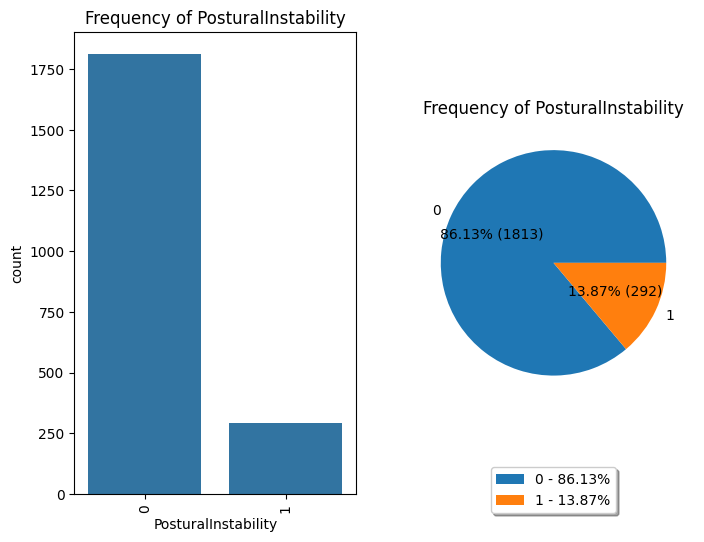

                SpeechProblems      Ratio
SpeechProblems                           
0                         1484  70.498812
1                          621  29.501188


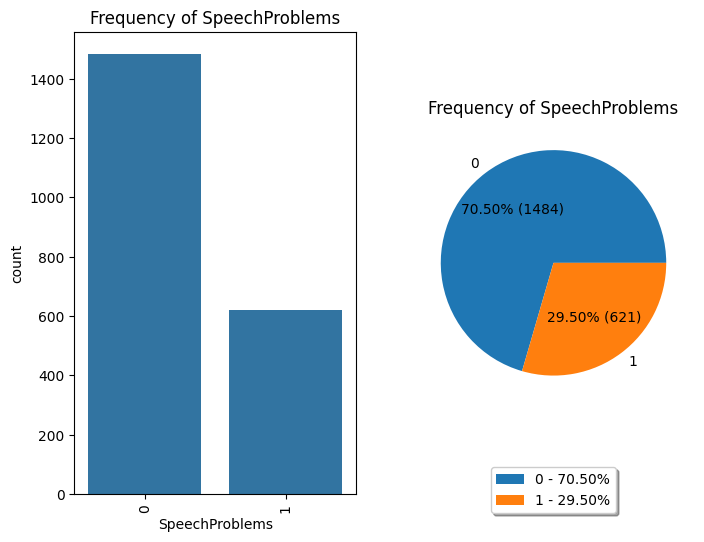

                SleepDisorders      Ratio
SleepDisorders                           
0                         1589  75.486936
1                          516  24.513064


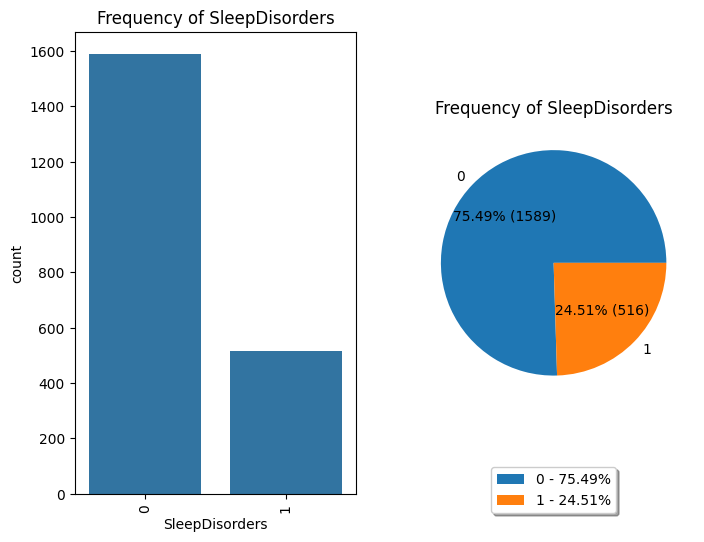

              Constipation      Ratio
Constipation                         
0                     1480  70.308789
1                      625  29.691211


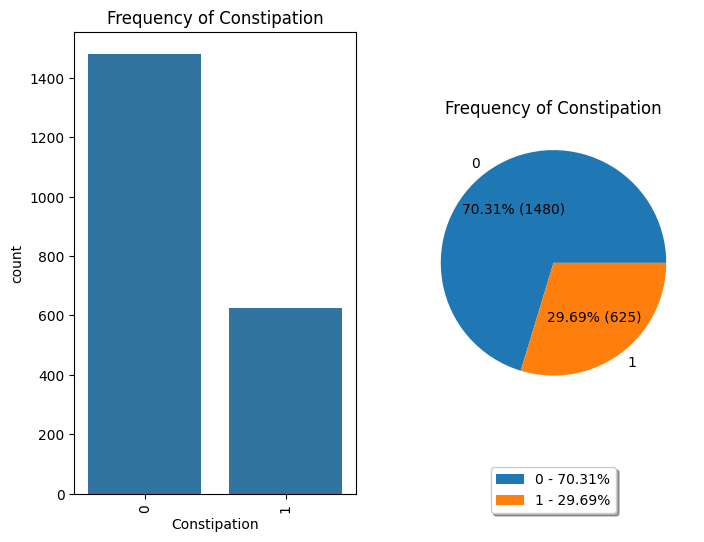

           Diagnosis      Ratio
Diagnosis                      
1               1304  61.947743
0                801  38.052257


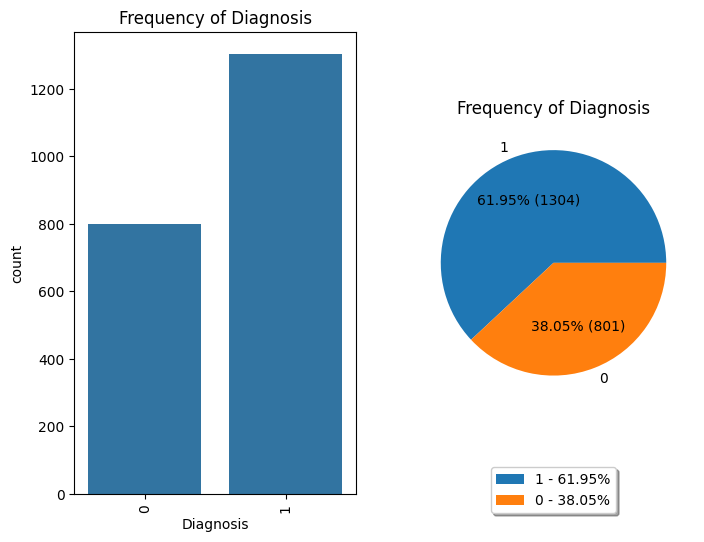

In [ ]:
def cat_summary(dataframe, col_name, plot=False):
    print(pd.DataFrame({col_name: dataframe[col_name].value_counts(),
                        "Ratio": 100 * dataframe[col_name].value_counts() / len(dataframe)}))

    if plot:
        fig, axs = plt.subplots(1, 2, figsize=(8, 6))
        plt.subplot(1, 2, 1)
        sns.countplot(x=dataframe[col_name], data=dataframe)
        plt.title("Frequency of " + col_name)
        plt.xticks(rotation=90)

        plt.subplot(1, 2, 2)
        values = dataframe[col_name].value_counts()
        plt.pie(x=values, labels=values.index, autopct=lambda p: '{:.2f}% ({:.0f})'.format(p, p/100 * sum(values)))
        plt.title("Frequency of " + col_name)
        plt.legend(labels=['{} - {:.2f}%'.format(index, value/sum(values)*100) for index, value in zip(values.index, values)],
                   loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, shadow=True, ncol=1)
        plt.show(block=True)

for col in cat_cols:
    cat_summary(dataku, col, True)

Age
count    2105.000000
mean       69.601900
std        11.594511
min        50.000000
5%         51.000000
10%        53.000000
20%        57.000000
30%        62.000000
40%        66.000000
50%        70.000000
60%        74.000000
70%        77.000000
80%        82.000000
90%        86.000000
95%        88.000000
99%        89.000000
max        89.000000
Name: Age, dtype: float64


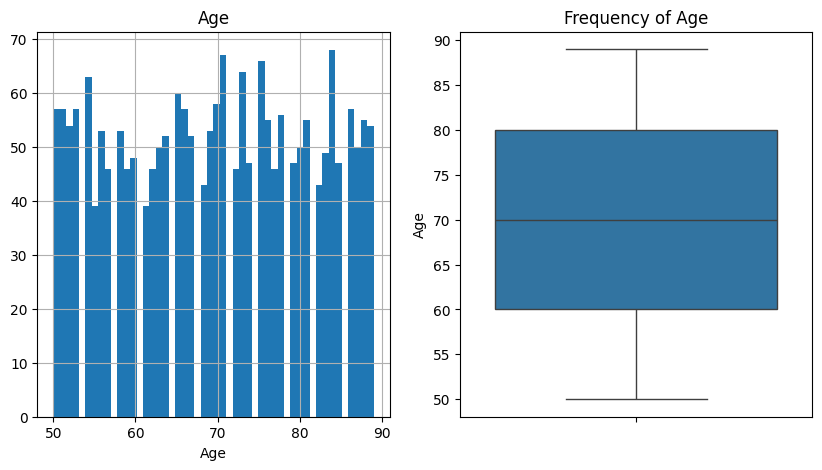

______________________________________________________

BMI
count    2105.000000
mean       27.209493
std         7.208099
min        15.008333
5%         16.107691
10%        17.493894
20%        19.670152
30%        22.176523
40%        24.423711
50%        27.184571
60%        29.756482
70%        32.199080
80%        34.723208
90%        37.079085
95%        38.574151
99%        39.705417
max        39.999887
Name: BMI, dtype: float64


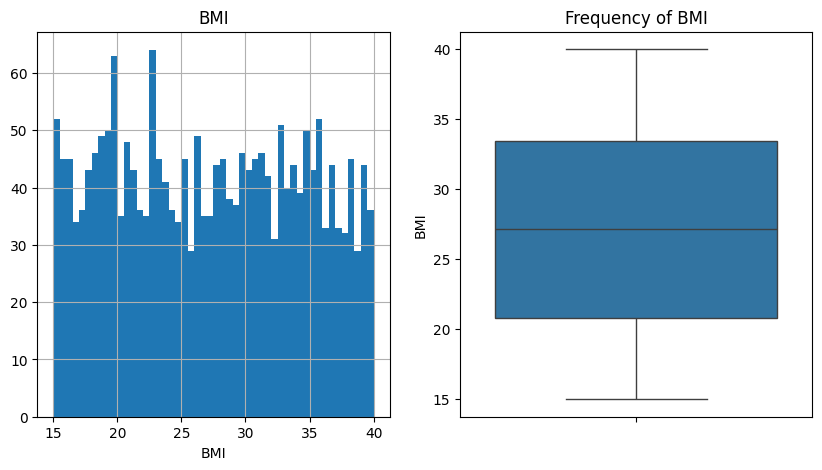

______________________________________________________

AlcoholConsumption
count    2105.000000
mean       10.040413
std         5.687014
min         0.002228
5%          1.085154
10%         2.223766
20%         4.138154
30%         6.078163
40%         7.950085
50%        10.070337
60%        12.252470
70%        13.890478
80%        15.759299
90%        17.912668
95%        18.880348
99%        19.746651
max        19.988866
Name: AlcoholConsumption, dtype: float64


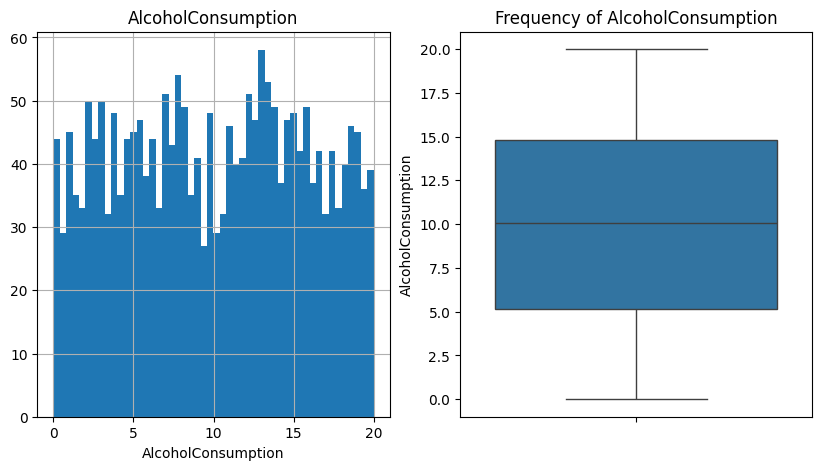

______________________________________________________

PhysicalActivity
count    2105.000000
mean        5.016674
std         2.890919
min         0.004157
5%          0.574804
10%         1.104271
20%         2.048316
30%         2.893412
40%         3.934206
50%         5.031550
60%         5.985375
70%         7.010958
80%         8.063215
90%         9.045277
95%         9.489498
99%         9.888555
max         9.995255
Name: PhysicalActivity, dtype: float64


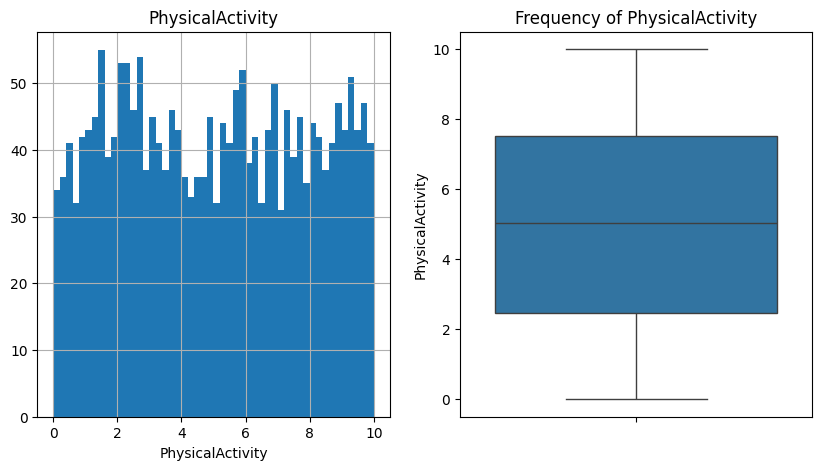

______________________________________________________

DietQuality
count    2105.000000
mean        4.912901
std         2.872115
min         0.000011
5%          0.467278
10%         0.927667
20%         1.959121
30%         2.954805
40%         3.876791
50%         4.825187
60%         5.851538
70%         6.867890
80%         7.885316
90%         8.913991
95%         9.451643
99%         9.901345
max         9.995864
Name: DietQuality, dtype: float64


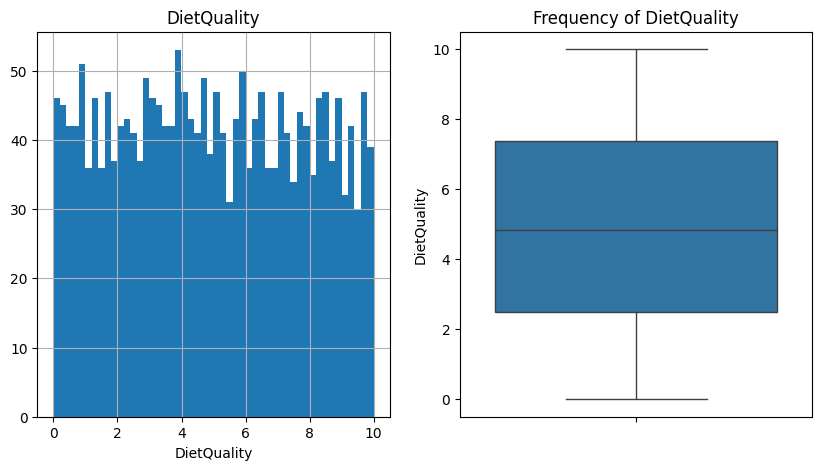

______________________________________________________

SleepQuality
count    2105.000000
mean        6.996639
std         1.753065
min         4.000497
5%          4.253779
10%         4.541062
20%         5.206499
30%         5.786063
40%         6.367839
50%         6.929819
60%         7.606920
70%         8.256672
80%         8.846728
90%         9.417776
95%         9.699984
99%         9.940647
max         9.999821
Name: SleepQuality, dtype: float64


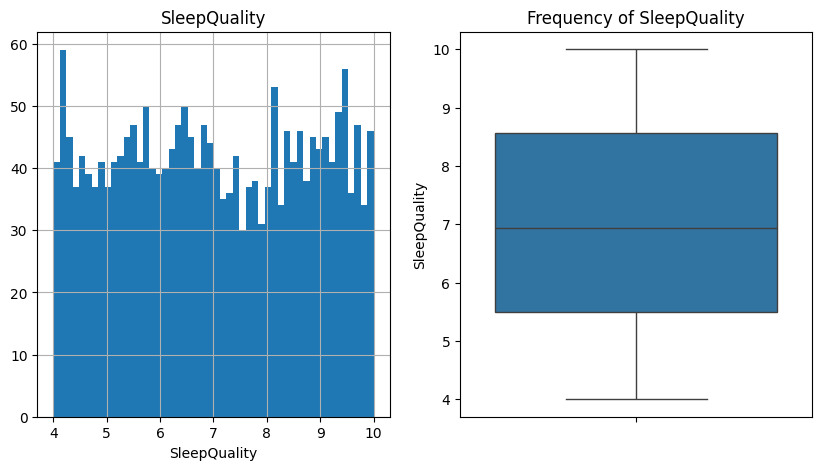

______________________________________________________

SystolicBP
count    2105.000000
mean      133.719715
std        26.502355
min        90.000000
5%         94.000000
10%        97.400000
20%       105.000000
30%       115.000000
40%       124.000000
50%       133.000000
60%       143.000000
70%       152.000000
80%       162.000000
90%       171.000000
95%       175.000000
99%       179.000000
max       179.000000
Name: SystolicBP, dtype: float64


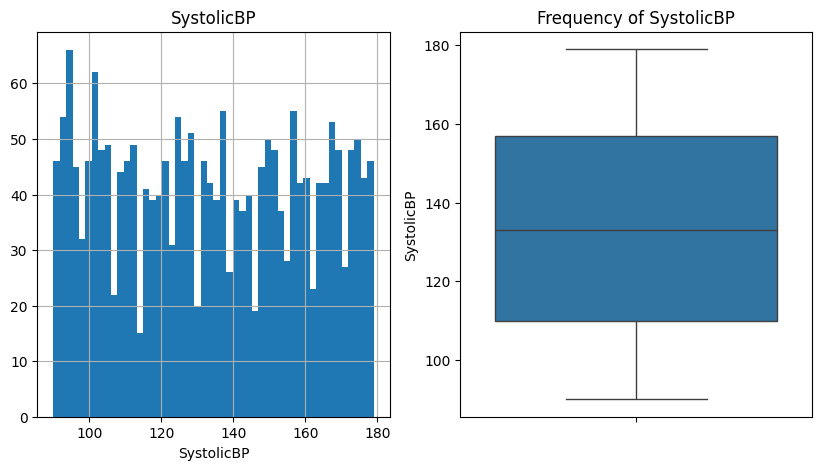

______________________________________________________

DiastolicBP
count    2105.000000
mean       90.249881
std        17.061488
min        60.000000
5%         63.000000
10%        66.000000
20%        72.000000
30%        79.000000
40%        85.000000
50%        91.000000
60%        96.000000
70%       102.000000
80%       108.000000
90%       113.000000
95%       116.000000
99%       119.000000
max       119.000000
Name: DiastolicBP, dtype: float64


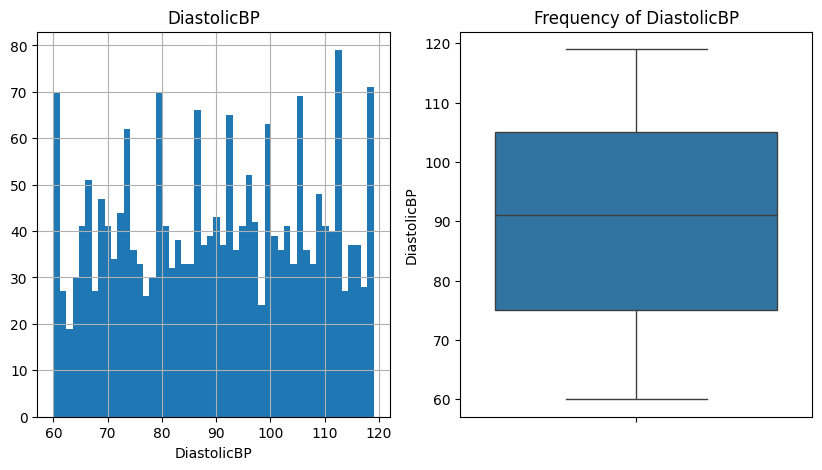

______________________________________________________

CholesterolTotal
count    2105.000000
mean      226.860840
std        43.589406
min       150.062698
5%        157.358567
10%       165.796602
20%       181.047747
30%       197.804786
40%       212.541101
50%       228.528256
60%       242.282589
70%       257.794236
80%       272.029850
90%       286.460926
95%       293.105373
99%       298.939467
max       299.963074
Name: CholesterolTotal, dtype: float64


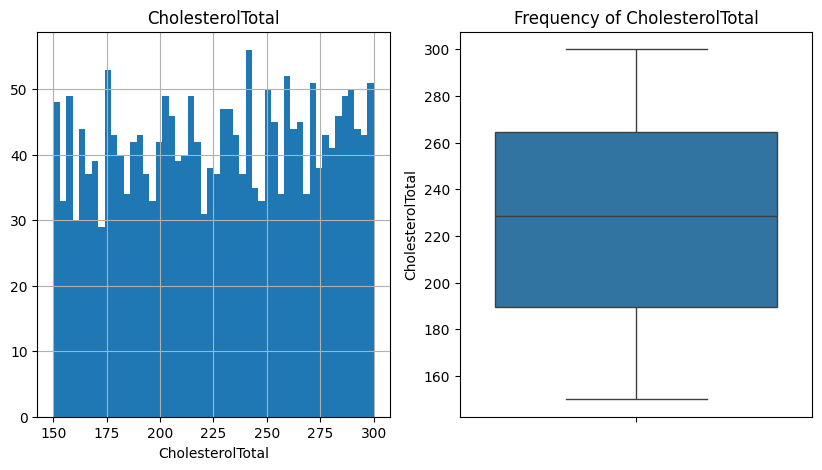

______________________________________________________

CholesterolLDL
count    2105.000000
mean      126.147858
std        43.407036
min        50.022828
5%         58.013274
10%        66.682099
20%        81.029626
30%        95.389650
40%       111.318870
50%       126.884570
60%       141.268148
70%       155.825936
80%       171.093989
90%       186.197836
95%       193.238760
99%       198.731168
max       199.985981
Name: CholesterolLDL, dtype: float64


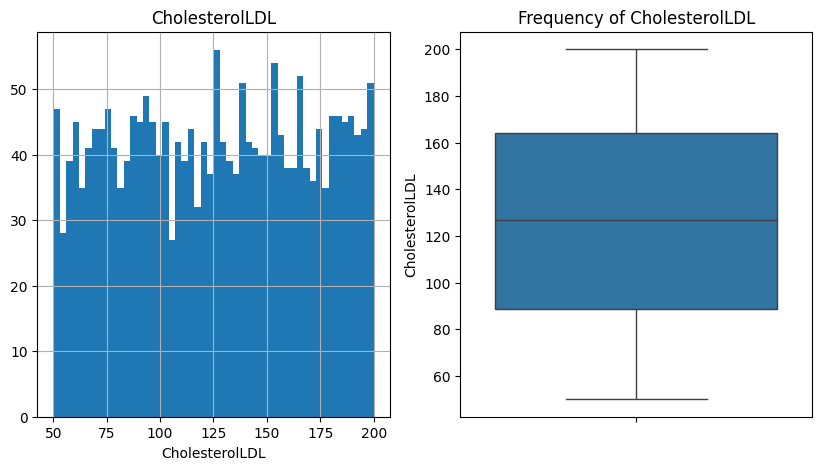

______________________________________________________

CholesterolHDL
count    2105.000000
mean       59.670352
std        23.370920
min        20.027981
5%         23.242041
10%        26.827913
20%        34.973678
30%        43.975296
40%        52.026549
50%        59.343357
60%        67.960420
70%        75.262970
80%        83.167889
90%        92.622288
95%        96.618728
99%        99.301337
max        99.982265
Name: CholesterolHDL, dtype: float64


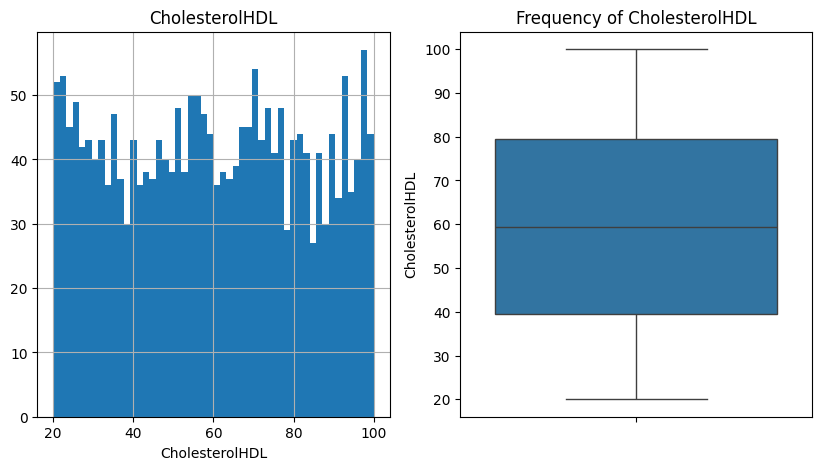

______________________________________________________

CholesterolTriglycerides
count    2105.000000
mean      222.940500
std       101.895822
min        50.113604
5%         66.072074
10%        82.542974
20%       116.357614
30%       150.850622
40%       187.860985
50%       222.802452
60%       256.719567
70%       292.550377
80%       329.195960
90%       365.561032
95%       382.751423
99%       397.304701
max       399.975022
Name: CholesterolTriglycerides, dtype: float64


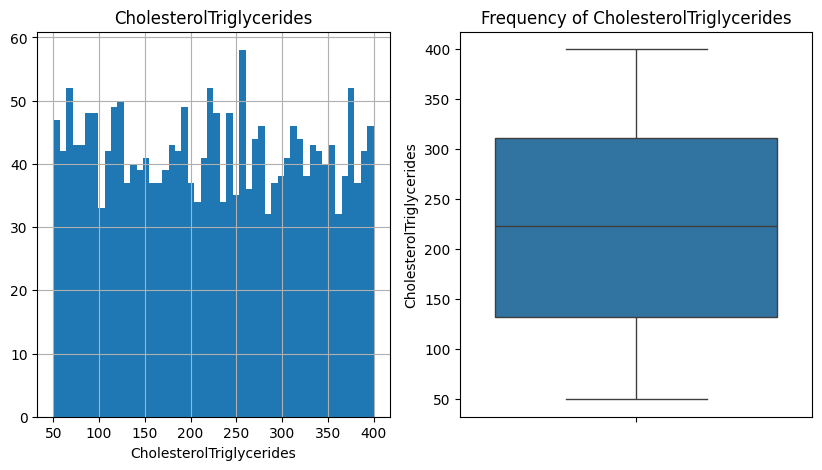

______________________________________________________

UPDRS
count    2105.000000
mean      101.415318
std        56.591448
min         0.028441
5%         10.406361
10%        21.510937
20%        42.902995
30%        63.096929
40%        84.813752
50%       102.561023
60%       121.410986
70%       139.149929
80%       159.880797
90%       178.815462
95%       189.420037
99%       197.655770
max       198.953604
Name: UPDRS, dtype: float64


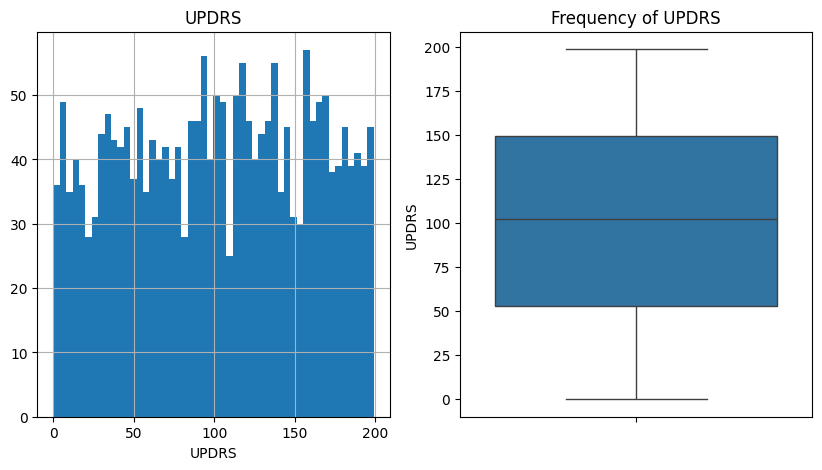

______________________________________________________

MoCA
count    2105.000000
mean       15.094314
std         8.643014
min         0.021191
5%          1.621559
10%         3.040005
20%         6.318196
30%         9.081952
40%        11.984514
50%        14.963574
60%        18.452582
70%        21.368593
80%        23.906169
90%        26.903842
95%        28.406632
99%        29.546427
max        29.970107
Name: MoCA, dtype: float64


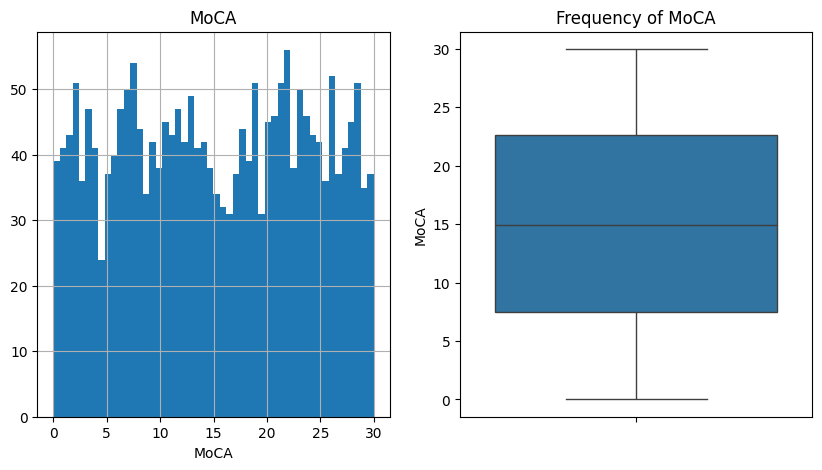

______________________________________________________

FunctionalAssessment
count    2105.000000
mean        4.989694
std         2.933877
min         0.001505
5%          0.403282
10%         0.961249
20%         1.917071
30%         2.898089
40%         3.975410
50%         4.983227
60%         6.024738
70%         6.953742
80%         8.046615
90%         9.037344
95%         9.598798
99%         9.919892
max         9.992697
Name: FunctionalAssessment, dtype: float64


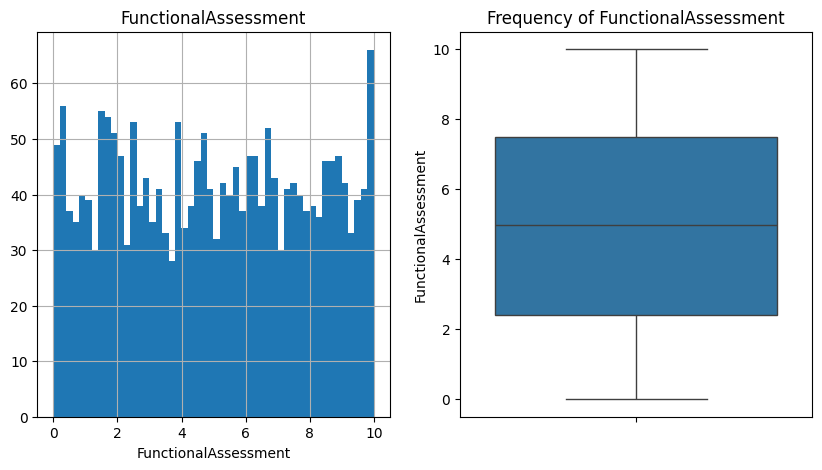

______________________________________________________



In [ ]:
def num_summary(dataframe, numerical_col, plot=False):
    quantiles = [0.05, 0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 0.95, 0.99]
    print(dataframe[numerical_col].describe(quantiles).T)

    if plot:
            fig, axs = plt.subplots(1, 2, figsize=(10, 5))
            plt.subplot(1, 2, 1)
            dataframe[numerical_col].hist(bins=50)
            plt.xlabel(numerical_col)
            plt.title(numerical_col)

            plt.subplot(1, 2, 2)
            sns.boxplot(y=numerical_col, data=dataframe)
            plt.title("Frequency of " + numerical_col)
            plt.xticks(rotation=90)

            plt.show(block=True)

            print("______________________________________________________\n")

for col in num_cols:
    print(col)
    num_summary(dataku, col, plot=True)

In [ ]:
cols = ['Age', 'Gender', 'Ethnicity', 'EducationLevel', 'BMI',
       'Smoking', 'AlcoholConsumption', 'PhysicalActivity', 'DietQuality',
       'SleepQuality', 'FamilyHistoryParkinsons', 'TraumaticBrainInjury',
       'Hypertension', 'Diabetes', 'Depression', 'Stroke', 'SystolicBP',
       'DiastolicBP', 'CholesterolTotal', 'CholesterolLDL', 'CholesterolHDL',
       'CholesterolTriglycerides', 'UPDRS', 'MoCA', 'FunctionalAssessment',
       'Tremor', 'Rigidity', 'Bradykinesia', 'PosturalInstability',
       'SpeechProblems', 'SleepDisorders', 'Constipation']

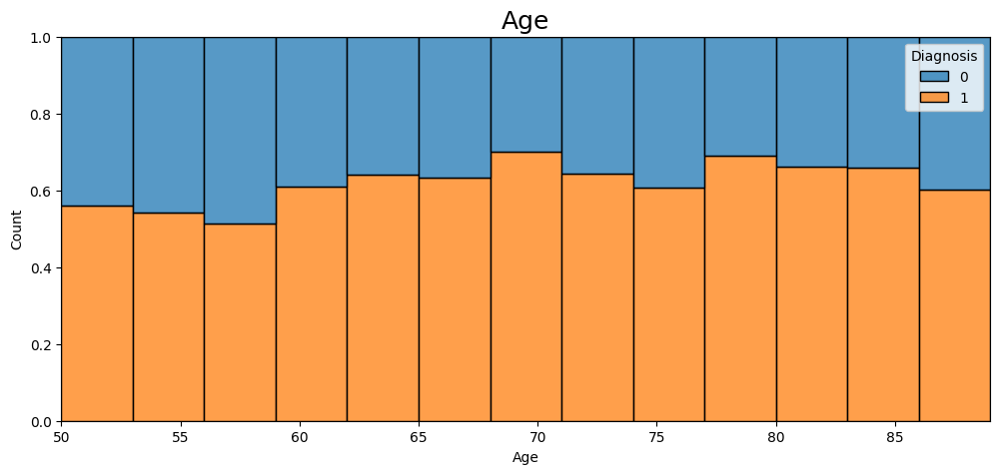

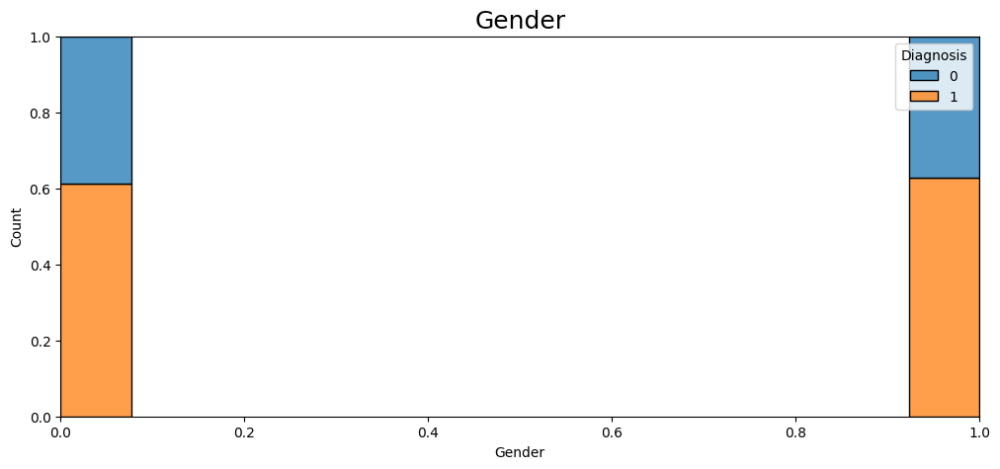

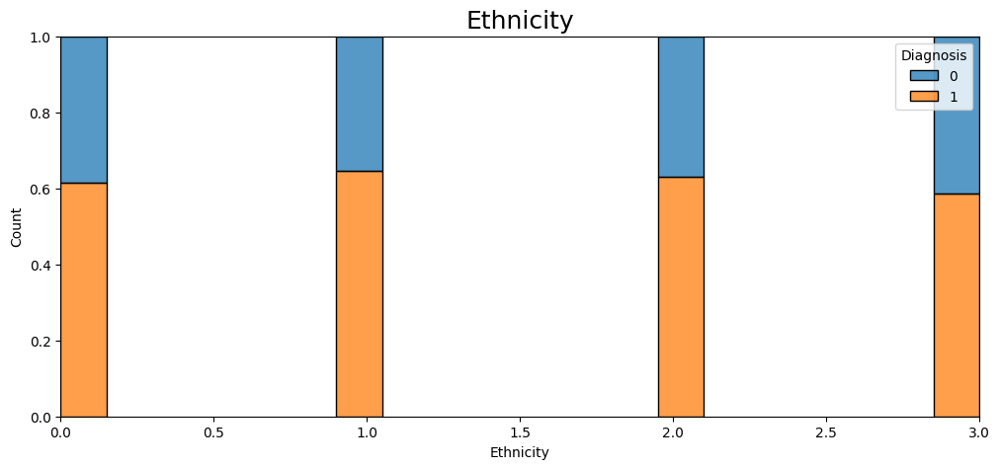

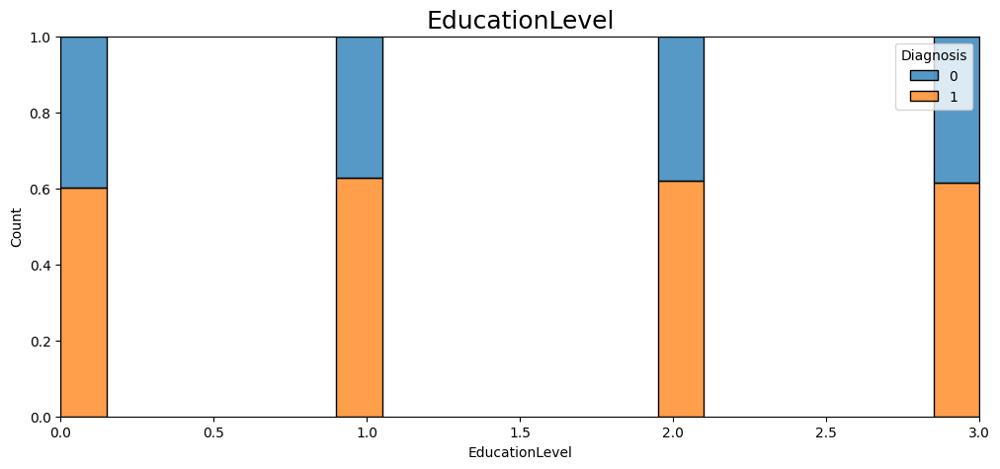

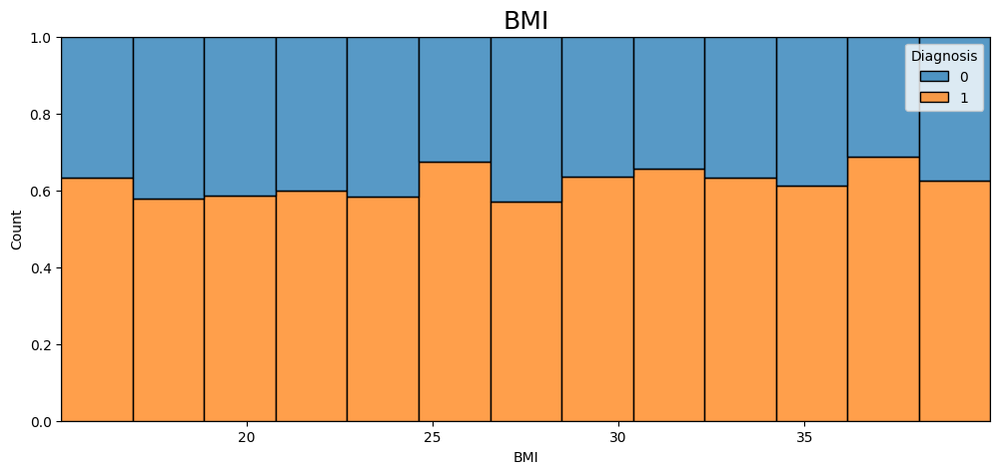

...

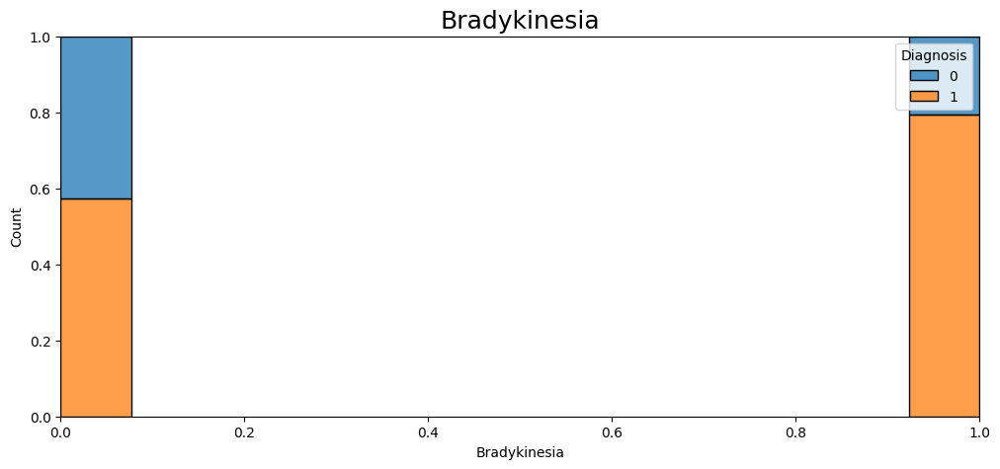

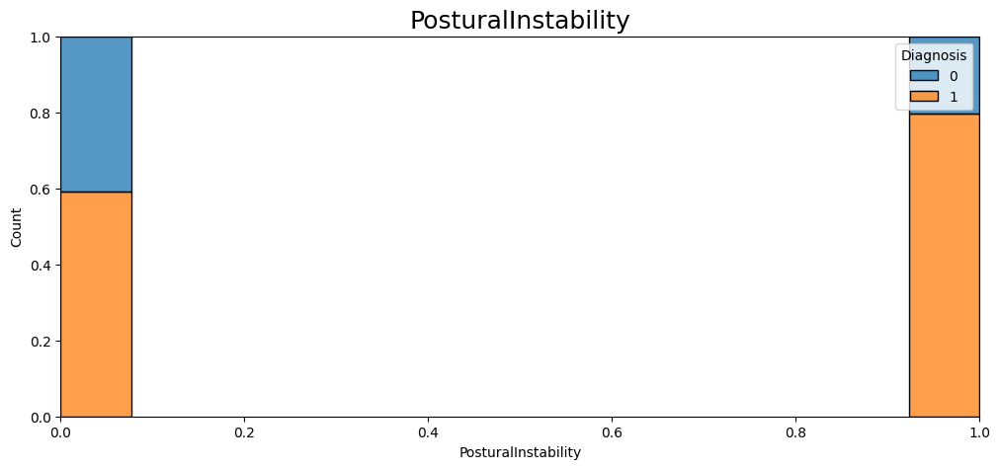

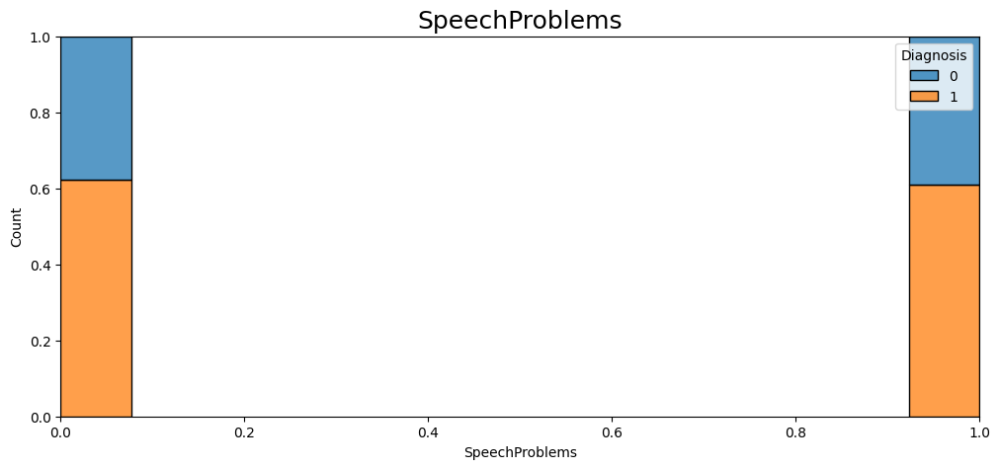

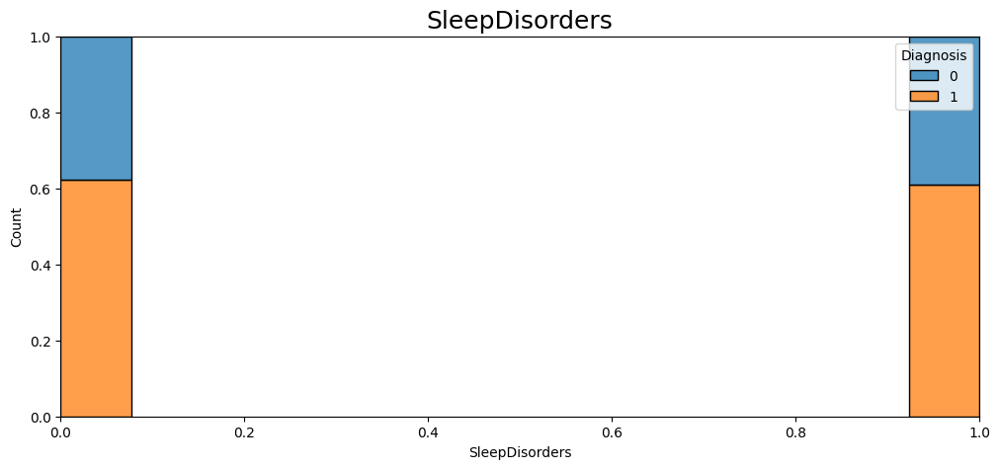

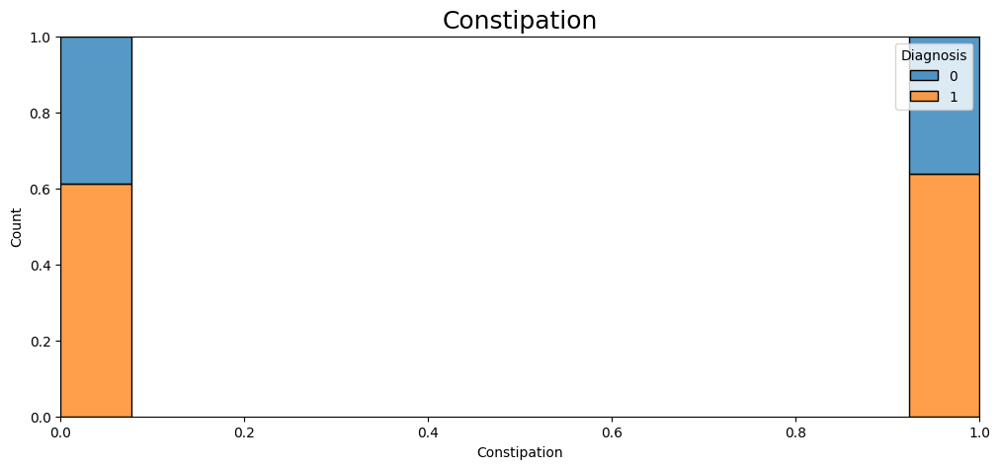

In [ ]:
# Features Histogram Features vs Target
for col in cols:
    fig, ax = plt.subplots(figsize=(12, 5))
    sns.histplot(data=dataku, x=col, hue="Diagnosis", multiple="fill")
    plt.title(col, fontsize = 18)
    plt.show()

In [ ]:
def target_summary_with_num(dataframe, target, numerical_col):
    print(dataframe.groupby(target).agg({numerical_col: "mean"}), end="\n\n\n")

for col in num_cols:
    target_summary_with_num(dataku, "Diagnosis", col)

                 Age
Diagnosis           
0          68.635456
1          70.195552


                 BMI
Diagnosis           
0          26.932601
1          27.379577


           AlcoholConsumption
Diagnosis                    
0                    9.774184
1                   10.203948


           PhysicalActivity
Diagnosis                  
0                  4.968954
1                  5.045987


           DietQuality
Diagnosis             
0             4.997137
1             4.861158


           SleepQuality
Diagnosis              
0              7.093457
1              6.937167


           SystolicBP
Diagnosis            
0          133.868914
1          133.628067


           DiastolicBP
Diagnosis             
0            90.882647
1            89.861196


           CholesterolTotal
Diagnosis                  
0                227.917357
1                226.211859


           CholesterolLDL
Diagnosis                
0              125.333531
1              126.64806

In [ ]:
dataku.head()

,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,...,MoCA,FunctionalAssessment,Tremor,Rigidity,Bradykinesia,PosturalInstability,SpeechProblems,SleepDisorders,Constipation,Diagnosis
0,85,0,3,1,19.619878,0,5.108241,1.380660,3.893969,9.283194,...,29.181289,1.572427,1,0,0,0,0,0,0,0
1,75,0,0,2,16.247339,1,6.027648,8.409804,8.513428,5.602470,...,12.332639,4.787551,0,1,0,1,0,1,0,1
2,70,1,0,0,15.368239,0,2.242135,0.213275,6.498805,9.929824,...,29.927783,2.130686,1,0,0,0,1,0,1,1
3,52,0,0,0,15.454557,0,5.997788,1.375045,6.715033,4.196189,...,21.304268,3.391288,1,1,1,0,0,0,1,1
4,87,0,0,1,18.616042,0,9.775243,1.188607,4.657572,9.363925,...,8.336364,3.200969,0,0,0,1,0,1,0,0


In [ ]:
def outlier_thresholds(dataframe, col_name, q1=0.10, q3=0.90):
    quartile1 = dataframe[col_name].quantile(q1)
    quartile3 = dataframe[col_name].quantile(q3)
    interquantile_range = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * interquantile_range
    low_limit = quartile1 - 1.5 * interquantile_range
    return low_limit, up_limit

def check_outlier(dataframe, col_name):
    low_limit, up_limit = outlier_thresholds(dataframe, col_name)
    if dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None):
        return True
    else:
        return False

def replace_with_thresholds(dataframe, variable, q1=0.05, q3=0.95):
    low_limit, up_limit = outlier_thresholds(dataframe, variable, q1=0.05, q3=0.95)
    dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
    dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit

In [ ]:
for col in dataku[num_cols].columns:
    print(col, check_outlier(dataku, col))
    if check_outlier(dataku, col):
        replace_with_thresholds(dataku, col)

Age False
BMI False
AlcoholConsumption False
PhysicalActivity False
DietQuality False
SleepQuality False
SystolicBP False
DiastolicBP False
CholesterolTotal False
CholesterolLDL False
CholesterolHDL False
CholesterolTriglycerides False
UPDRS False
MoCA False
FunctionalAssessment False


In [ ]:
cat_cols, num_cols, cat_but_car = grab_col_names(dataku)

Observations: 2105
Variables: 33
cat_cols: 18
num_cols: 15
cat_but_car: 0
num_but_cat: 18


In [ ]:
# scaler = MinMaxScaler()
# dataku[num_cols] = scaler.fit_transform(dataku[num_cols])

# dataku.head()

<Axes: >

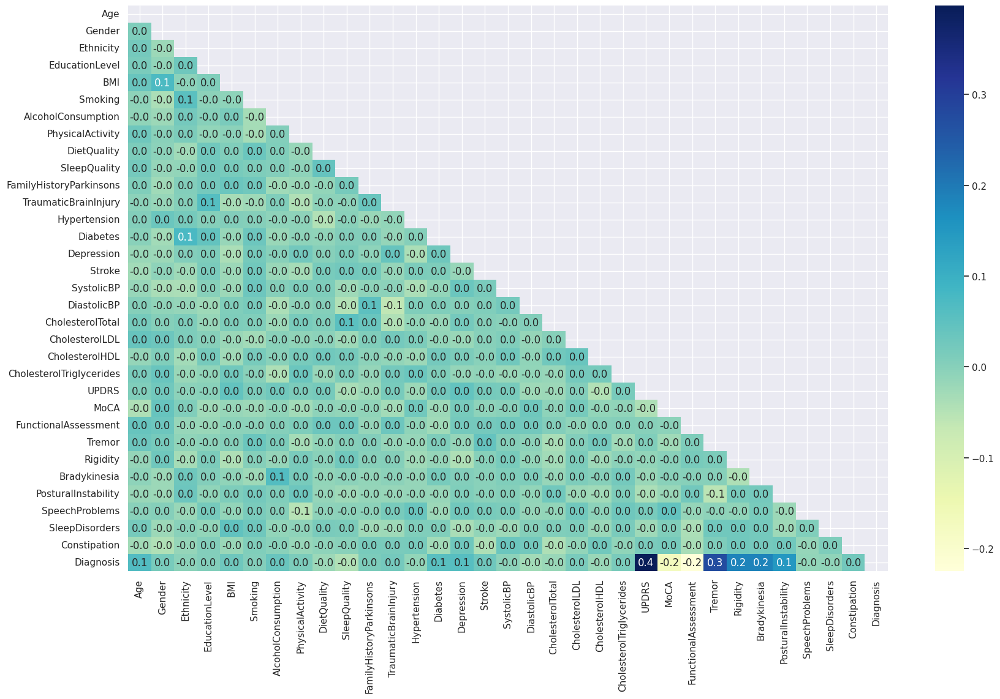

In [ ]:
corr = dataku.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.set(rc={'figure.figsize': (20, 12)})
sns.heatmap(corr, mask = mask, cmap="YlGnBu", annot=True, fmt=".1f")

# KFOLD

**SAMPEL ACAK DATA TRAIN**

In [ ]:
!pip install numpy pandas scikit-learn

**MENENTUKAN NILAI K YANG PALING OPTIMAL**

In [ ]:
import xgboost as xgb
from sklearn.model_selection import cross_val_score, KFold
from sklearn.datasets import load_iris

# Assuming dataku is your DataFrame
# Convert target column to NumPy array
y = dataku["Diagnosis"].values

# Drop target and identifier columns and convert remaining columns to NumPy array
X = dataku.drop(["Diagnosis"], axis=1).values

# Define the XGBoost model
model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')

# K = 5
kf5 = KFold(n_splits=5, shuffle=True, random_state=42)
scores_k5 = cross_val_score(model, X, y, cv=kf5)
mean_score_k5 = scores_k5.mean()
print(f'Mean accuracy with K=5: {mean_score_k5:.4f}')

# K = 10
kf10 = KFold(n_splits=10, shuffle=True, random_state=42)
scores_k10 = cross_val_score(model, X, y, cv=kf10)
mean_score_k10 = scores_k10.mean()
print(f'Mean accuracy with K=10: {mean_score_k10:.4f}')

Mean accuracy with K=5: 0.9283
Mean accuracy with K=10: 0.9259


**SAMPEL ACAK DENGAN K=5**

In [ ]:
pip install pandas openpyxl

In [ ]:
import pandas as pd
from sklearn.model_selection import KFold

# Assuming dataku is your DataFrame
# Convert target column to NumPy array
y = dataku["Diagnosis"].values

# Drop target and identifier columns and convert remaining columns to NumPy array
X = dataku.drop(["Diagnosis"], axis=1).values

# Define the KFold cross-validator with shuffling
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Create an Excel writer object
with pd.ExcelWriter('fold_data.xlsx', engine='openpyxl') as writer:
    # Perform K-Fold Cross Validation with shuffled data
    for fold_number, (train_index, test_index) in enumerate(kf.split(X), start=1):
        # Split the data into training and testing sets for the current fold
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        # Convert to DataFrame
        feature_names = dataku.drop(["Diagnosis"], axis=1).columns

        dataku_train = pd.DataFrame(X_train, columns=feature_names)
        dataku_train['target'] = y_train

        dataku_test = pd.DataFrame(X_test, columns=feature_names)
        dataku_test['target'] = y_test

        # Save DataFrames to different sheets for each fold
        dataku_train.to_excel(writer, sheet_name=f'Fold_{fold_number}_Train', index=False)
        dataku_test.to_excel(writer, sheet_name=f'Fold_{fold_number}_Test', index=False)

        print(f"Fold {fold_number} data has been saved to 'fold_data.xlsx'")

print("All fold data has been saved to 'fold_data.xlsx'.")

Fold 1 data has been saved to 'fold_data.xlsx'
Fold 2 data has been saved to 'fold_data.xlsx'
Fold 3 data has been saved to 'fold_data.xlsx'
Fold 4 data has been saved to 'fold_data.xlsx'
Fold 5 data has been saved to 'fold_data.xlsx'
All fold data has been saved to 'fold_data.xlsx'.


**INITIAL PREDICTION**

# XGBOOST

In [28]:
import pandas as pd
import xgboost as xgb
import numpy as np

# Menyimpan prediksi inisial untuk setiap fold
all_initial_preds = []

# Loop untuk 5 fold
for i in range(1, 6):
    # Load training data untuk fold saat ini
    train_df = pd.read_excel('fold_data.xlsx', sheet_name=f'Fold_{i}_Train')

    # Separate features dan target
    X_train = train_df.drop('target', axis=1)
    y_train = train_df['target']

    # Menghitung jumlah kelas unik
    num_classes = len(np.unique(y_train))

    # Membuat prediksi inisial menggunakan 1 / jumlah kelas
    initial_preds = np.full(shape=(X_train.shape[0],), fill_value=1/num_classes)

    # Menyimpan prediksi inisial untuk fold saat ini
    all_initial_preds.append(initial_preds)

    # Inisialisasi model XGBoost
    model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss')

    # Fit model ke data training
    model.fit(X_train, y_train)

# Menampilkan prediksi inisial untuk setiap fold
for fold_idx, preds in enumerate(all_initial_preds, start=1):
    print(f'Fold {fold_idx} initial predictions: {preds}')

Fold 1 initial predictions: [0.5 0.5 0.5 ... 0.5 0.5 0.5]
Fold 2 initial predictions: [0.5 0.5 0.5 ... 0.5 0.5 0.5]
Fold 3 initial predictions: [0.5 0.5 0.5 ... 0.5 0.5 0.5]
Fold 4 initial predictions: [0.5 0.5 0.5 ... 0.5 0.5 0.5]
Fold 5 initial predictions: [0.5 0.5 0.5 ... 0.5 0.5 0.5]


**RESIDUAL**

In [29]:
import pandas as pd
import xgboost as xgb
import numpy as np

# Menyimpan prediksi inisial dan residual untuk setiap fold
all_initial_preds = []
all_residuals = []

# Loop untuk 5 fold
for i in range(1, 6):
    # Load training data untuk fold saat ini
    train_df = pd.read_excel('fold_data.xlsx', sheet_name=f'Fold_{i}_Train')

    # Separate features dan target
    X_train = train_df.drop('target', axis=1)
    y_train = train_df['target']

    # Menghitung jumlah kelas unik
    num_classes = len(np.unique(y_train))

    # Membuat prediksi inisial menggunakan 1 / jumlah kelas
    initial_preds = np.full(shape=(X_train.shape[0],), fill_value=1/num_classes)

    # Menghitung residual
    residuals = y_train - initial_preds

    # Menyimpan prediksi inisial dan residual untuk fold saat ini
    all_initial_preds.append(initial_preds)
    all_residuals.append(residuals)

# Menampilkan prediksi inisial dan residual untuk setiap fold
for fold_idx, (preds, residuals) in enumerate(zip(all_initial_preds, all_residuals), start=1):
    print(f'Fold {fold_idx} initial predictions: {preds}')
    print(f'Fold {fold_idx} residuals: {residuals.values}')

Fold 1 initial predictions: [0.5 0.5 0.5 ... 0.5 0.5 0.5]
Fold 1 residuals: [-0.5  0.5  0.5 ...  0.5  0.5 -0.5]
Fold 2 initial predictions: [0.5 0.5 0.5 ... 0.5 0.5 0.5]
Fold 2 residuals: [-0.5  0.5  0.5 ...  0.5  0.5 -0.5]
Fold 3 initial predictions: [0.5 0.5 0.5 ... 0.5 0.5 0.5]
Fold 3 residuals: [-0.5  0.5  0.5 ...  0.5  0.5 -0.5]
Fold 4 initial predictions: [0.5 0.5 0.5 ... 0.5 0.5 0.5]
Fold 4 residuals: [ 0.5  0.5  0.5 ... -0.5  0.5  0.5]
Fold 5 initial predictions: [0.5 0.5 0.5 ... 0.5 0.5 0.5]
Fold 5 residuals: [-0.5  0.5  0.5 ...  0.5  0.5 -0.5]


**SIMILARITY SCORE ROOT PER FOLD**

In [30]:
import pandas as pd
import numpy as np

# Menyimpan prediksi inisial, residual, dan similarity score untuk setiap fold
all_initial_preds = []
all_residuals = []
all_similarity_scores = []

# Lambda untuk rumus similarity score
lambda_val = 1

# Loop untuk 5 fold
for i in range(1, 6):
    # Load training data untuk fold saat ini
    train_df = pd.read_excel('fold_data.xlsx', sheet_name=f'Fold_{i}_Train')

    # Separate features dan target
    X_train = train_df.drop('target', axis=1)
    y_train = train_df['target']

    # Menghitung jumlah kelas unik
    num_classes = len(np.unique(y_train))

    # Membuat prediksi inisial menggunakan 1 / jumlah kelas
    initial_preds = np.full(shape=(X_train.shape[0],), fill_value=1/num_classes)

    # Menghitung residual
    residuals = y_train - initial_preds

    # Menghitung similarity score berdasarkan rumus
    numerator = (residuals.sum())**2
    denominator = (initial_preds * (1 - initial_preds)).sum() + lambda_val
    similarity_score = numerator / denominator

    # Menyimpan hasil
    all_initial_preds.append(initial_preds)
    all_residuals.append(residuals)
    all_similarity_scores.append(similarity_score)

# Menampilkan similarity score untuk setiap fold
for fold_idx, similarity_score in enumerate(all_similarity_scores, start=1):
    print(f'Fold {fold_idx} Similarity Score: {similarity_score:.4f}')

Fold 1 Similarity Score: 86.4479
Fold 2 Similarity Score: 100.5592
Fold 3 Similarity Score: 90.1066
Fold 4 Similarity Score: 97.6517
Fold 5 Similarity Score: 105.5000


**SIMILARITY SCORE LEFT, RIGHT, GAIN, DAN POHON TERAKHIR**

Node Metrics:

Internal Nodes:
{'feature': 'UPDRS', 'split_value': 50.0544624, 'similarity_left': 183.30569948186528, 'similarity_right': 321.51914241960185, 'gain': 418.37697460288894}
{'feature': 'Rigidity', 'split_value': 1.0, 'similarity_left': 15.249408050513022, 'similarity_right': 138.93882352941176, 'gain': 67.74036428134657}
{'feature': 'Bradykinesia', 'split_value': 1.0, 'similarity_left': 25.56011949215833, 'similarity_right': 109.94050991501416, 'gain': 49.05276210859428}
{'feature': 'SystolicBP', 'split_value': 93.0, 'similarity_left': 0.8596491228070176, 'similarity_right': 86.0091743119266, 'gain': 0.42095613615541083}
{'feature': 'Tremor', 'split_value': 1.0, 'similarity_left': 0.2976313079299691, 'similarity_right': 220.80582524271844, 'gain': 134.65558925207023}
{'feature': 'PosturalInstability', 'split_value': 1.0, 'similarity_left': 44.76502732240437, 'similarity_right': 69.63157894736842, 'gain': 27.9487389711946}
{'feature': 'FunctionalAssessment', 'split_value': 

<Figure size 2000x1500 with 0 Axes>

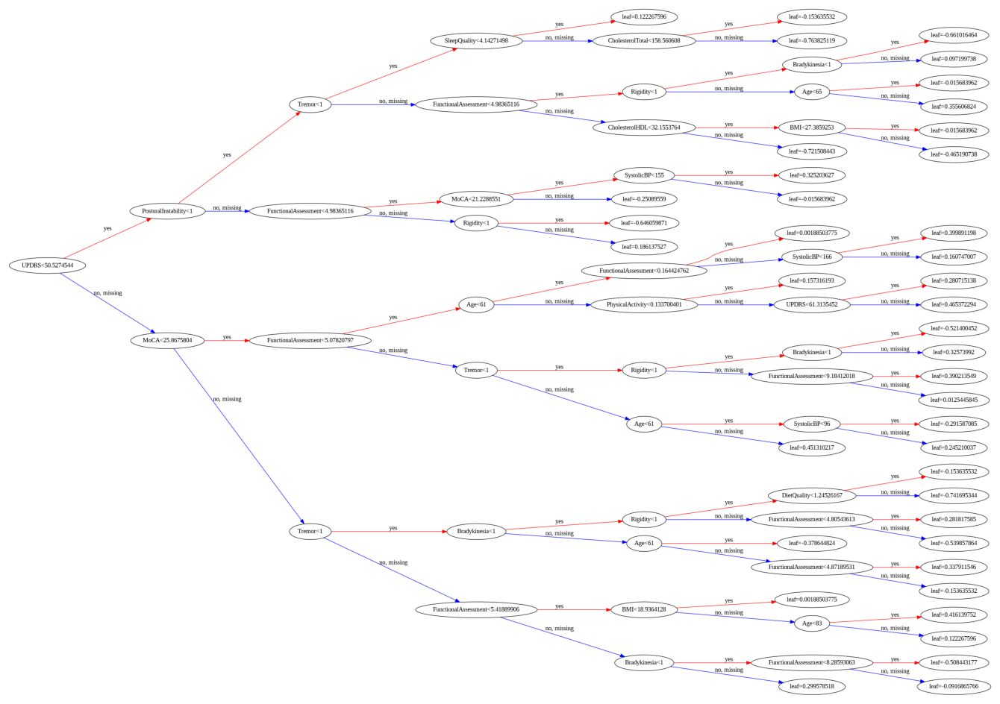

In [33]:
import pandas as pd
import numpy as np
from xgboost import DMatrix, train, plot_tree
import matplotlib.pyplot as plt
from collections import defaultdict

# Parameter lambda untuk rumus similarity score
lambda_val = 1

# Membaca data
fold_data = pd.read_excel('fold_data.xlsx', sheet_name=None)  # Memuat semua sheet

# Fungsi untuk menghitung similarity score
def calculate_similarity_score(residuals, preds, lambda_val):
    numerator = residuals.sum() ** 2
    denominator = (preds * (1 - preds)).sum() + lambda_val
    return numerator / denominator

# Fungsi untuk menghitung gain
def calculate_gain(similarity_left, similarity_right, similarity_root):
    return similarity_left + similarity_right - similarity_root

# Menyimpan hasil similarity score dan gain untuk semua node
node_metrics = defaultdict(list)

# Loop untuk menghitung similarity score per fold
for fold_name, train_df in fold_data.items():
    if "Train" in fold_name:  # Hanya proses data training
        # Separate features dan target
        X_train = train_df.drop('target', axis=1)
        y_train = train_df['target']

        # Prediksi inisial dan residuals (Log Loss)
        initial_preds = np.full(shape=(X_train.shape[0],), fill_value=0.5)  # Probabilitas awal 0.5
        residuals = y_train - initial_preds  # Residuals untuk log loss

        # Membuat DMatrix untuk XGBoost
        dtrain = DMatrix(X_train, label=y_train)
        params = {
            "max_depth": 6,
            "eta": 0.3,
            "objective": "binary:logistic",  # Menggunakan binary log loss
            "eval_metric": "logloss"         # Menentukan metrik evaluasi sebagai log loss
        }
        xgb_model = train(params, dtrain, num_boost_round=1)

        # Ekstrak dump dari model untuk mendapatkan struktur pohon
        tree_dump = xgb_model.get_dump(with_stats=True)

        # Hitung similarity score untuk root node
        similarity_root = calculate_similarity_score(residuals, initial_preds, lambda_val)

        # Parsel setiap node dalam pohon
        for line in tree_dump[0].splitlines():
            if "leaf=" in line:  # Leaf node
                # Leaf node tidak memiliki gain
                continue
            else:  # Internal node
                # Dapatkan nama fitur pemisahan dan nilai split
                split_feature = line.split("[")[1].split("<")[0]
                split_value = float(line.split("<")[1].split("]")[0])

                # Mask untuk memisahkan data left dan right
                mask_left = X_train[split_feature] < split_value
                mask_right = ~mask_left

                # Residuals dan predictions untuk cabang kiri dan kanan
                residuals_left = residuals[mask_left]
                residuals_right = residuals[mask_right]

                preds_left = initial_preds[mask_left]
                preds_right = initial_preds[mask_right]

                # Hitung similarity score untuk cabang kiri dan kanan
                similarity_left = calculate_similarity_score(residuals_left, preds_left, lambda_val)
                similarity_right = calculate_similarity_score(residuals_right, preds_right, lambda_val)

                # Hitung gain
                gain = calculate_gain(similarity_left, similarity_right, similarity_root)

                # Simpan hasil untuk setiap node
                node_metrics["internal"].append({
                    "feature": split_feature,
                    "split_value": split_value,
                    "similarity_left": similarity_left,
                    "similarity_right": similarity_right,
                    "gain": gain
                })

# Menampilkan hasil similarity score dan gain
print("Node Metrics:")
for node_type, metrics in node_metrics.items():
    print(f"\n{node_type.capitalize()} Nodes:")
    for metric in metrics:
        print(metric)

# Visualisasi pohon menggunakan XGBoost
plt.figure(figsize=(20, 15))
plot_tree(xgb_model, num_trees=0, rankdir='LR')
plt.show()

**NILAI COVER**

In [34]:
# Fungsi untuk menghitung cover keseluruhan
def calculate_cover(preds):
    cover = np.sum(preds * (1 - preds))  # Menggunakan rumus Cover
    return cover

# Loop untuk menghitung cover per fold
for fold_name, train_df in fold_data.items():
    if "Train" in fold_name:  # Hanya proses data training
        # Separate features dan target
        X_train = train_df.drop('target', axis=1)
        y_train = train_df['target']

        # Membuat DMatrix untuk XGBoost
        dtrain = DMatrix(X_train, label=y_train)
        params = {
            "max_depth": 6,
            "eta": 0.3,
            "objective": "binary:logistic",  # Menggunakan binary log loss
            "eval_metric": "logloss"         # Menentukan metrik evaluasi sebagai log loss
        }
        xgb_model = train(params, dtrain, num_boost_round=1)

        # Mendapatkan prediksi dari model
        preds = xgb_model.predict(dtrain)  # Prediksi probabilitas

        # Hitung nilai Cover keseluruhan
        cover_total = calculate_cover(preds)

        # Menampilkan nilai Cover untuk fold ini
        print(f"Cover untuk fold {fold_name}: {cover_total}")

Cover untuk fold Fold_1_Train: 376.878173828125
Cover untuk fold Fold_2_Train: 373.4209899902344
Cover untuk fold Fold_3_Train: 375.8702087402344
Cover untuk fold Fold_4_Train: 373.4525146484375
Cover untuk fold Fold_5_Train: 373.5839538574219


**WEIGHTED SUM**

In [35]:
import pandas as pd
import numpy as np
from xgboost import DMatrix, train
import matplotlib.pyplot as plt

# Membaca data
fold_data = pd.read_excel('fold_data.xlsx', sheet_name=None)  # Memuat semua sheet

# Fungsi untuk menghitung weighted sum
def calculate_weighted_sum(preds, learning_rate):
    weighted_sum = np.sum(preds * learning_rate)  # Menghitung weighted sum dengan learning rate
    return weighted_sum

# Nilai learning rate
learning_rate = 0.3

# Loop untuk menghitung weighted sum per fold
for fold_name, train_df in fold_data.items():
    if "Train" in fold_name:  # Hanya proses data training
        # Pisahkan fitur dan target
        X_train = train_df.drop('target', axis=1)
        y_train = train_df['target']

        # Membuat DMatrix untuk XGBoost
        dtrain = DMatrix(X_train, label=y_train)
        params = {
            "max_depth": 6,
            "eta": learning_rate,  # Menyesuaikan learning rate
            "objective": "binary:logistic",  # Menggunakan binary log loss
            "eval_metric": "logloss"         # Menentukan metrik evaluasi sebagai log loss
        }
        xgb_model = train(params, dtrain, num_boost_round=1)

        # Mendapatkan prediksi dari model
        preds = xgb_model.predict(dtrain)  # Prediksi probabilitas

        # Hitung weighted sum dengan learning rate
        weighted_sum = calculate_weighted_sum(preds, learning_rate)

        # Menampilkan weighted sum untuk fold ini
        print(f"Weighted sum untuk fold {fold_name}: {weighted_sum}")

# # Visualisasi pohon menggunakan XGBoost
# plt.figure(figsize=(20, 15))
# plot_tree(xgb_model, num_trees=0, rankdir='LR')
# plt.show()

Weighted sum untuk fold Fold_1_Train: 307.0167236328125
Weighted sum untuk fold Fold_2_Train: 311.2204895019531
Weighted sum untuk fold Fold_3_Train: 307.9703369140625
Weighted sum untuk fold Fold_4_Train: 310.59429931640625
Weighted sum untuk fold Fold_5_Train: 312.4713134765625


**NILAI LEAF NODE**


All Leaf Nodes:
				15:leaf=-0.195701048,cover=1.90051663
				16:leaf=-0.733107984,cover=49.4134331
					31:leaf=-0.689325213,cover=8.31476021
					32:leaf=-0.195701048,cover=1.90051663
						57:leaf=0.321448237,cover=1.90051663
						58:leaf=-0.0991047844,cover=2.37564588
					34:leaf=-0.482239217,cover=1.66295207
				19:leaf=0.129228324,cover=1.18782294
						59:leaf=-0.276848555,cover=2.37564588
						60:leaf=-0.698701501,cover=9.5025835
					36:leaf=-0.00789429434,cover=1.18782294
					37:leaf=-0.0827602148,cover=1.4253875
					38:leaf=0.397604018,cover=4.27616262
					39:leaf=-0.482239217,cover=1.66295207
					40:leaf=-0.0316114761,cover=1.66295207
						61:leaf=0.283885002,cover=4.27616262
						62:leaf=-0.143746555,cover=2.13808131
						63:leaf=0.0955181494,cover=4.03859806
						64:leaf=0.414556265,cover=25.1818447
					43:leaf=0.164622948,cover=1.4253875
					44:leaf=0.4626396,cover=91.6999283
						65:leaf=-0.577927411,cover=44.6621399
						66:leaf=0.366194725,cover=12.590

<Figure size 2000x1500 with 0 Axes>

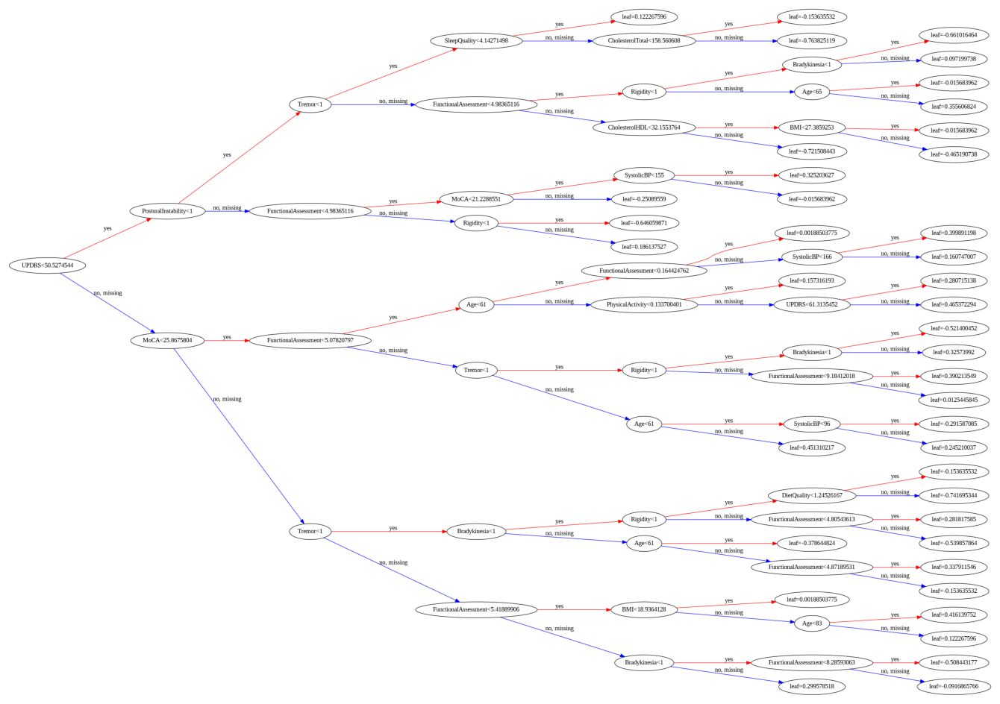

In [36]:
import pandas as pd
import numpy as np
from xgboost import DMatrix, train, plot_tree
import matplotlib.pyplot as plt
from collections import defaultdict

# Parameter lambda untuk rumus similarity score
lambda_val = 1

# Membaca data
fold_data = pd.read_excel('fold_data.xlsx', sheet_name=None)  # Memuat semua sheet

# Fungsi untuk menghitung similarity score
def calculate_similarity_score(residuals, preds, lambda_val):
    numerator = residuals.sum() ** 2
    denominator = (preds * (1 - preds)).sum() + lambda_val
    return numerator / denominator

# Fungsi untuk menghitung gain
def calculate_gain(similarity_left, similarity_right, similarity_root):
    return similarity_left + similarity_right - similarity_root

# Menyimpan hasil similarity score dan gain untuk semua node
node_metrics = defaultdict(list)
leaf_node_count = 0  # Untuk menghitung jumlah leaf nodes
all_leaf_nodes = []  # Untuk menyimpan semua leaf nodes

# Loop untuk menghitung similarity score per fold
for fold_name, train_df in fold_data.items():
    if "Train" in fold_name:  # Hanya proses data training
        # Pisahkan fitur dan target
        X_train = train_df.drop('target', axis=1)
        y_train = train_df['target']

        # Prediksi inisial dan residuals (Log Loss)
        initial_preds = np.full(shape=(X_train.shape[0],), fill_value=0.5)  # Probabilitas awal 0.5
        residuals = y_train - initial_preds  # Residuals untuk log loss

        # Membuat DMatrix untuk XGBoost
        dtrain = DMatrix(X_train, label=y_train)
        params = {
            "max_depth": 6,
            "eta": 0.3,
            "objective": "binary:logistic",  # Menggunakan binary log loss
            "eval_metric": "logloss"         # Menentukan metrik evaluasi sebagai log loss
        }
        xgb_model = train(params, dtrain, num_boost_round=1)

        # Ekstrak dump dari model untuk mendapatkan struktur pohon
        tree_dump = xgb_model.get_dump(with_stats=True)

        # Hitung similarity score untuk root node
        similarity_root = calculate_similarity_score(residuals, initial_preds, lambda_val)

        # Parsel setiap node dalam pohon
        for line in tree_dump[0].splitlines():
            if "leaf=" in line:  # Leaf node
                leaf_node_count += 1  # Menghitung leaf node
                all_leaf_nodes.append(line)  # Menyimpan seluruh leaf node
                continue
            else:  # Internal node
                # Dapatkan nama fitur pemisahan dan nilai split
                split_feature = line.split("[")[1].split("<")[0]
                split_value = float(line.split("<")[1].split("]")[0])

                # Mask untuk memisahkan data left dan right
                mask_left = X_train[split_feature] < split_value
                mask_right = ~mask_left

                # Residuals dan predictions untuk cabang kiri dan kanan
                residuals_left = residuals[mask_left]
                residuals_right = residuals[mask_right]

                preds_left = initial_preds[mask_left]
                preds_right = initial_preds[mask_right]

                # Hitung similarity score untuk cabang kiri dan kanan
                similarity_left = calculate_similarity_score(residuals_left, preds_left, lambda_val)
                similarity_right = calculate_similarity_score(residuals_right, preds_right, lambda_val)

                # Hitung gain
                gain = calculate_gain(similarity_left, similarity_right, similarity_root)

                # Simpan hasil untuk setiap node
                node_metrics["internal"].append({
                    "feature": split_feature,
                    "split_value": split_value,
                    "similarity_left": similarity_left,
                    "similarity_right": similarity_right,
                    "gain": gain
                })

# Menampilkan hasil jumlah leaf node
# print(f"Jumlah Leaf Nodes: {leaf_node_count}")

# Menampilkan seluruh leaf nodes
print("\nAll Leaf Nodes:")
for leaf in all_leaf_nodes:
    print(leaf)

# Menampilkan hasil similarity score dan gain
print("\nNode Metrics:")
for node_type, metrics in node_metrics.items():
    print(f"\n{node_type.capitalize()} Nodes:")
    for metric in metrics:
        print(metric)

# Visualisasi pohon menggunakan XGBoost
plt.figure(figsize=(20, 15))
plot_tree(xgb_model, num_trees=0, rankdir='LR')
plt.show()

**OUTPUT VALUE**

In [38]:
import pandas as pd
import xgboost as xgb
import numpy as np

# Menyimpan prediksi inisial dan residual untuk setiap fold
all_initial_preds = []
all_residuals = []
output_values = []  # List untuk menyimpan output value

# Parameter lambda
lambda_value = 1.0  # Sesuaikan dengan kebutuhan

# Loop untuk 5 fold
for i in range(1, 6):
    # Load training data untuk fold saat ini
    train_df = pd.read_excel('fold_data.xlsx', sheet_name=f'Fold_{i}_Train')

    # Separate features dan target
    X_train = train_df.drop('target', axis=1)
    y_train = train_df['target']

    # Menghitung jumlah kelas unik
    num_classes = len(np.unique(y_train))

    # Membuat prediksi inisial menggunakan 1 / jumlah kelas
    initial_preds = np.full(shape=(X_train.shape[0],), fill_value=1 / num_classes)

    # Menghitung residual
    residuals = y_train - initial_preds

    # Menyimpan prediksi inisial dan residual untuk fold saat ini
    all_initial_preds.append(initial_preds)
    all_residuals.append(residuals)

    # Menghitung output value
    numerator = np.sum(residuals)
    denominator = np.sum(initial_preds * (1 - initial_preds)) + lambda_value
    output_value = numerator / denominator

    # Menyimpan output value
    output_values.append(output_value)

    # Menampilkan hasil untuk setiap fold
    print(f'Fold {i} initial predictions: {initial_preds}')
    print(f'Fold {i} residuals: {residuals.values}')
    print(f'Fold {i} Output Value: {output_value}')

# Menampilkan output value untuk setiap fold
print("\nOutput Values for All Folds:", output_values)


Fold 1 initial predictions: [0.5 0.5 0.5 ... 0.5 0.5 0.5]
Fold 1 residuals: [-0.5  0.5  0.5 ...  0.5  0.5 -0.5]
Fold 1 Output Value: 0.45260663507109006
Fold 2 initial predictions: [0.5 0.5 0.5 ... 0.5 0.5 0.5]
Fold 2 residuals: [-0.5  0.5  0.5 ...  0.5  0.5 -0.5]
Fold 2 Output Value: 0.4881516587677725
Fold 3 initial predictions: [0.5 0.5 0.5 ... 0.5 0.5 0.5]
Fold 3 residuals: [-0.5  0.5  0.5 ...  0.5  0.5 -0.5]
Fold 3 Output Value: 0.46208530805687204
Fold 4 initial predictions: [0.5 0.5 0.5 ... 0.5 0.5 0.5]
Fold 4 residuals: [ 0.5  0.5  0.5 ... -0.5  0.5  0.5]
Fold 4 Output Value: 0.48104265402843605
Fold 5 initial predictions: [0.5 0.5 0.5 ... 0.5 0.5 0.5]
Fold 5 residuals: [-0.5  0.5  0.5 ...  0.5  0.5 -0.5]
Fold 5 Output Value: 0.5

Output Values for All Folds: [0.45260663507109006, 0.4881516587677725, 0.46208530805687204, 0.48104265402843605, 0.5]


**OUTPUT VALUE TIAP LEAF**

Node Metrics:

Internal Nodes:
{'feature': 'UPDRS', 'split_value': 50.0544624, 'similarity_left': 183.30569948186528, 'similarity_right': 321.51914241960185, 'gain': 418.37697460288894}
{'feature': 'Rigidity', 'split_value': 1.0, 'similarity_left': 15.249408050513022, 'similarity_right': 138.93882352941176, 'gain': 67.74036428134657}
{'feature': 'Bradykinesia', 'split_value': 1.0, 'similarity_left': 25.56011949215833, 'similarity_right': 109.94050991501416, 'gain': 49.05276210859428}
{'feature': 'SystolicBP', 'split_value': 93.0, 'similarity_left': 0.8596491228070176, 'similarity_right': 86.0091743119266, 'gain': 0.42095613615541083}
{'feature': 'Tremor', 'split_value': 1.0, 'similarity_left': 0.2976313079299691, 'similarity_right': 220.80582524271844, 'gain': 134.65558925207023}
{'feature': 'PosturalInstability', 'split_value': 1.0, 'similarity_left': 44.76502732240437, 'similarity_right': 69.63157894736842, 'gain': 27.9487389711946}
{'feature': 'FunctionalAssessment', 'split_value': 

<Figure size 2000x1500 with 0 Axes>

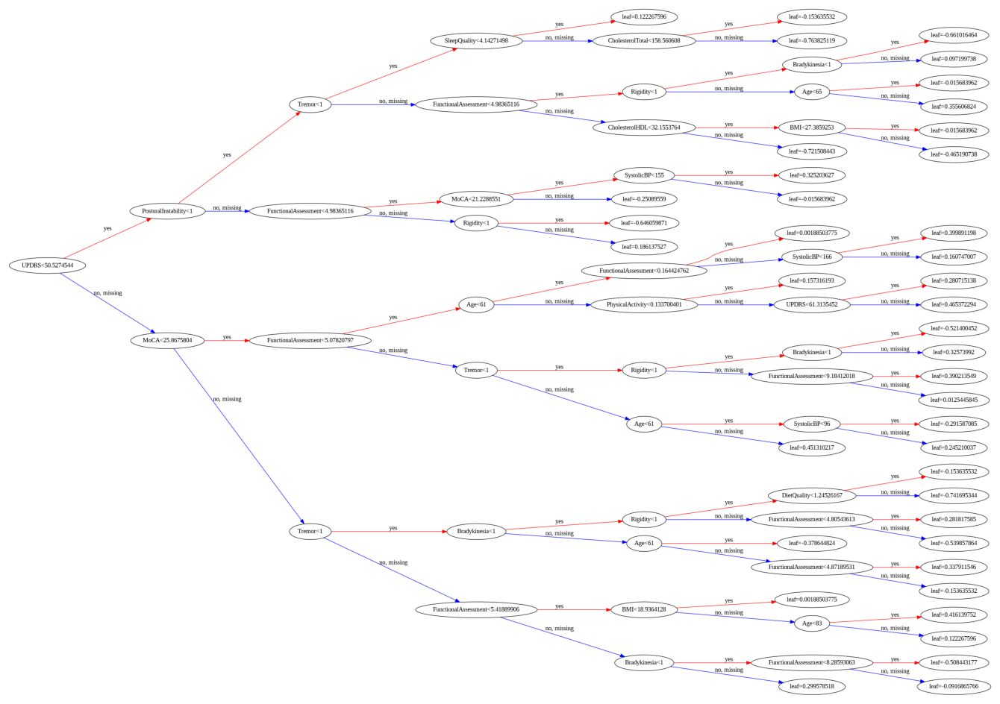

In [39]:
# Parameter lambda untuk rumus similarity score
lambda_val = 1

# Membaca data
fold_data = pd.read_excel('fold_data.xlsx', sheet_name=None)  # Memuat semua sheet

# Fungsi untuk menghitung similarity score
def calculate_similarity_score(residuals, preds, lambda_val):
    numerator = residuals.sum() ** 2
    denominator = (preds * (1 - preds)).sum() + lambda_val
    return numerator / denominator

# Fungsi untuk menghitung gain
def calculate_gain(similarity_left, similarity_right, similarity_root):
    return similarity_left + similarity_right - similarity_root

# Fungsi untuk menghitung output value pada leaf node
def calculate_output_value(residuals, preds, lambda_val):
    numerator = -residuals.sum()
    denominator = (preds * (1 - preds)).sum() + lambda_val
    return numerator / denominator

# Menyimpan hasil similarity score, gain, dan output value
node_metrics = defaultdict(list)

# Loop untuk menghitung similarity score dan output value per fold
for fold_name, train_df in fold_data.items():
    if "Train" in fold_name:  # Hanya proses data training
        # Separate features dan target
        X_train = train_df.drop('target', axis=1)
        y_train = train_df['target']

        # Prediksi inisial dan residuals (Log Loss)
        initial_preds = np.full(shape=(X_train.shape[0],), fill_value=0.5)  # Probabilitas awal 0.5
        residuals = y_train - initial_preds  # Residuals untuk log loss

        # Membuat DMatrix untuk XGBoost
        dtrain = DMatrix(X_train, label=y_train)
        params = {
            "max_depth": 6,
            "eta": 0.3,
            "objective": "binary:logistic",  # Menggunakan binary log loss
            "eval_metric": "logloss"         # Menentukan metrik evaluasi sebagai log loss
        }
        xgb_model = train(params, dtrain, num_boost_round=1)

        # Ekstrak dump dari model untuk mendapatkan struktur pohon
        tree_dump = xgb_model.get_dump(with_stats=True)

        # Hitung similarity score untuk root node
        similarity_root = calculate_similarity_score(residuals, initial_preds, lambda_val)

        # Parsel setiap node dalam pohon
        for line in tree_dump[0].splitlines():
            if "leaf=" in line:  # Leaf node
                # Ekstrak leaf value
                leaf_value = float(line.split("leaf=")[1].split(",")[0])

                # Hitung output value untuk leaf
                mask_leaf = residuals != 0  # Dummy mask karena leaf tidak memiliki split
                output_value = calculate_output_value(residuals[mask_leaf], initial_preds[mask_leaf], lambda_val)

                # Simpan hasil untuk leaf node
                node_metrics["leaf"].append({
                    "leaf_value": leaf_value,
                    "output_value": output_value
                })
            else:  # Internal node
                # Dapatkan nama fitur pemisahan dan nilai split
                split_feature = line.split("[")[1].split("<")[0]
                split_value = float(line.split("<")[1].split("]")[0])

                # Mask untuk memisahkan data left dan right
                mask_left = X_train[split_feature] < split_value
                mask_right = ~mask_left

                # Residuals dan predictions untuk cabang kiri dan kanan
                residuals_left = residuals[mask_left]
                residuals_right = residuals[mask_right]

                preds_left = initial_preds[mask_left]
                preds_right = initial_preds[mask_right]

                # Hitung similarity score untuk cabang kiri dan kanan
                similarity_left = calculate_similarity_score(residuals_left, preds_left, lambda_val)
                similarity_right = calculate_similarity_score(residuals_right, preds_right, lambda_val)

                # Hitung gain
                gain = calculate_gain(similarity_left, similarity_right, similarity_root)

                # Simpan hasil untuk setiap node
                node_metrics["internal"].append({
                    "feature": split_feature,
                    "split_value": split_value,
                    "similarity_left": similarity_left,
                    "similarity_right": similarity_right,
                    "gain": gain
                })

# Menampilkan hasil similarity score, gain, dan output value
print("Node Metrics:")
for node_type, metrics in node_metrics.items():
    print(f"\n{node_type.capitalize()} Nodes:")
    for metric in metrics:
        print(metric)

# Visualisasi pohon menggunakan XGBoost
plt.figure(figsize=(20, 15))
plot_tree(xgb_model, num_trees=0, rankdir='LR')
plt.show()

**LOG ODDS TIAP FOLD**

In [40]:
# Menambahkan kolom baru untuk menyimpan log odds dan prediksi baru
node_metrics["predictions"] = []

# Loop untuk menghitung log odds dan prediksi baru
for fold_name, train_df in fold_data.items():
    if "Train" in fold_name:
        # Separate features dan target
        X_train = train_df.drop('target', axis=1)
        y_train = train_df['target']

        # Prediksi inisial dan residuals
        initial_preds = np.full(shape=(X_train.shape[0],), fill_value=0.5)  # Probabilitas awal 0.5
        residuals = y_train - initial_preds

        # Iterasi pada setiap node
        for node in node_metrics["leaf"]:  # Loop hanya pada leaf nodes
            # Output value dari node
            output_value = node["output_value"]

            # Hitung log odds awal (dengan pi = 0.5, log odds = 0)
            log_odds_initial = 0  # Karena log(0.5 / (1 - 0.5)) = 0

            # Hitung log odds baru
            log_odds_new = log_odds_initial + 0.3 * output_value

            # Konversikan ke probabilitas baru
            prob_new = np.exp(log_odds_new) / (1 + np.exp(log_odds_new))

            # Simpan hasil
            node_metrics["predictions"].append({
                "fold_name": fold_name,
                "log_odds_new": log_odds_new,
                "prob_new": prob_new
            })

# Menampilkan hasil prediksi baru
print("Predictions:")
for pred in node_metrics["predictions"]:
    print(pred)

Predictions:
{'fold_name': 'Fold_1_Train', 'log_odds_new': -0.135781990521327, 'prob_new': 0.46610656011237034}
{'fold_name': 'Fold_1_Train', 'log_odds_new': -0.135781990521327, 'prob_new': 0.46610656011237034}
{'fold_name': 'Fold_1_Train', 'log_odds_new': -0.135781990521327, 'prob_new': 0.46610656011237034}
{'fold_name': 'Fold_1_Train', 'log_odds_new': -0.135781990521327, 'prob_new': 0.46610656011237034}
{'fold_name': 'Fold_1_Train', 'log_odds_new': -0.135781990521327, 'prob_new': 0.46610656011237034}
{'fold_name': 'Fold_1_Train', 'log_odds_new': -0.135781990521327, 'prob_new': 0.46610656011237034}
{'fold_name': 'Fold_1_Train', 'log_odds_new': -0.135781990521327, 'prob_new': 0.46610656011237034}
{'fold_name': 'Fold_1_Train', 'log_odds_new': -0.135781990521327, 'prob_new': 0.46610656011237034}
{'fold_name': 'Fold_1_Train', 'log_odds_new': -0.135781990521327, 'prob_new': 0.46610656011237034}
{'fold_name': 'Fold_1_Train', 'log_odds_new': -0.135781990521327, 'prob_new': 0.4661065601123703

**NEW PREDICTION**

In [42]:
# Menambahkan kolom baru untuk menyimpan log odds dan prediksi baru
node_metrics["predictions"] = []

# Loop untuk menghitung log odds dan prediksi baru
for fold_name, train_df in fold_data.items():
    if "Train" in fold_name:
        # Separate features dan target
        X_train = train_df.drop('target', axis=1)
        y_train = train_df['target']

        # Prediksi inisial dan residuals
        initial_preds = np.full(shape=(X_train.shape[0],), fill_value=0.5)  # Probabilitas awal 0.5
        residuals = y_train - initial_preds

        # Iterasi pada setiap node
        for node in node_metrics["leaf"]:  # Loop hanya pada leaf nodes
            # Output value dari node
            output_value = node["output_value"]

            # Hitung log odds awal (dengan pi = 0.5, log odds = 0)
            log_odds_initial = 0  # Karena log(0.5 / (1 - 0.5)) = 0

            # Hitung log odds baru
            log_odds_new = log_odds_initial + 0.3 * output_value

            # Konversikan ke probabilitas baru
            prob_new = np.exp(log_odds_new) / (1 + np.exp(log_odds_new))

            # Simpan hasil
            node_metrics["predictions"].append({
                "fold_name": fold_name,
                "log_odds_new": log_odds_new,
                "prob_new": prob_new
            })

# Menampilkan hasil prediksi baru
print("Predictions:")
for pred in node_metrics["predictions"]:
    print(pred)

Predictions:
{'fold_name': 'Fold_1_Train', 'log_odds_new': -0.135781990521327, 'prob_new': 0.46610656011237034}
{'fold_name': 'Fold_1_Train', 'log_odds_new': -0.135781990521327, 'prob_new': 0.46610656011237034}
{'fold_name': 'Fold_1_Train', 'log_odds_new': -0.135781990521327, 'prob_new': 0.46610656011237034}
{'fold_name': 'Fold_1_Train', 'log_odds_new': -0.135781990521327, 'prob_new': 0.46610656011237034}
{'fold_name': 'Fold_1_Train', 'log_odds_new': -0.135781990521327, 'prob_new': 0.46610656011237034}
{'fold_name': 'Fold_1_Train', 'log_odds_new': -0.135781990521327, 'prob_new': 0.46610656011237034}
{'fold_name': 'Fold_1_Train', 'log_odds_new': -0.135781990521327, 'prob_new': 0.46610656011237034}
{'fold_name': 'Fold_1_Train', 'log_odds_new': -0.135781990521327, 'prob_new': 0.46610656011237034}
{'fold_name': 'Fold_1_Train', 'log_odds_new': -0.135781990521327, 'prob_new': 0.46610656011237034}
{'fold_name': 'Fold_1_Train', 'log_odds_new': -0.135781990521327, 'prob_new': 0.4661065601123703

**SIGMOID BINER**

In [43]:
# Menambahkan kolom baru untuk menyimpan log odds dan prediksi baru
node_metrics["predictions"] = []

# Faktor pengali alpha
alpha = 0.3

# Loop untuk menghitung log odds dan prediksi baru
for fold_name, train_df in fold_data.items():
    if "Train" in fold_name:
        # Separate features dan target
        X_train = train_df.drop('target', axis=1)
        y_train = train_df['target']

        # Prediksi inisial dan residuals
        initial_preds = np.full(shape=(X_train.shape[0],), fill_value=0.5)  # Probabilitas awal 0.5
        residuals = y_train - initial_preds

        # Iterasi pada setiap node
        for node in node_metrics["leaf"]:  # Loop hanya pada leaf nodes
            # Output value dari node
            output_value = node["output_value"]

            # Hitung log odds awal (dengan pi = 0.5, log odds = 0)
            log_odds_initial = 0  # Karena log(0.5 / (1 - 0.5)) = 0

            # Hitung log odds baru
            log_odds_new = log_odds_initial + alpha * output_value

            # Konversikan ke probabilitas baru
            prob_new = np.exp(log_odds_new) / (1 + np.exp(log_odds_new))

            # Simpan hasil
            node_metrics["predictions"].append({
                "fold_name": fold_name,
                "log_odds_new": log_odds_new,
                "prob_new": prob_new
            })

# Menampilkan hasil prediksi baru
print("Predictions:")
for pred in node_metrics["predictions"]:
    print(f"Fold: {pred['fold_name']}, Log Odds: {pred['log_odds_new']:.4f}, Probability: {pred['prob_new']:.4f}")


Predictions:
Fold: Fold_1_Train, Log Odds: -0.1358, Probability: 0.4661
Fold: Fold_1_Train, Log Odds: -0.1358, Probability: 0.4661
Fold: Fold_1_Train, Log Odds: -0.1358, Probability: 0.4661
Fold: Fold_1_Train, Log Odds: -0.1358, Probability: 0.4661
Fold: Fold_1_Train, Log Odds: -0.1358, Probability: 0.4661
Fold: Fold_1_Train, Log Odds: -0.1358, Probability: 0.4661
Fold: Fold_1_Train, Log Odds: -0.1358, Probability: 0.4661
Fold: Fold_1_Train, Log Odds: -0.1358, Probability: 0.4661
Fold: Fold_1_Train, Log Odds: -0.1358, Probability: 0.4661
Fold: Fold_1_Train, Log Odds: -0.1358, Probability: 0.4661
Fold: Fold_1_Train, Log Odds: -0.1358, Probability: 0.4661
Fold: Fold_1_Train, Log Odds: -0.1358, Probability: 0.4661
Fold: Fold_1_Train, Log Odds: -0.1358, Probability: 0.4661
Fold: Fold_1_Train, Log Odds: -0.1358, Probability: 0.4661
Fold: Fold_1_Train, Log Odds: -0.1358, Probability: 0.4661
Fold: Fold_1_Train, Log Odds: -0.1358, Probability: 0.4661
Fold: Fold_1_Train, Log Odds: -0.1358, Prob

# DEFAULT

Fold 1 Training Confusion Matrix:
 [[ 651    0]
 [   0 1033]]
Fold 1 Testing Confusion Matrix:
 [[139  11]
 [ 25 246]]


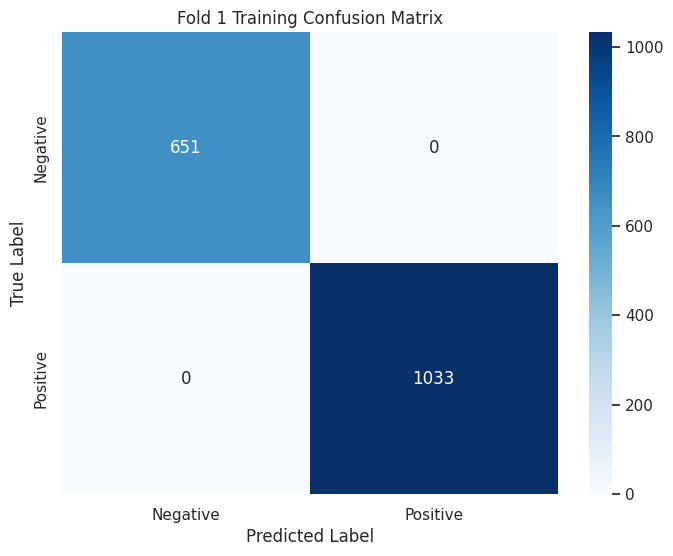

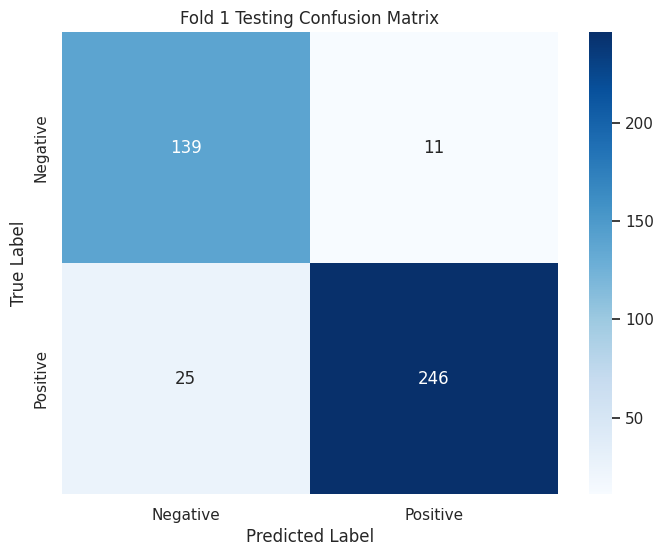

<Figure size 2000x1000 with 0 Axes>

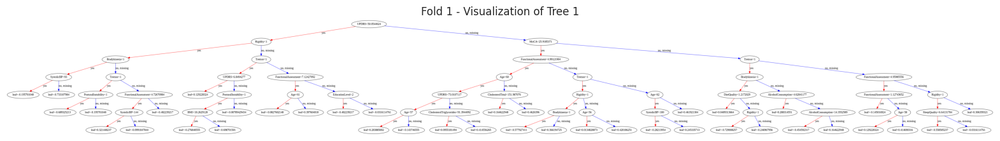

Fold 2 Training Confusion Matrix:
 [[ 636    0]
 [   0 1048]]
Fold 2 Testing Confusion Matrix:
 [[147  18]
 [  8 248]]


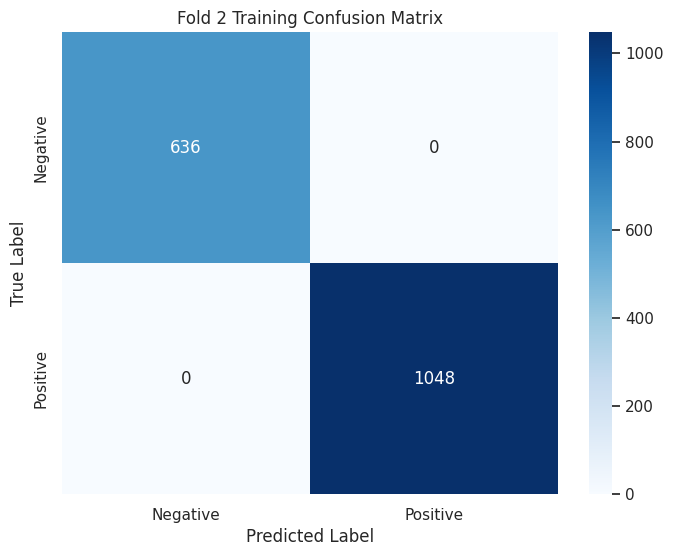

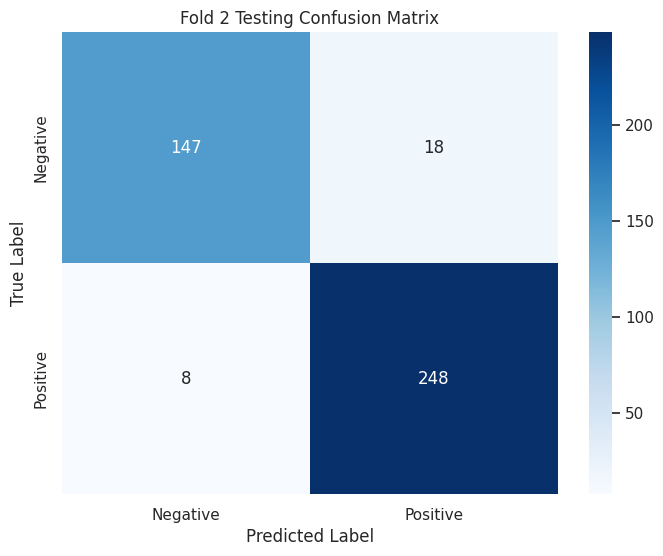

<Figure size 2000x1000 with 0 Axes>

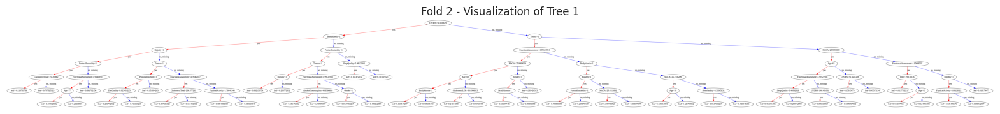

Fold 3 Training Confusion Matrix:
 [[ 647    0]
 [   0 1037]]
Fold 3 Testing Confusion Matrix:
 [[134  20]
 [  8 259]]


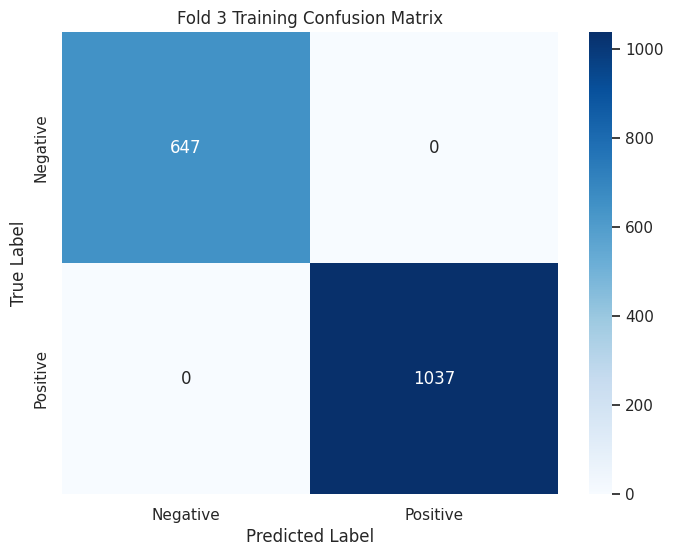

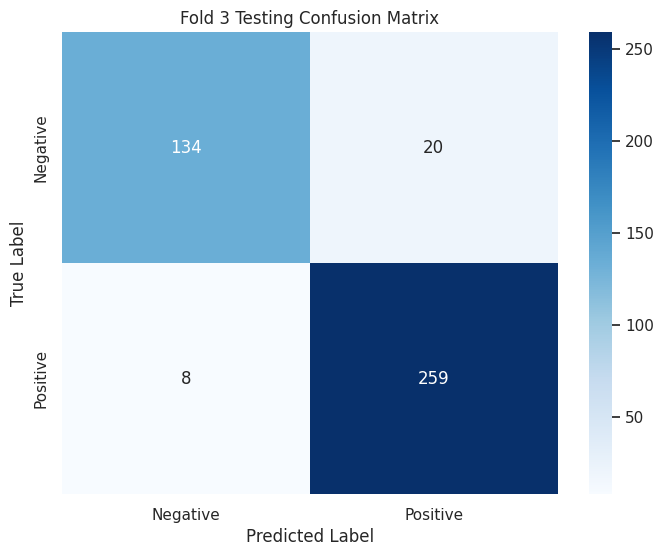

<Figure size 2000x1000 with 0 Axes>

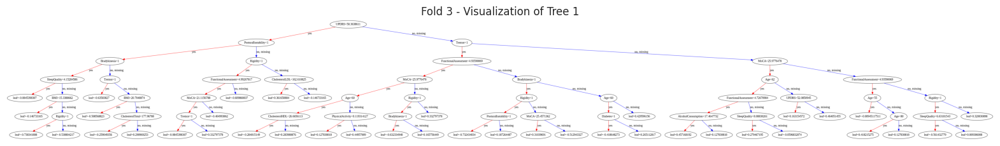

Fold 4 Training Confusion Matrix:
 [[ 639    0]
 [   0 1045]]
Fold 4 Testing Confusion Matrix:
 [[140  22]
 [  9 250]]


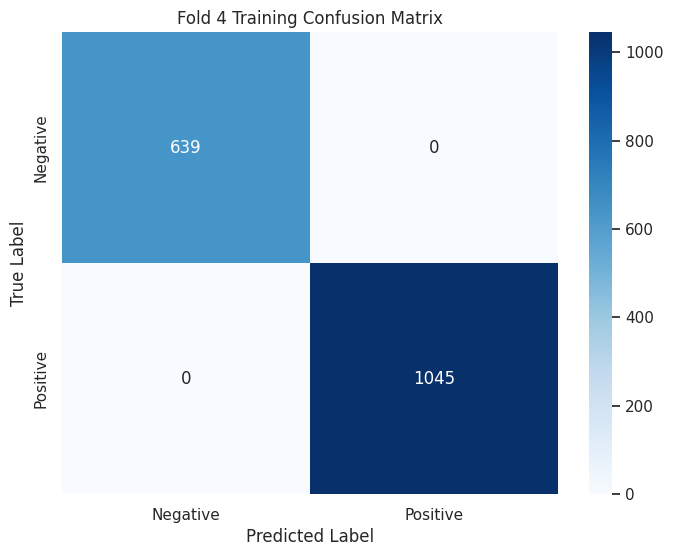

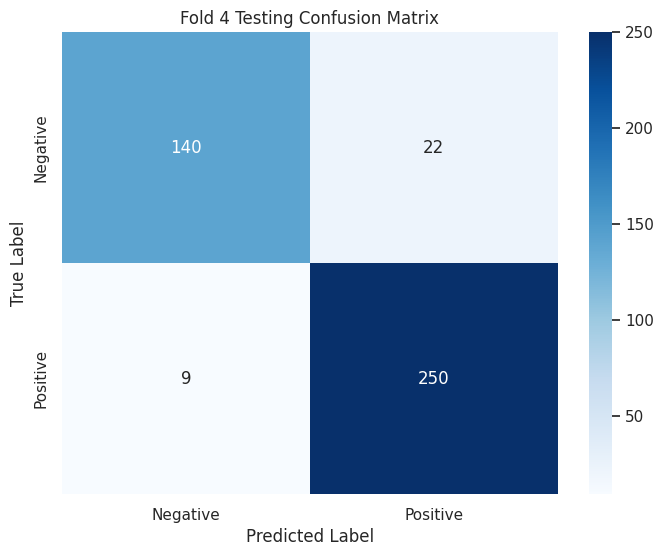

<Figure size 2000x1000 with 0 Axes>

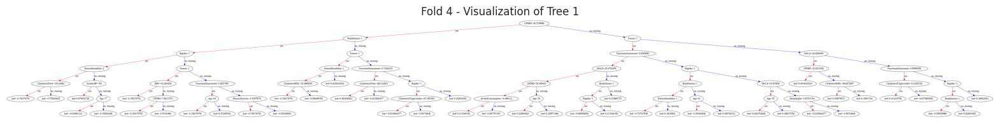

Fold 5 Training Confusion Matrix:
 [[ 631    0]
 [   0 1053]]
Fold 5 Testing Confusion Matrix:
 [[151  19]
 [ 11 240]]


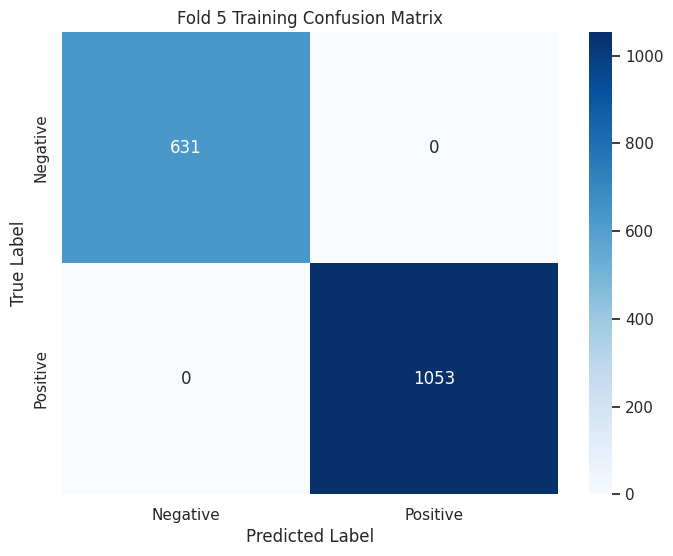

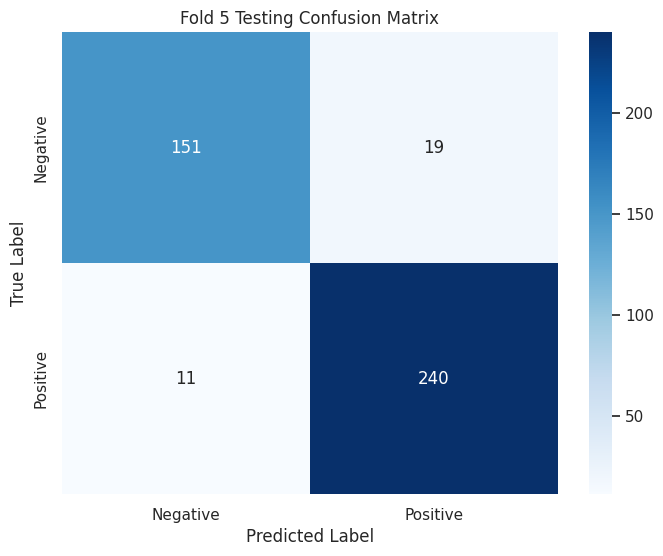

<Figure size 2000x1000 with 0 Axes>

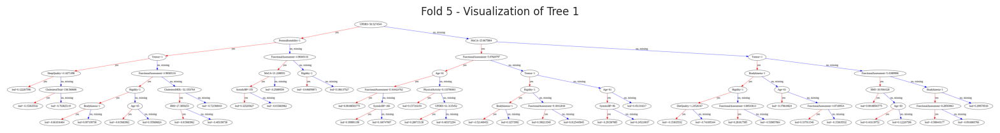

<Figure size 2000x1000 with 0 Axes>

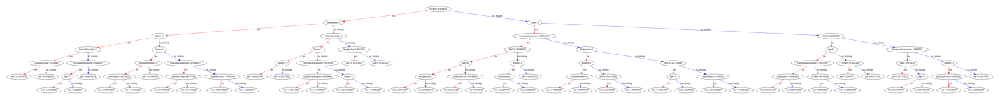

All fold metrics have been saved to 'fold_metrics.xlsx'


In [49]:
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from sklearn.metrics import confusion_matrix, roc_auc_score, accuracy_score
import pandas as pd

# Define feature names
feature_names = [
    'Age', 'Gender', 'Ethnicity', 'EducationLevel', 'BMI', 'Smoking',
    'AlcoholConsumption', 'PhysicalActivity', 'DietQuality', 'SleepQuality',
    'FamilyHistoryParkinsons', 'TraumaticBrainInjury', 'Hypertension', 'Diabetes',
    'Depression', 'Stroke', 'SystolicBP', 'DiastolicBP', 'CholesterolTotal',
    'CholesterolLDL', 'CholesterolHDL', 'CholesterolTriglycerides', 'UPDRS', 'MoCA',
    'FunctionalAssessment', 'Tremor', 'Rigidity', 'Bradykinesia',
    'PosturalInstability', 'SpeechProblems', 'SleepDisorders', 'Constipation'
]

# Define XGBoost parameters for classification
params = {
    'max_depth': 6,
    'learning_rate': 0.3,
    'n_estimators': 100,
    'subsample': 1,
    'gamma': 0,
    'objective': 'binary:logistic',  # For binary classification
    'eval_metric': 'logloss',        # Logarithmic loss
}

# Initialize lists to store results
fold_metrics = []

# Placeholder for storing global sample model (Iteration 50)
global_sample_model = None

# Initialize variable to track best global parameter
global_best_score = -1  # Start with a low value (as ROC AUC score ranges from 0 to 1)

# Loop through each fold
for i in range(1, 6):
    # Load training and test data for the current fold
    train_df = pd.read_excel('fold_data.xlsx', sheet_name=f'Fold_{i}_Train')
    test_df = pd.read_excel('fold_data.xlsx', sheet_name=f'Fold_{i}_Test')

    # Separate features and target
    X_train = train_df.drop('target', axis=1)
    y_train = train_df['target']
    X_test = test_df.drop('target', axis=1)
    y_test = test_df['target']

    # Initialize the XGBoost Classifier with predefined parameters
    best_model1 = xgb.XGBClassifier(**params, use_label_encoder=False)

    # Fit the model
    best_model1.fit(X_train, y_train)

    # Evaluate the model on test set
    y_train_pred = best_model1.predict(X_train)
    y_test_pred = best_model1.predict(X_test)

    # Predict probabilities for AUC-ROC calculation
    y_train_prob = best_model1.predict_proba(X_train)[:, 1]
    y_test_prob = best_model1.predict_proba(X_test)[:, 1]

    # Calculate metrics
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    train_auc = roc_auc_score(y_train, y_train_prob)
    test_auc = roc_auc_score(y_test, y_test_prob)

    # Confusion matrices
    train_conf_matrix = confusion_matrix(y_train, y_train_pred)
    test_conf_matrix = confusion_matrix(y_test, y_test_pred)

    # Print confusion matrices
    print(f"Fold {i} Training Confusion Matrix:\n", train_conf_matrix)
    print(f"Fold {i} Testing Confusion Matrix:\n", test_conf_matrix)

    # Save fold metrics
    fold_metrics.append({
        'Fold': i,
        'Train Accuracy': train_accuracy,
        'Test Accuracy': test_accuracy,
        'Train AUC-ROC': train_auc,
        'Test AUC-ROC': test_auc,
    })

    # Plot confusion matrix for this fold
    def plot_confusion_matrix(cm, labels, title='Confusion Matrix'):
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
        plt.xlabel('Predicted Label')
        plt.ylabel('True Label')
        plt.title(title)
        plt.show()

    labels = ['Negative', 'Positive']
    plot_confusion_matrix(train_conf_matrix, labels, title=f'Fold {i} Training Confusion Matrix')
    plot_confusion_matrix(test_conf_matrix, labels, title=f'Fold {i} Testing Confusion Matrix')

    # Visualisasi pohon untuk setiap fold
    plt.figure(figsize=(20, 10))
    xgb.plot_tree(best_model1, num_trees=0, feature_names=feature_names)
    plt.title(f'Fold {i} - Visualization of Tree 1')
    plt.show()

    # Compare and update global best parameters based on the highest AUC score
    if test_auc > global_best_score:
        global_best_score = test_auc
        # Update the global model
        global_sample_model = best_model1

# Visualisasi pohon untuk model global terbaik (setelah semua fold selesai)
if global_sample_model:
    plt.figure(figsize=(20, 10))
    xgb.plot_tree(global_sample_model, num_trees=0, feature_names=feature_names)
    # plt.title('Global - Visualization of Tree 1 (Best Model)')
    plt.show()

# Save all metrics to a DataFrame
metrics_df = pd.DataFrame(fold_metrics)

# Save metrics to an Excel file
metrics_df.to_excel('fold_metrics.xlsx', index=False)
print("All fold metrics have been saved to 'fold_metrics.xlsx'")

# GRID SEARCH

Fitting 5 folds for each of 640 candidates, totalling 3200 fits
Fold 1 - Best Parameters:
{'gamma': 3, 'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.9}


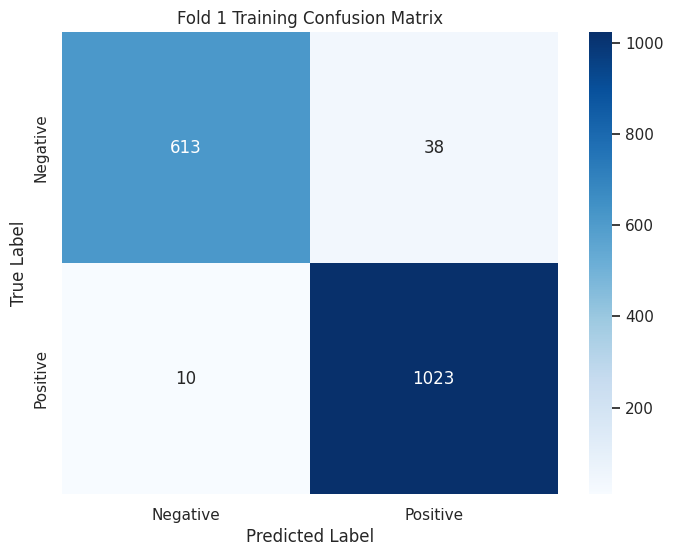

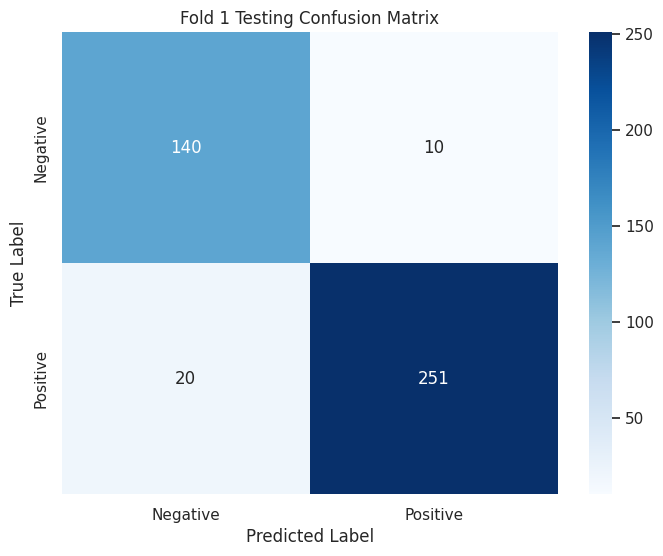

<Figure size 2000x1000 with 0 Axes>

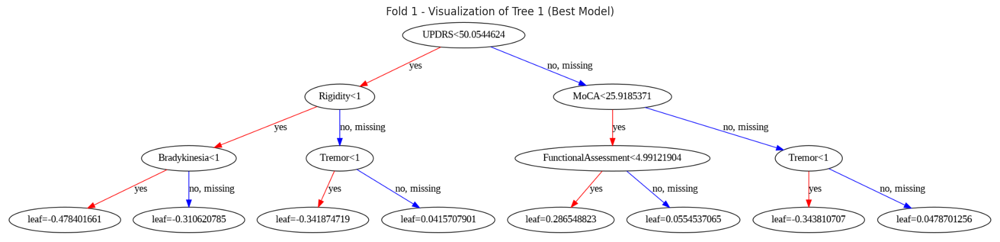

Fitting 5 folds for each of 640 candidates, totalling 3200 fits
Fold 2 - Best Parameters:
{'gamma': 5, 'learning_rate': 0.3, 'max_depth': 4, 'n_estimators': 100, 'subsample': 0.7}


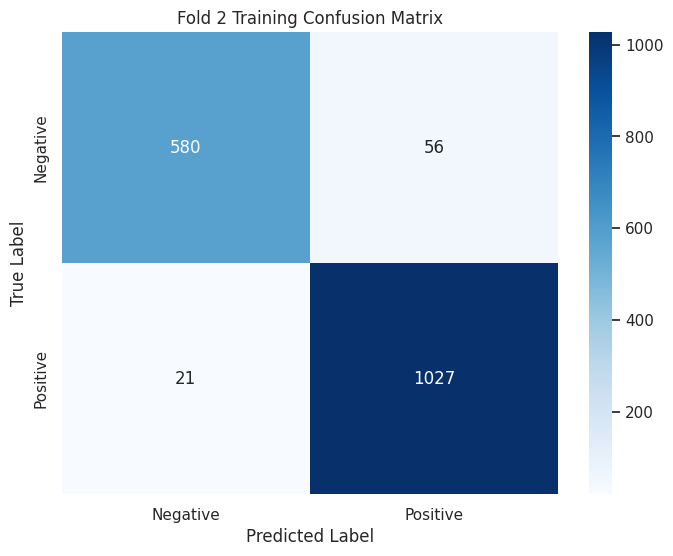

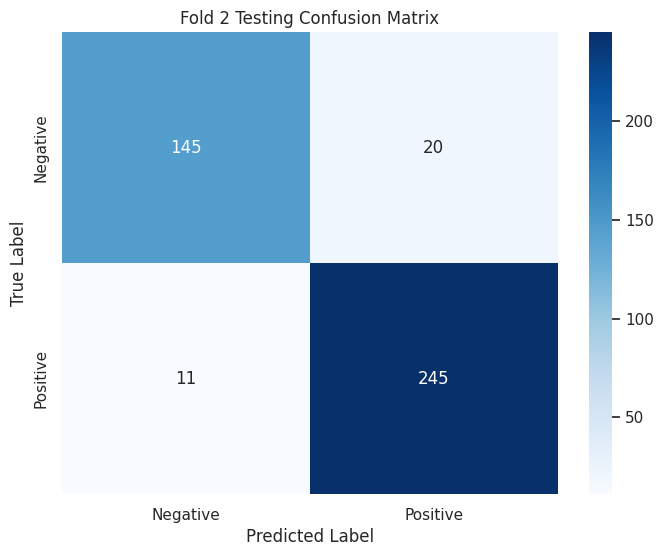

<Figure size 2000x1000 with 0 Axes>

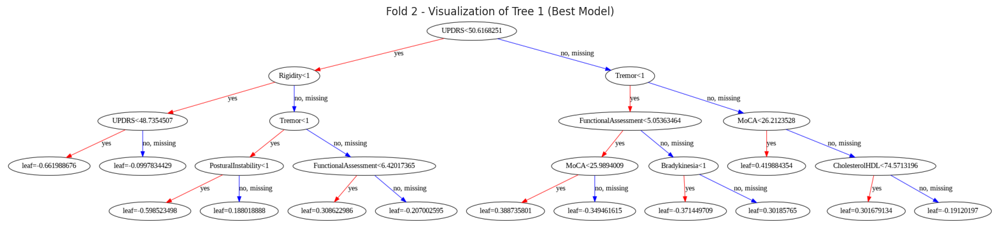

Fitting 5 folds for each of 640 candidates, totalling 3200 fits
Fold 3 - Best Parameters:
{'gamma': 5, 'learning_rate': 0.3, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.7}


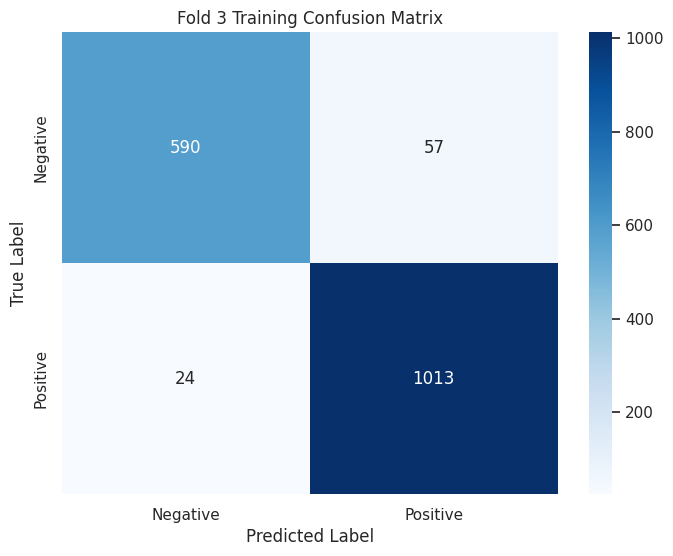

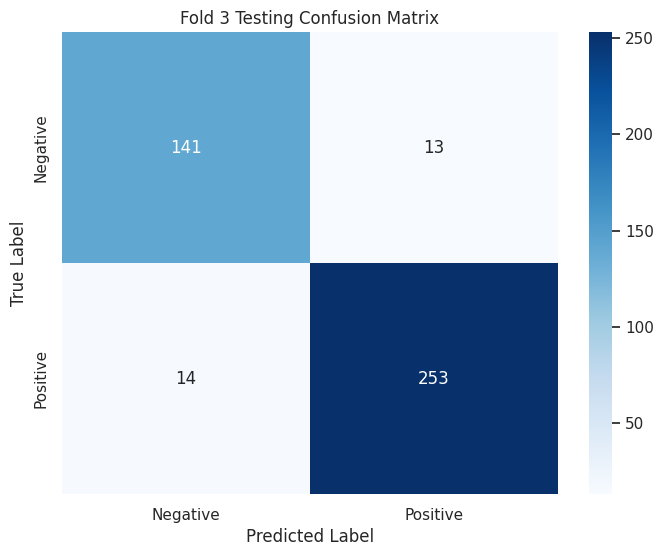

<Figure size 2000x1000 with 0 Axes>

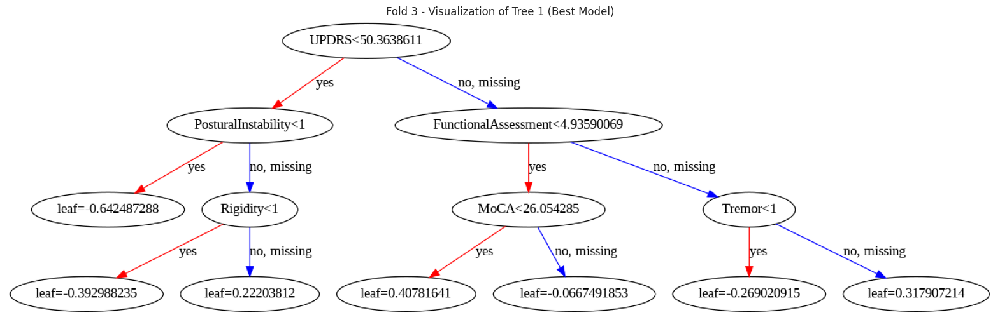

Fitting 5 folds for each of 640 candidates, totalling 3200 fits
Fold 4 - Best Parameters:
{'gamma': 5, 'learning_rate': 0.3, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.8}


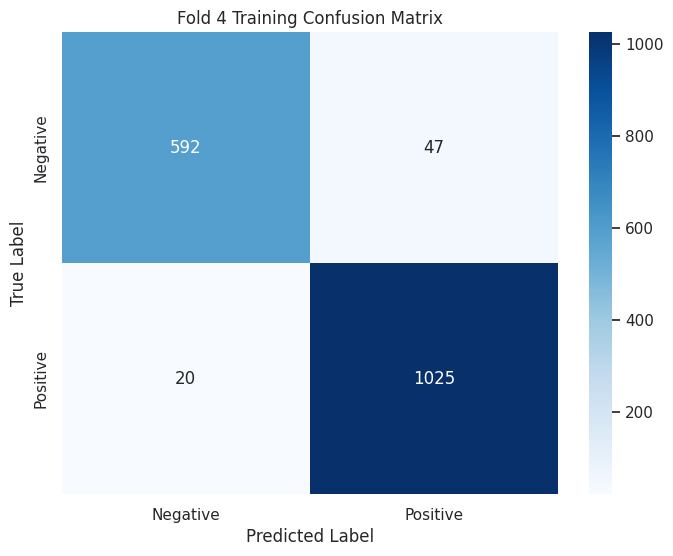

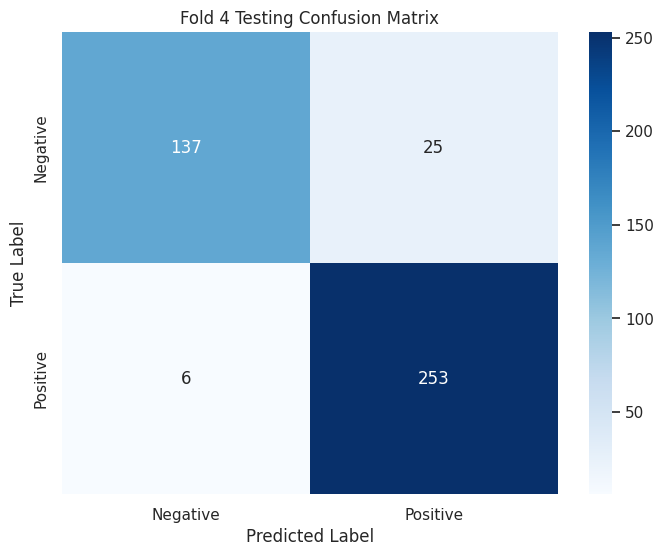

<Figure size 2000x1000 with 0 Axes>

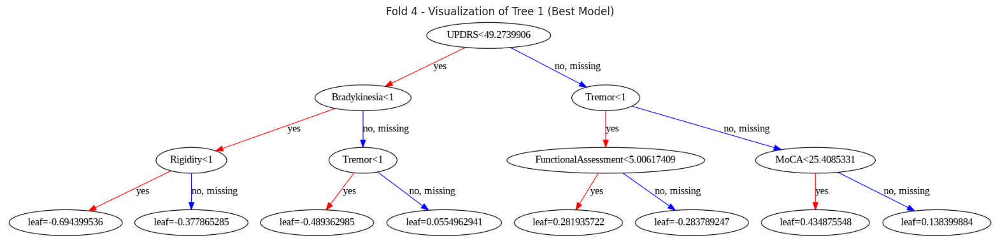

Fitting 5 folds for each of 640 candidates, totalling 3200 fits
Fold 5 - Best Parameters:
{'gamma': 5, 'learning_rate': 0.3, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.8}


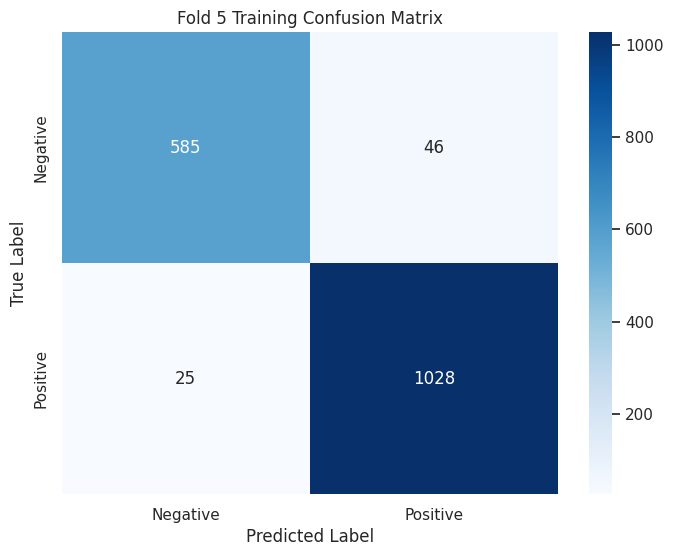

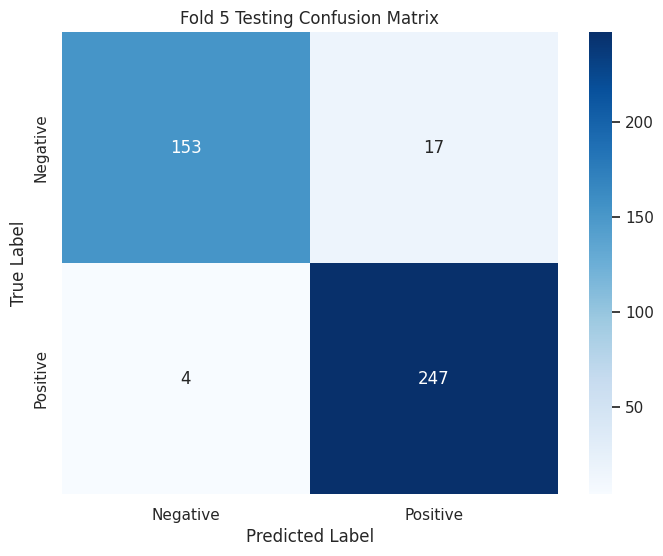

<Figure size 2000x1000 with 0 Axes>

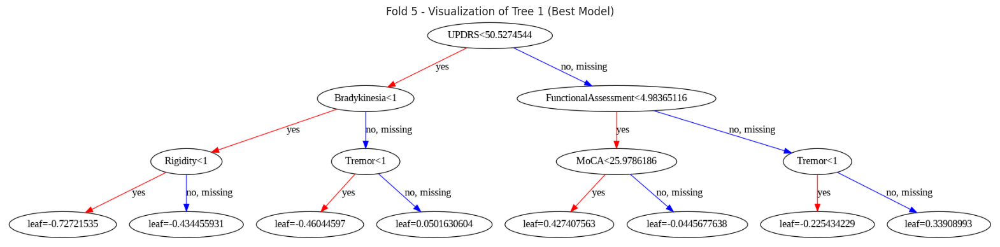


Best Global Parameters Grid Search (Across All Folds):
{'gamma': 5, 'learning_rate': 0.3, 'max_depth': 4, 'n_estimators': 100, 'subsample': 0.7}


<Figure size 2000x1000 with 0 Axes>

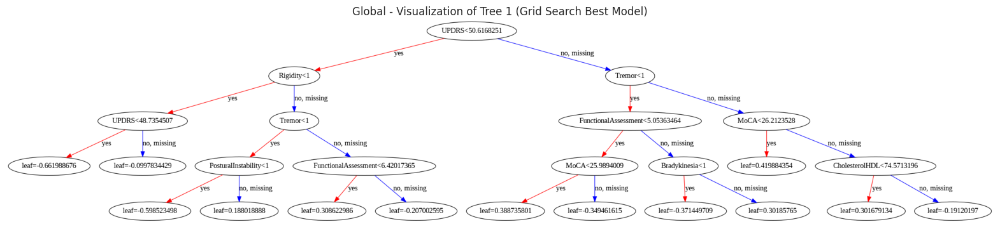

All fold metrics have been saved to 'fold_metrics.xlsx'


In [ ]:
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from sklearn.metrics import confusion_matrix, roc_auc_score, accuracy_score
from scipy.stats import randint, uniform
import pandas as pd
from sklearn.model_selection import GridSearchCV  # Import GridSearchCV

# Define feature names
feature_names = [
    'Age', 'Gender', 'Ethnicity', 'EducationLevel', 'BMI', 'Smoking',
    'AlcoholConsumption', 'PhysicalActivity', 'DietQuality', 'SleepQuality',
    'FamilyHistoryParkinsons', 'TraumaticBrainInjury', 'Hypertension', 'Diabetes',
    'Depression', 'Stroke', 'SystolicBP', 'DiastolicBP', 'CholesterolTotal',
    'CholesterolLDL', 'CholesterolHDL', 'CholesterolTriglycerides', 'UPDRS', 'MoCA',
    'FunctionalAssessment', 'Tremor', 'Rigidity', 'Bradykinesia',
    'PosturalInstability', 'SpeechProblems', 'SleepDisorders', 'Constipation'
]

# Initialize lists to store results
fold_metrics = []

# Placeholder for storing global sample model (Iteration 1000)
global_sample_model = None

# Initialize list to store all best parameters across all folds
all_best_params = []

# Initialize variable to track best global parameter
global_best_score = -1  # Start with a low value (as ROC AUC score ranges from 0 to 1)
global_best_params = None

# Loop through each fold
for i in range(1, 6):
    # Load training and test data for the current fold
    train_df = pd.read_excel('fold_data.xlsx', sheet_name=f'Fold_{i}_Train')
    test_df = pd.read_excel('fold_data.xlsx', sheet_name=f'Fold_{i}_Test')

    # Separate features and target
    X_train = train_df.drop('target', axis=1)
    y_train = train_df['target']
    X_test = test_df.drop('target', axis=1)
    y_test = test_df['target']

    # Define XGBoost parameters for GridSearch
    param_grid = {
    'max_depth': [3, 4, 5, 6, 7],
    'learning_rate': [0.01, 0.1, 0.2, 0.3],
    'n_estimators': [50, 100],
    'subsample': [0.6, 0.7, 0.8, 0.9],
    'gamma': [0, 1, 3, 5],
    }

    # Initialize the XGBoost Classifier
    model = xgb.XGBClassifier(
        use_label_encoder=False,
        objective='binary:logistic',
        eval_metric='logloss'
    )

    # Initialize GridSearchCV
    grid_search = GridSearchCV(
        estimator=model,
        param_grid=param_grid,
        scoring='roc_auc',
        cv=5,
        n_jobs=-1,
        verbose=1
    )

    # Fit the model with GridSearch
    grid_search.fit(X_train, y_train)

    # Get the best model for this fold
    best_model2 = grid_search.best_estimator_  # Changed to best_model2

    # Get the best parameters for this fold
    fold_best_params = grid_search.best_params_
    print(f"Fold {i} - Best Parameters:")
    print(fold_best_params)

    # Evaluate the model on test set
    y_train_pred = best_model2.predict(X_train)  # Changed to best_model2
    y_test_pred = best_model2.predict(X_test)  # Changed to best_model2

    # Predict probabilities for AUC-ROC calculation
    y_train_prob = best_model2.predict_proba(X_train)[:, 1]  # Changed to best_model2
    y_test_prob = best_model2.predict_proba(X_test)[:, 1]  # Changed to best_model2

    # Calculate metrics
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    train_auc = roc_auc_score(y_train, y_train_prob)
    test_auc = roc_auc_score(y_test, y_test_prob)

    # Confusion matrices
    train_conf_matrix = confusion_matrix(y_train, y_train_pred)
    test_conf_matrix = confusion_matrix(y_test, y_test_pred)

    # Save fold metrics
    fold_metrics.append({
        'Fold': i,
        'Train Accuracy': train_accuracy,
        'Test Accuracy': test_accuracy,
        'Train AUC-ROC': train_auc,
        'Test AUC-ROC': test_auc,
    })

    # Plot confusion matrices
    def plot_confusion_matrix(cm, labels, title='Confusion Matrix'):
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
        plt.xlabel('Predicted Label')
        plt.ylabel('True Label')
        plt.title(title)
        plt.show()

    labels = ['Negative', 'Positive']
    plot_confusion_matrix(train_conf_matrix, labels, title=f'Fold {i} Training Confusion Matrix')
    plot_confusion_matrix(test_conf_matrix, labels, title=f'Fold {i} Testing Confusion Matrix')

    # Visualize the first tree of the best model for this fold
    plt.figure(figsize=(20, 10))
    xgb.plot_tree(best_model2, num_trees=0, feature_names=feature_names)  # Changed to best_model2
    plt.title(f'Fold {i} - Visualization of Tree 1 (Best Model)')
    plt.show()

    # Compare and update global best parameters based on the highest AUC score
    if test_auc > global_best_score:
        global_best_score = test_auc
        global_best_params = fold_best_params
        global_sample_model = best_model2  # Changed to best_model2

# Print the best parameters from the global
print("\nBest Global Parameters Grid Search (Across All Folds):")
print(global_best_params)

# Visualize a sample tree for global Grid Search (Best Model)
plt.figure(figsize=(20, 10))
xgb.plot_tree(global_sample_model, num_trees=0, feature_names=feature_names)  # Changed to global_sample_model
plt.title('Global - Visualization of Tree 1 (Grid Search Best Model)')
plt.show()

# Save all metrics to a DataFrame
metrics_df = pd.DataFrame(fold_metrics)

# Save metrics to an Excel file
metrics_df.to_excel('fold_metrics.xlsx', index=False)
print("All fold metrics have been saved to 'fold_metrics.xlsx'")

# RANDOM SEARCH

**RANDOM SEARCH ITERASI 50**

Fold 1 - Best Parameters:
{'gamma': 4.718459344254141, 'learning_rate': 0.2660427019730218, 'max_depth': 3, 'n_estimators': 73, 'subsample': 0.6885180569804307}


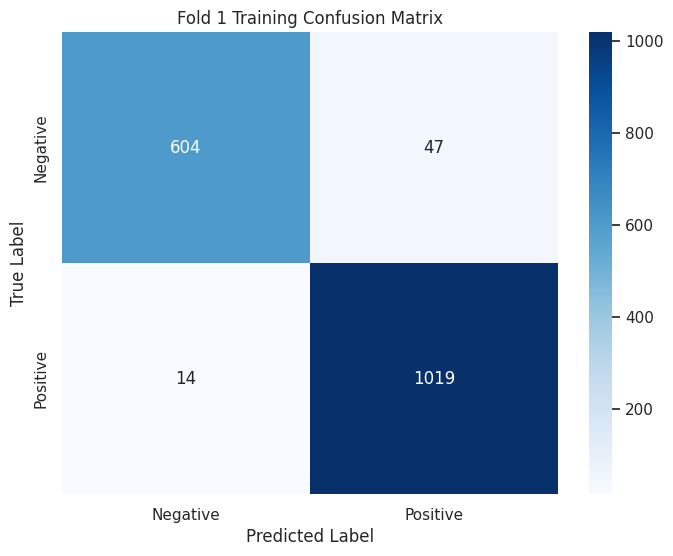

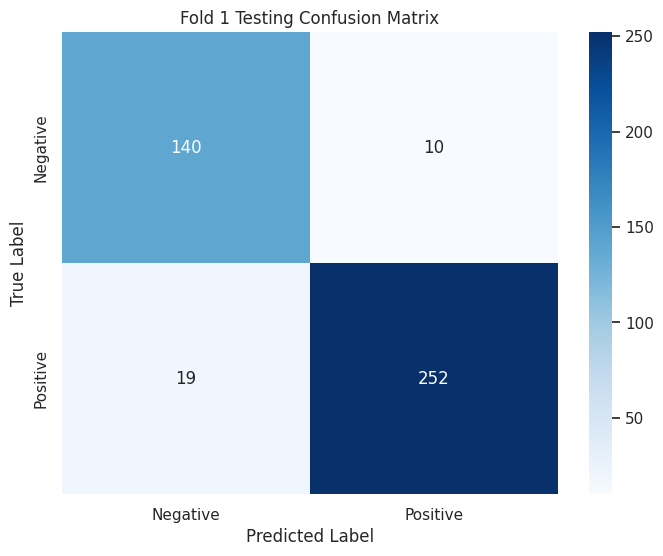

<Figure size 2000x1000 with 0 Axes>

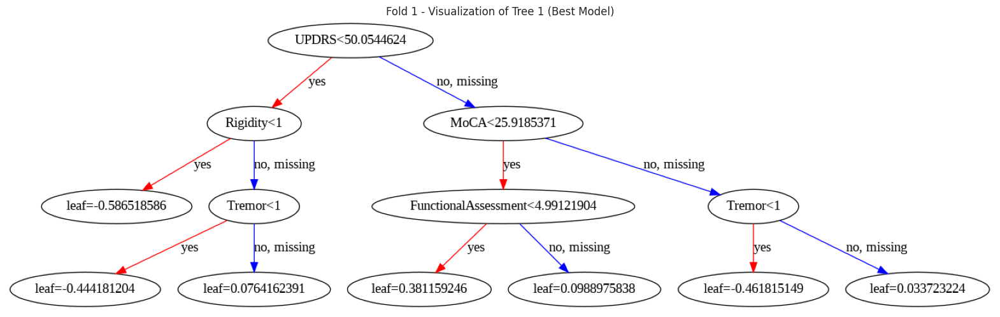

Fold 2 - Best Parameters:
{'gamma': 4.735815347050549, 'learning_rate': 0.2619596505329358, 'max_depth': 3, 'n_estimators': 58, 'subsample': 0.6312340361215628}


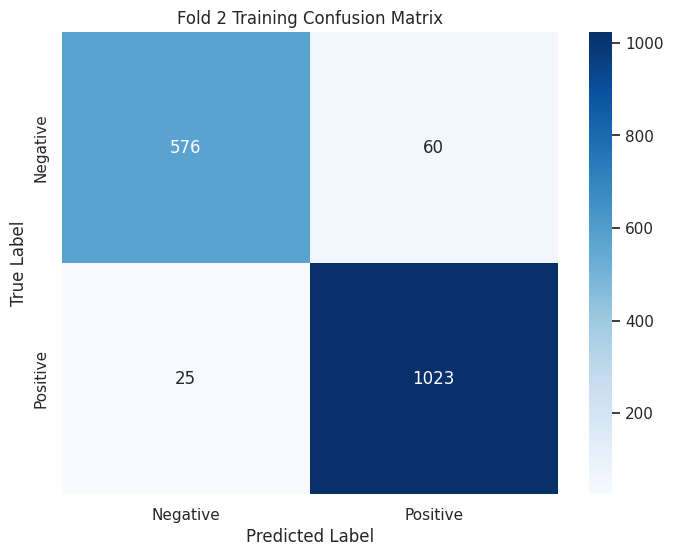

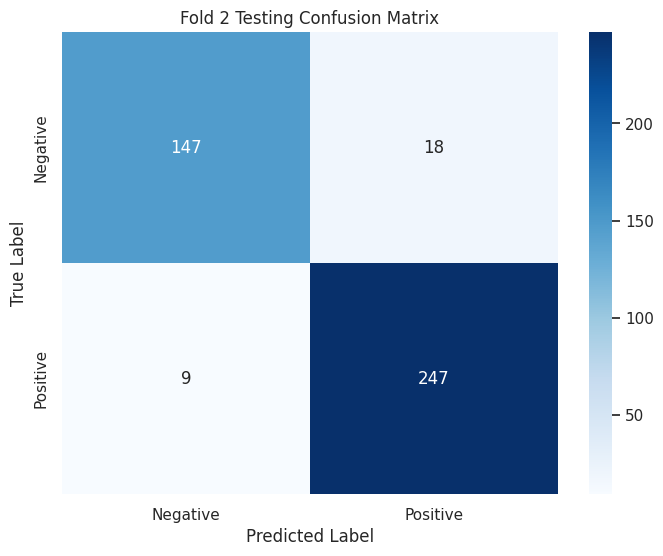

<Figure size 2000x1000 with 0 Axes>

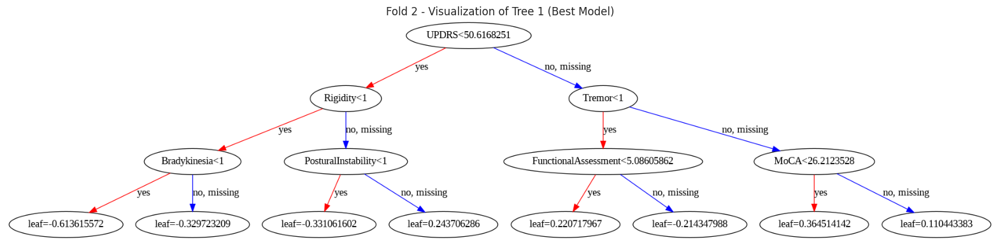

Fold 3 - Best Parameters:
{'gamma': 3.657820483893859, 'learning_rate': 0.24143069934342498, 'max_depth': 3, 'n_estimators': 66, 'subsample': 0.8545839066325501}


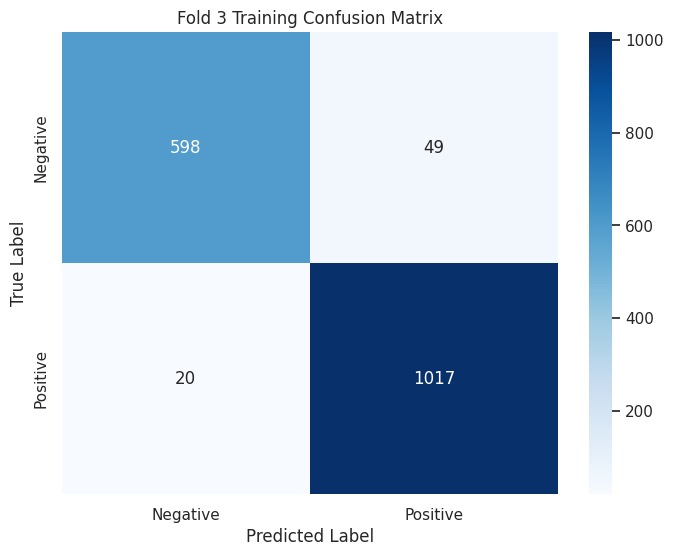

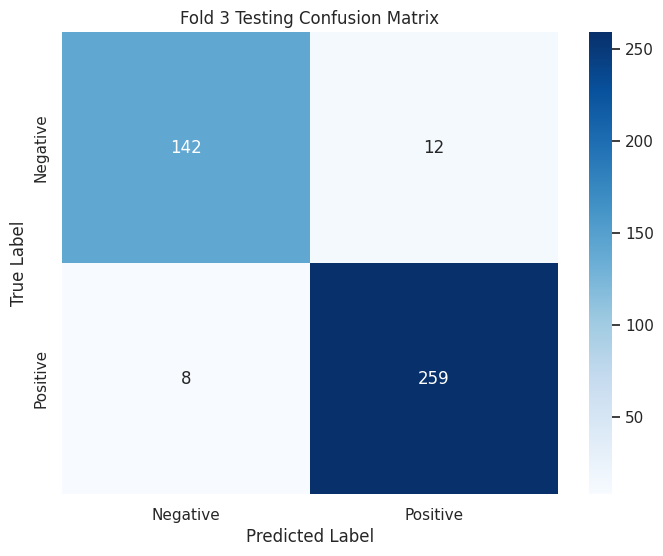

<Figure size 2000x1000 with 0 Axes>

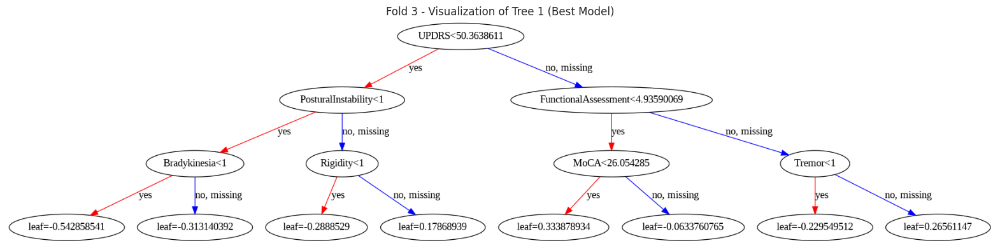

Fold 4 - Best Parameters:
{'gamma': 3.817816406087407, 'learning_rate': 0.25357549621948017, 'max_depth': 3, 'n_estimators': 69, 'subsample': 0.6921462651523207}


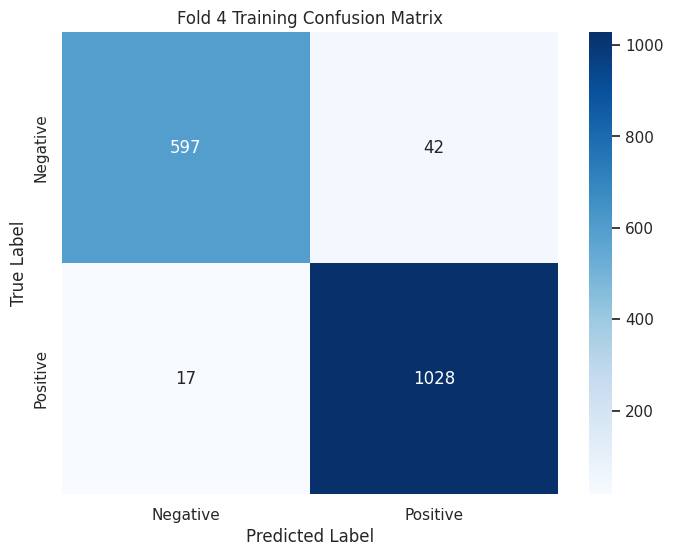

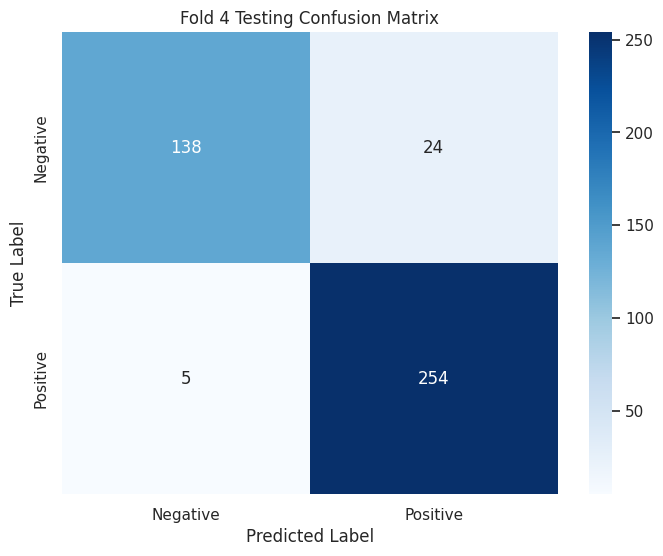

<Figure size 2000x1000 with 0 Axes>

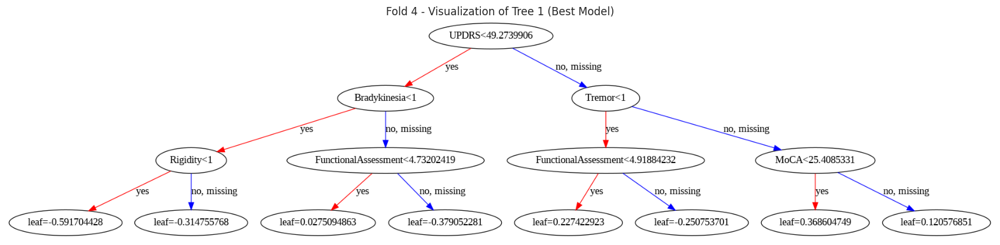

Fold 5 - Best Parameters:
{'gamma': 4.49087864977589, 'learning_rate': 0.10568929482462827, 'max_depth': 3, 'n_estimators': 98, 'subsample': 0.6530783827400946}


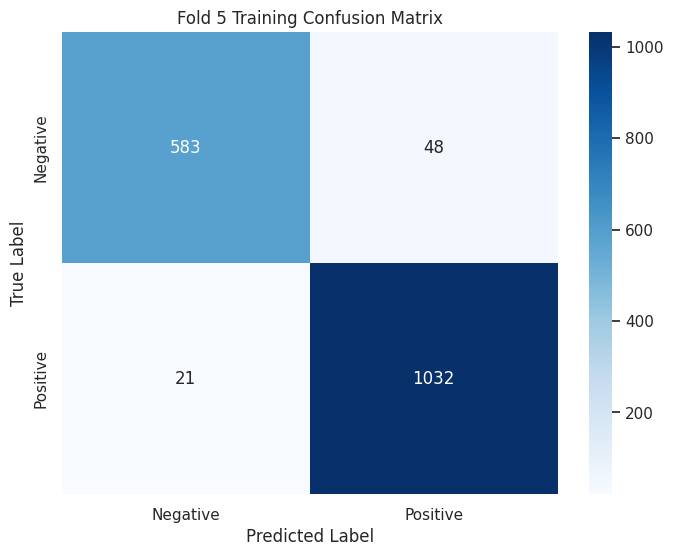

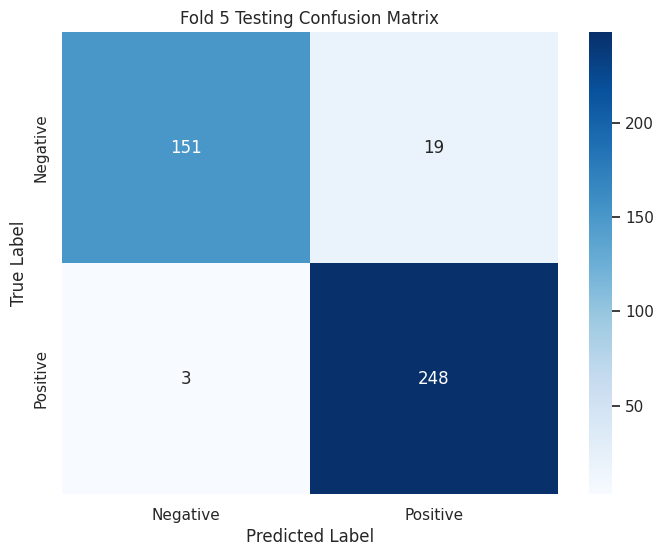

<Figure size 2000x1000 with 0 Axes>

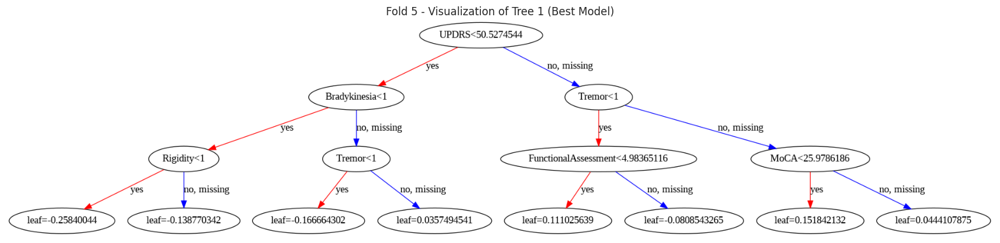


Best Global Parameters from Iteration 50 (Across All Folds):
{'gamma': 4.735815347050549, 'learning_rate': 0.2619596505329358, 'max_depth': 3, 'n_estimators': 58, 'subsample': 0.6312340361215628}


<Figure size 2000x1000 with 0 Axes>

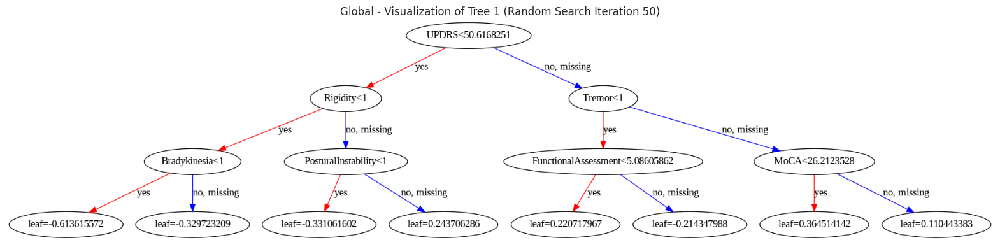

All fold metrics have been saved to 'fold_metrics.xlsx'


In [ ]:
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from sklearn.metrics import confusion_matrix, roc_auc_score, accuracy_score
from scipy.stats import randint, uniform
import pandas as pd
from sklearn.model_selection import RandomizedSearchCV

# Define feature names
feature_names = [
    'Age', 'Gender', 'Ethnicity', 'EducationLevel', 'BMI', 'Smoking',
    'AlcoholConsumption', 'PhysicalActivity', 'DietQuality', 'SleepQuality',
    'FamilyHistoryParkinsons', 'TraumaticBrainInjury', 'Hypertension', 'Diabetes',
    'Depression', 'Stroke', 'SystolicBP', 'DiastolicBP', 'CholesterolTotal',
    'CholesterolLDL', 'CholesterolHDL', 'CholesterolTriglycerides', 'UPDRS', 'MoCA',
    'FunctionalAssessment', 'Tremor', 'Rigidity', 'Bradykinesia',
    'PosturalInstability', 'SpeechProblems', 'SleepDisorders', 'Constipation'
]

# Initialize lists to store results
fold_metrics = []

# Placeholder for storing global sample model (Iteration 50)
global_sample_model = None

# Initialize list to store all best parameters across all folds
all_best_params = []

# Initialize variable to track best global parameter
global_best_score = -1  # Start with a low value (as ROC AUC score ranges from 0 to 1)
global_best_params = None

# Loop through each fold
for i in range(1, 6):
    # Load training and test data for the current fold
    train_df = pd.read_excel('fold_data.xlsx', sheet_name=f'Fold_{i}_Train')
    test_df = pd.read_excel('fold_data.xlsx', sheet_name=f'Fold_{i}_Test')

    # Separate features and target
    X_train = train_df.drop('target', axis=1)
    y_train = train_df['target']
    X_test = test_df.drop('target', axis=1)
    y_test = test_df['target']

    # Define XGBoost parameters for RandomizedSearch
    param_dist = {
        'n_estimators': randint(50, 100),
        'max_depth': randint(3, 8),
        'learning_rate': uniform(0.01, 0.29),
        'subsample': uniform(0.6, 0.3),
        'gamma': uniform(0, 5),
    }

    # Initialize the XGBoost Classifier
    model = xgb.XGBClassifier(
        use_label_encoder=False,
        objective='binary:logistic',
        eval_metric='logloss'
    )

    # Initialize RandomizedSearchCV
    random_search = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_dist,
        scoring='roc_auc',
        cv=5,
        n_jobs=-1,
        n_iter=50,
        random_state=None,
    )

    # Fit the model with RandomizedSearch
    random_search.fit(X_train, y_train)

    # Get the best model for this fold
    best_model3 = random_search.best_estimator_

    # Get the best parameters for this fold
    fold_best_params = random_search.best_params_
    print(f"Fold {i} - Best Parameters:")
    print(fold_best_params)

    # Evaluate the model on test set
    y_train_pred = best_model3.predict(X_train)
    y_test_pred = best_model3.predict(X_test)

    # Predict probabilities for AUC-ROC calculation
    y_train_prob = best_model3.predict_proba(X_train)[:, 1]
    y_test_prob = best_model3.predict_proba(X_test)[:, 1]

    # Calculate metrics
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    train_auc = roc_auc_score(y_train, y_train_prob)
    test_auc = roc_auc_score(y_test, y_test_prob)

    # Confusion matrices
    train_conf_matrix = confusion_matrix(y_train, y_train_pred)
    test_conf_matrix = confusion_matrix(y_test, y_test_pred)

    # Save fold metrics
    fold_metrics.append({
        'Fold': i,
        'Train Accuracy': train_accuracy,
        'Test Accuracy': test_accuracy,
        'Train AUC-ROC': train_auc,
        'Test AUC-ROC': test_auc,
    })

    # Plot confusion matrices
    def plot_confusion_matrix(cm, labels, title='Confusion Matrix'):
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
        plt.xlabel('Predicted Label')
        plt.ylabel('True Label')
        plt.title(title)
        plt.show()

    labels = ['Negative', 'Positive']
    plot_confusion_matrix(train_conf_matrix, labels, title=f'Fold {i} Training Confusion Matrix')
    plot_confusion_matrix(test_conf_matrix, labels, title=f'Fold {i} Testing Confusion Matrix')

    # Visualize the first tree of the best model for this fold
    plt.figure(figsize=(20, 10))
    xgb.plot_tree(best_model3, num_trees=0, feature_names=feature_names)
    plt.title(f'Fold {i} - Visualization of Tree 1 (Best Model)')
    plt.show()

    # Compare and update global best parameters based on the highest AUC score
    if test_auc > global_best_score:
        global_best_score = test_auc
        global_best_params = fold_best_params
        global_sample_model = best_model3

# Print the best parameters from the global iteration 50 across all folds
print("\nBest Global Parameters from Iteration 50 (Across All Folds):")
print(global_best_params)

# Visualize a sample tree for global Random Search Iteration 50 (Best Model)
plt.figure(figsize=(20, 10))
xgb.plot_tree(global_sample_model, num_trees=0, feature_names=feature_names)
plt.title('Global - Visualization of Tree 1 (Random Search Iteration 50)')
plt.show()

# Save all metrics to a DataFrame
metrics_df = pd.DataFrame(fold_metrics)

# Save metrics to an Excel file
metrics_df.to_excel('fold_metrics.xlsx', index=False)
print("All fold metrics have been saved to 'fold_metrics.xlsx'")

**RANDOM SEARCH ITERASI 100**

Fold 1 - Best Parameters:
{'gamma': 4.554212028873426, 'learning_rate': 0.155158904637714, 'max_depth': 3, 'n_estimators': 67, 'subsample': 0.8712504646100945}


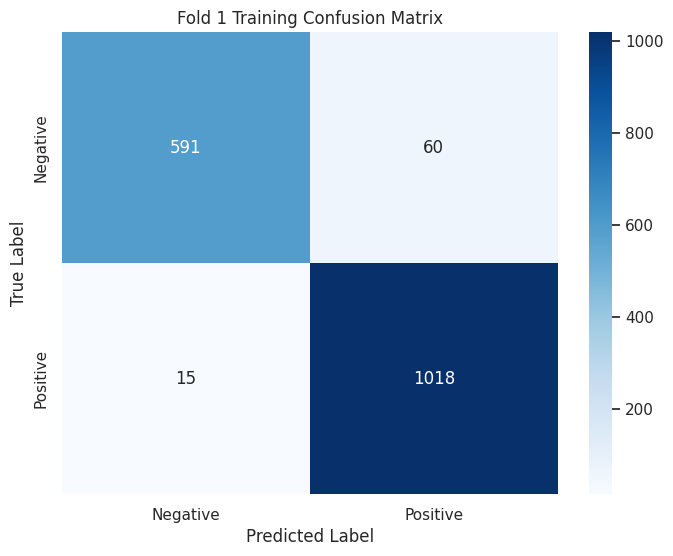

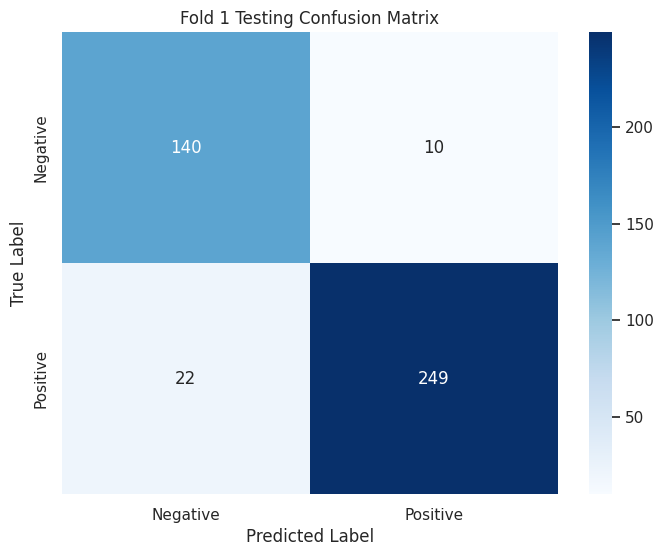

<Figure size 2000x1000 with 0 Axes>

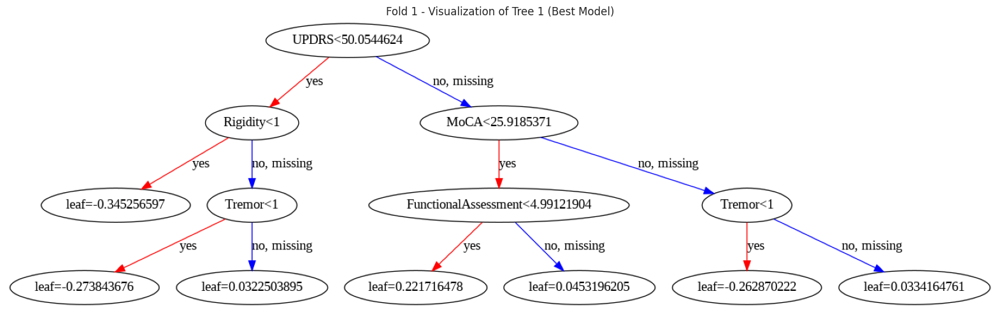

Fold 2 - Best Parameters:
{'gamma': 3.8981098925877102, 'learning_rate': 0.15984414977674438, 'max_depth': 3, 'n_estimators': 53, 'subsample': 0.7937390020940684}


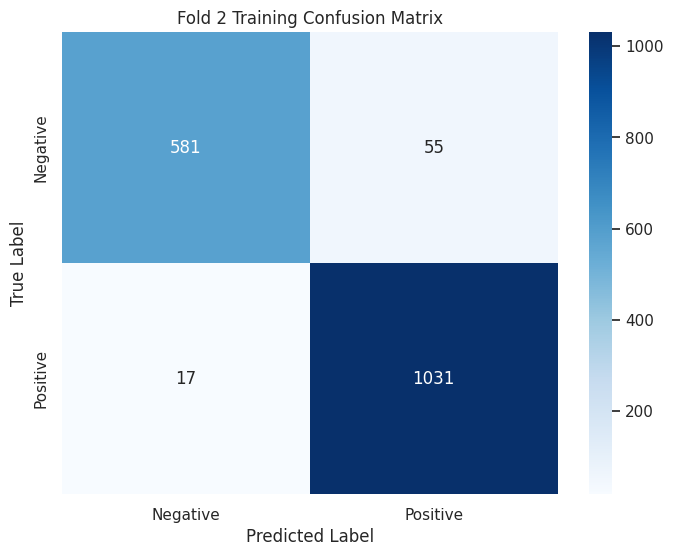

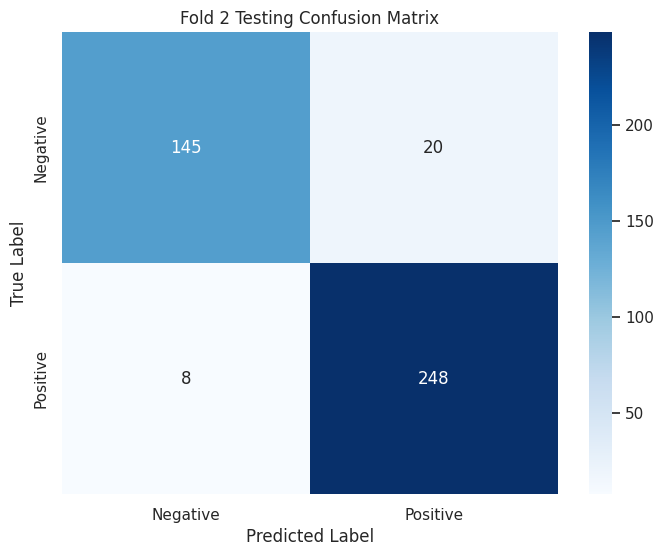

<Figure size 2000x1000 with 0 Axes>

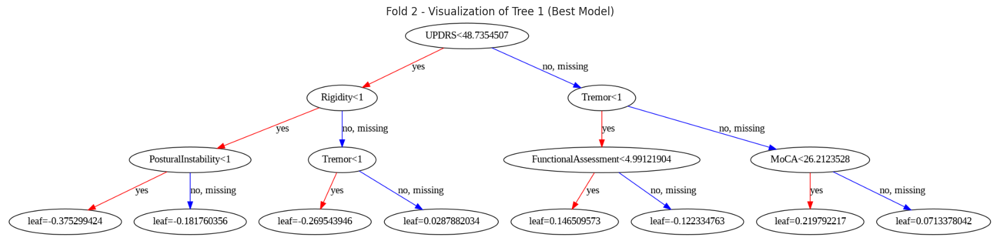

Fold 3 - Best Parameters:
{'gamma': 4.503350334305533, 'learning_rate': 0.2925499632737544, 'max_depth': 5, 'n_estimators': 54, 'subsample': 0.8353634652683914}


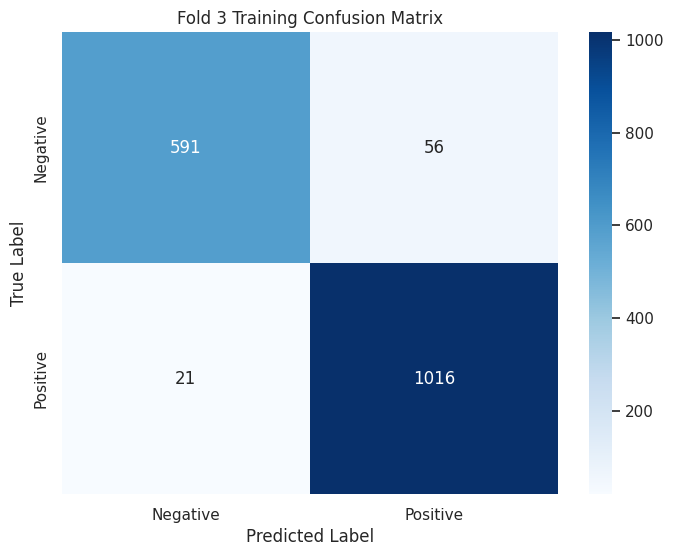

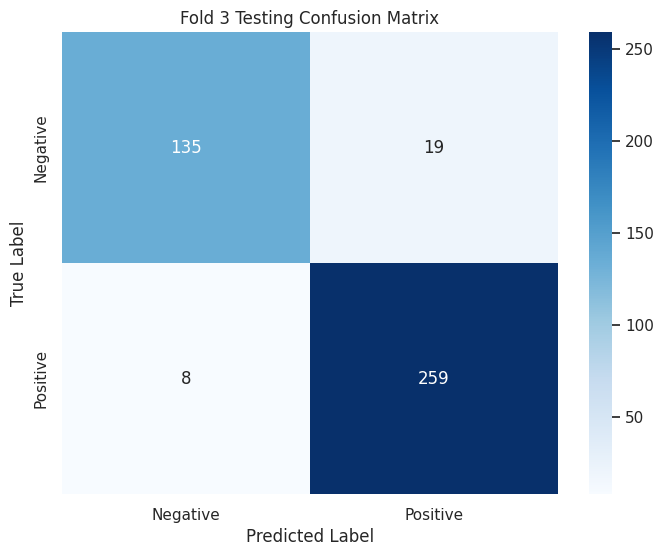

<Figure size 2000x1000 with 0 Axes>

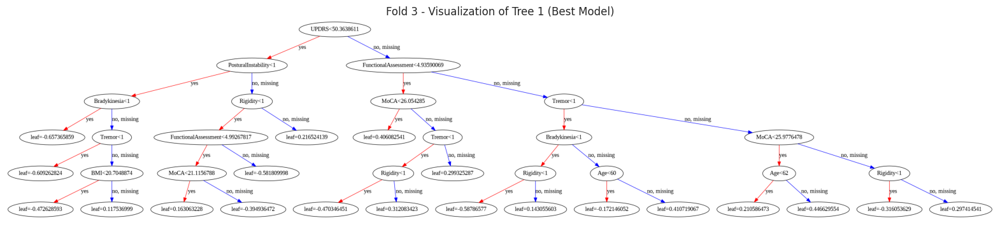

Fold 4 - Best Parameters:
{'gamma': 2.9822317996104033, 'learning_rate': 0.24722538155879473, 'max_depth': 3, 'n_estimators': 93, 'subsample': 0.8850071413511477}


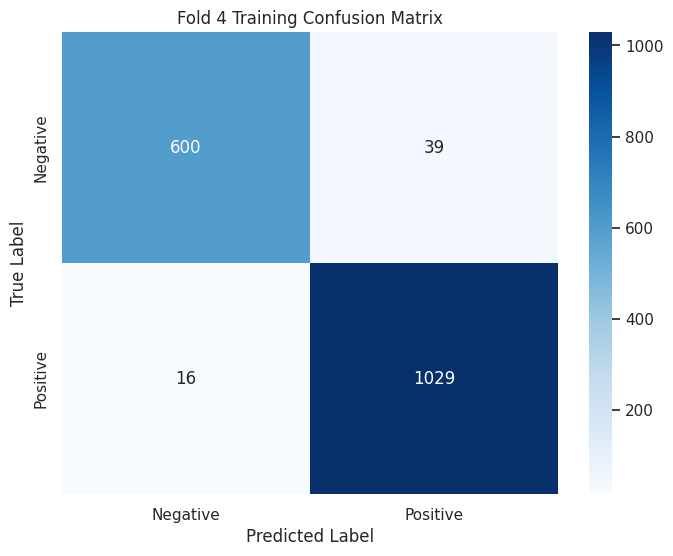

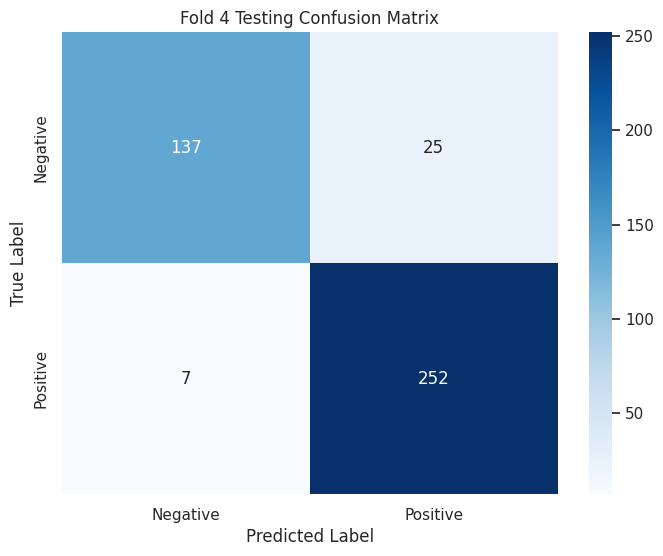

<Figure size 2000x1000 with 0 Axes>

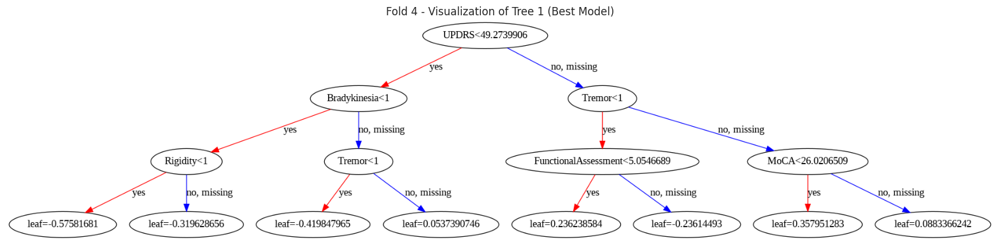

Fold 5 - Best Parameters:
{'gamma': 3.273499042536035, 'learning_rate': 0.2643120370928264, 'max_depth': 4, 'n_estimators': 59, 'subsample': 0.7945089937798852}


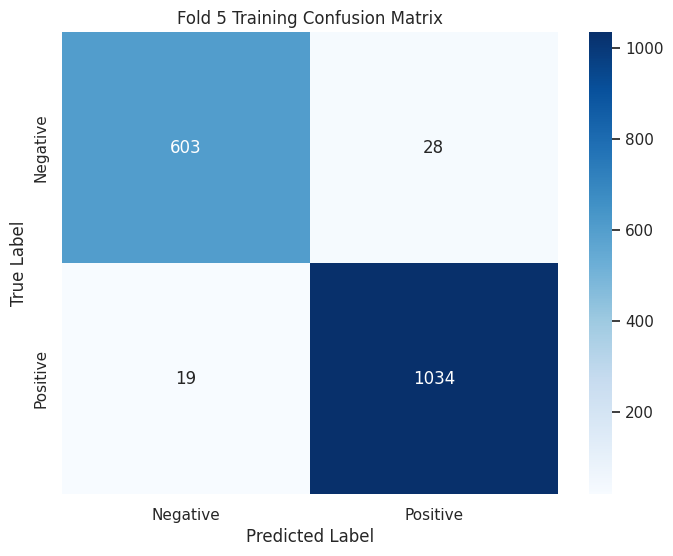

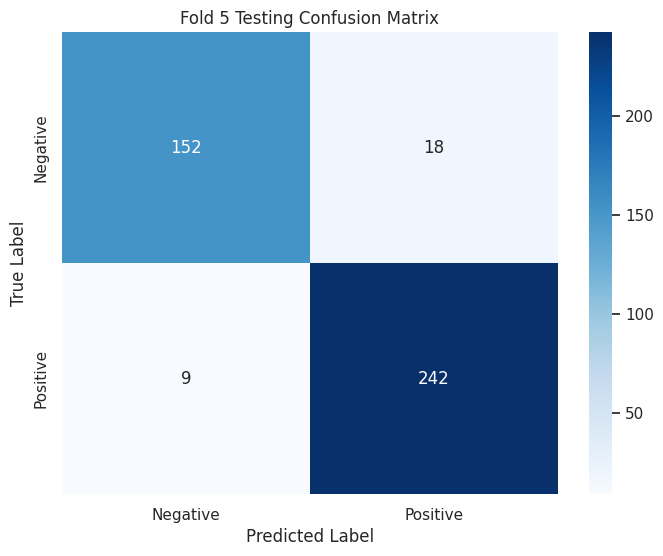

<Figure size 2000x1000 with 0 Axes>

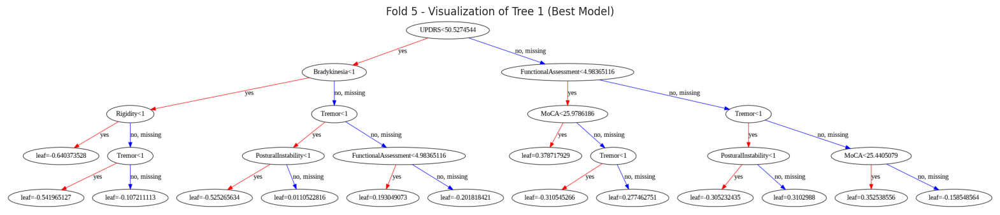


Best Global Parameters from Iteration 100 (Across All Folds):
{'gamma': 3.8981098925877102, 'learning_rate': 0.15984414977674438, 'max_depth': 3, 'n_estimators': 53, 'subsample': 0.7937390020940684}


<Figure size 2000x1000 with 0 Axes>

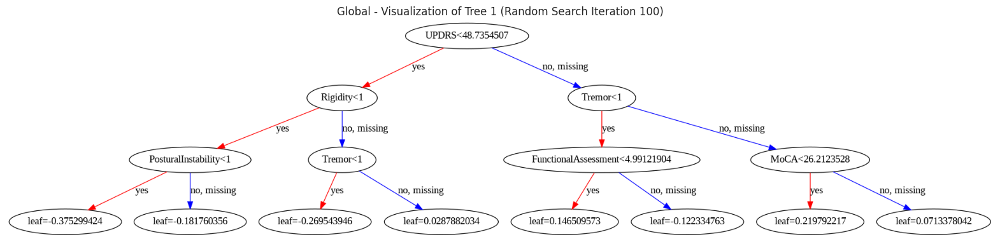

All fold metrics have been saved to 'fold_metrics.xlsx'


In [ ]:
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from sklearn.metrics import confusion_matrix, roc_auc_score, accuracy_score
from scipy.stats import randint, uniform
import pandas as pd
from sklearn.model_selection import RandomizedSearchCV

# Define feature names
feature_names = [
    'Age', 'Gender', 'Ethnicity', 'EducationLevel', 'BMI', 'Smoking',
    'AlcoholConsumption', 'PhysicalActivity', 'DietQuality', 'SleepQuality',
    'FamilyHistoryParkinsons', 'TraumaticBrainInjury', 'Hypertension', 'Diabetes',
    'Depression', 'Stroke', 'SystolicBP', 'DiastolicBP', 'CholesterolTotal',
    'CholesterolLDL', 'CholesterolHDL', 'CholesterolTriglycerides', 'UPDRS', 'MoCA',
    'FunctionalAssessment', 'Tremor', 'Rigidity', 'Bradykinesia',
    'PosturalInstability', 'SpeechProblems', 'SleepDisorders', 'Constipation'
]

# Initialize lists to store results
fold_metrics = []

# Placeholder for storing global sample model (Iteration 100)
global_sample_model = None

# Initialize list to store all best parameters across all folds
all_best_params = []

# Initialize variable to track best global parameter
global_best_score = -1  # Start with a low value (as ROC AUC score ranges from 0 to 1)
global_best_params = None

# Loop through each fold
for i in range(1, 6):
    # Load training and test data for the current fold
    train_df = pd.read_excel('fold_data.xlsx', sheet_name=f'Fold_{i}_Train')
    test_df = pd.read_excel('fold_data.xlsx', sheet_name=f'Fold_{i}_Test')

    # Separate features and target
    X_train = train_df.drop('target', axis=1)
    y_train = train_df['target']
    X_test = test_df.drop('target', axis=1)
    y_test = test_df['target']

    # Define XGBoost parameters for RandomizedSearch
    param_dist = {
        'n_estimators': randint(50, 100),
        'max_depth': randint(3, 8),
        'learning_rate': uniform(0.01, 0.29),
        'subsample': uniform(0.6, 0.3),
        'gamma': uniform(0, 5),
    }

    # Initialize the XGBoost Classifier
    model = xgb.XGBClassifier(
        use_label_encoder=False,
        objective='binary:logistic',
        eval_metric='logloss'
    )

    # Initialize RandomizedSearchCV
    random_search = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_dist,
        scoring='roc_auc',
        cv=5,
        n_jobs=-1,
        n_iter=100,
        random_state=None,
    )

    # Fit the model with RandomizedSearch
    random_search.fit(X_train, y_train)

    # Get the best model for this fold
    best_model4 = random_search.best_estimator_

    # Get the best parameters for this fold
    fold_best_params = random_search.best_params_
    print(f"Fold {i} - Best Parameters:")
    print(fold_best_params)

    # Evaluate the model on test set
    y_train_pred = best_model4.predict(X_train)
    y_test_pred = best_model4.predict(X_test)

    # Predict probabilities for AUC-ROC calculation
    y_train_prob = best_model4.predict_proba(X_train)[:, 1]
    y_test_prob = best_model4.predict_proba(X_test)[:, 1]

    # Calculate metrics
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    train_auc = roc_auc_score(y_train, y_train_prob)
    test_auc = roc_auc_score(y_test, y_test_prob)

    # Confusion matrices
    train_conf_matrix = confusion_matrix(y_train, y_train_pred)
    test_conf_matrix = confusion_matrix(y_test, y_test_pred)

    # Save fold metrics
    fold_metrics.append({
        'Fold': i,
        'Train Accuracy': train_accuracy,
        'Test Accuracy': test_accuracy,
        'Train AUC-ROC': train_auc,
        'Test AUC-ROC': test_auc,
    })

    # Plot confusion matrices
    def plot_confusion_matrix(cm, labels, title='Confusion Matrix'):
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
        plt.xlabel('Predicted Label')
        plt.ylabel('True Label')
        plt.title(title)
        plt.show()

    labels = ['Negative', 'Positive']
    plot_confusion_matrix(train_conf_matrix, labels, title=f'Fold {i} Training Confusion Matrix')
    plot_confusion_matrix(test_conf_matrix, labels, title=f'Fold {i} Testing Confusion Matrix')

    # Visualize the first tree of the best model for this fold
    plt.figure(figsize=(20, 10))
    xgb.plot_tree(best_model4, num_trees=0, feature_names=feature_names)
    plt.title(f'Fold {i} - Visualization of Tree 1 (Best Model)')
    plt.show()

    # Compare and update global best parameters based on the highest AUC score
    if test_auc > global_best_score:
        global_best_score = test_auc
        global_best_params = fold_best_params
        global_sample_model = best_model4

# Print the best parameters from the global iteration 100 across all folds
print("\nBest Global Parameters from Iteration 100 (Across All Folds):")
print(global_best_params)

# Visualize a sample tree for global Random Search Iteration 100 (Best Model)
plt.figure(figsize=(20, 10))
xgb.plot_tree(global_sample_model, num_trees=0, feature_names=feature_names)
plt.title('Global - Visualization of Tree 1 (Random Search Iteration 100)')
plt.show()

# Save all metrics to a DataFrame
metrics_df = pd.DataFrame(fold_metrics)

# Save metrics to an Excel file
metrics_df.to_excel('fold_metrics.xlsx', index=False)
print("All fold metrics have been saved to 'fold_metrics.xlsx'")

Fold 1 - Best Parameters:
{'gamma': 4.068020458930649, 'learning_rate': 0.20662780448314697, 'max_depth': 3, 'n_estimators': 66, 'subsample': 0.8733238367256758}


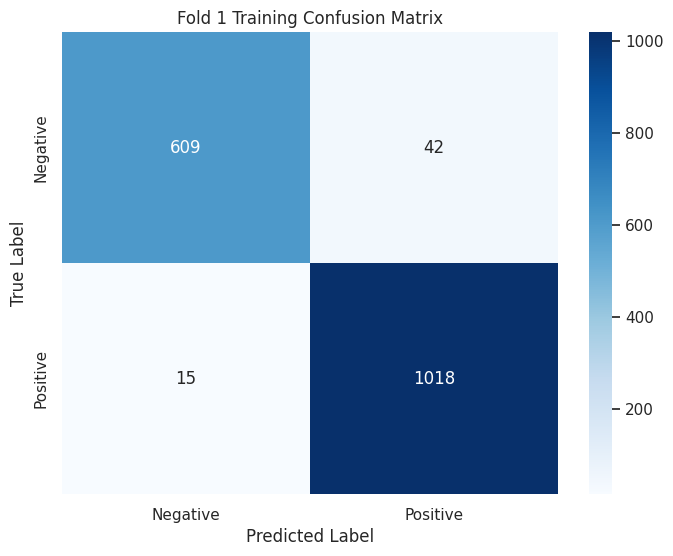

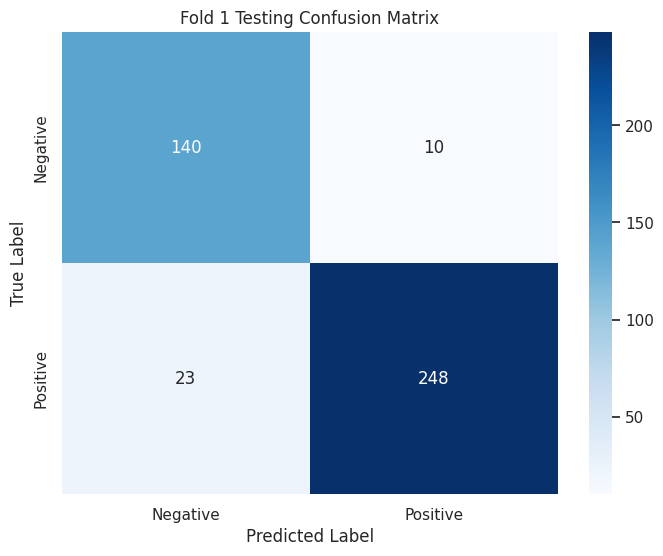

<Figure size 2000x1000 with 0 Axes>

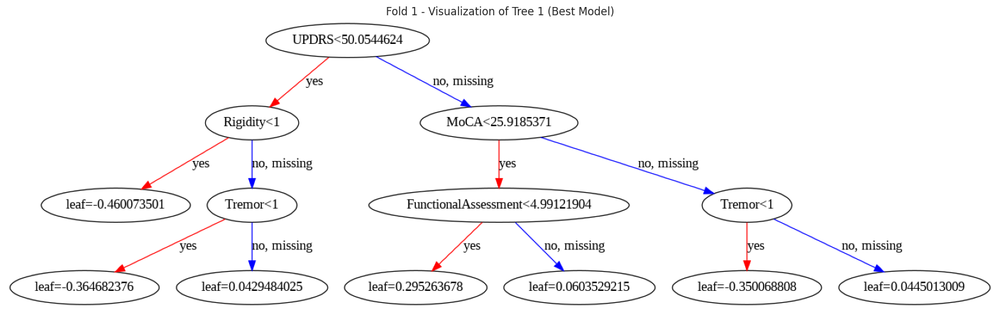

Fold 2 - Best Parameters:
{'gamma': 4.913911055367967, 'learning_rate': 0.24274282740029007, 'max_depth': 5, 'n_estimators': 82, 'subsample': 0.698566901710332}


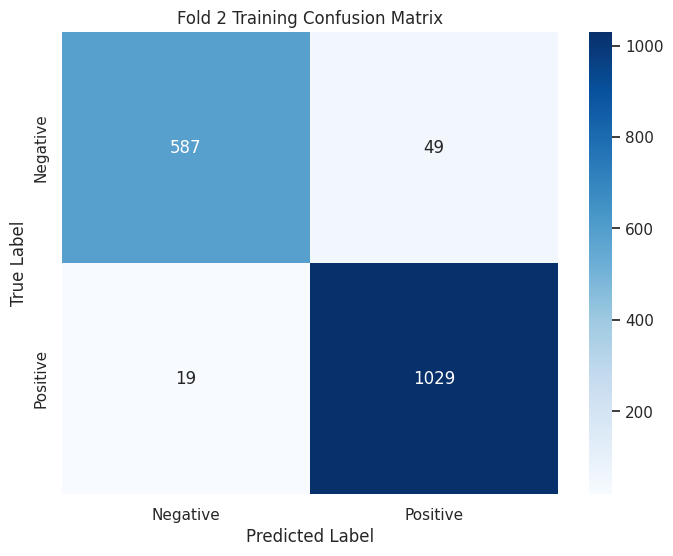

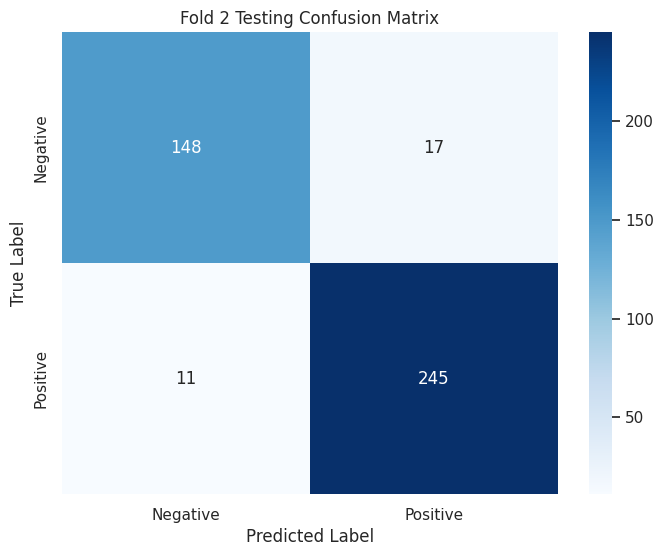

<Figure size 2000x1000 with 0 Axes>

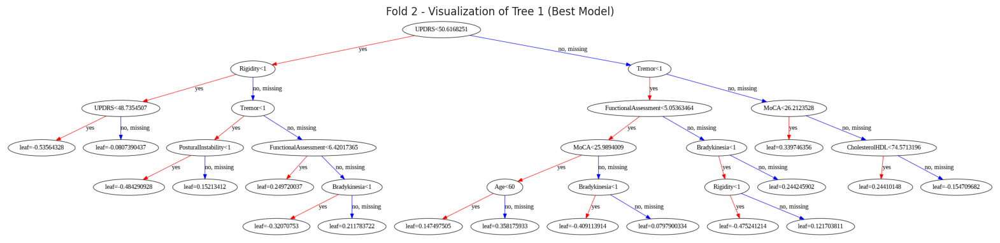

Fold 3 - Best Parameters:
{'gamma': 4.053803217626175, 'learning_rate': 0.2075568536557229, 'max_depth': 6, 'n_estimators': 95, 'subsample': 0.8809241189667667}


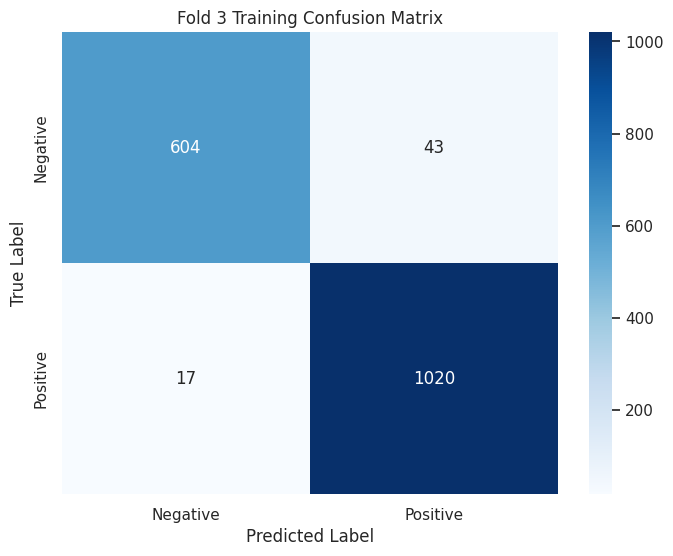

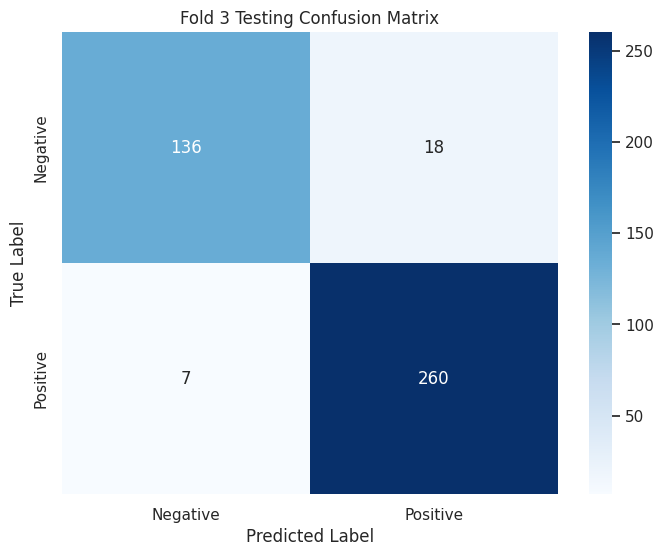

<Figure size 2000x1000 with 0 Axes>

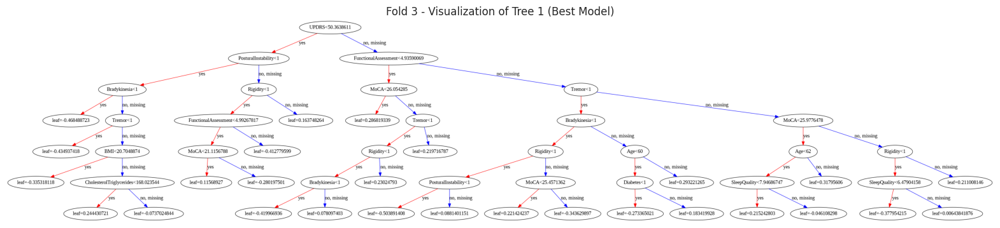

Fold 4 - Best Parameters:
{'gamma': 3.1039495271680346, 'learning_rate': 0.2683918132034138, 'max_depth': 6, 'n_estimators': 85, 'subsample': 0.7047421247981038}


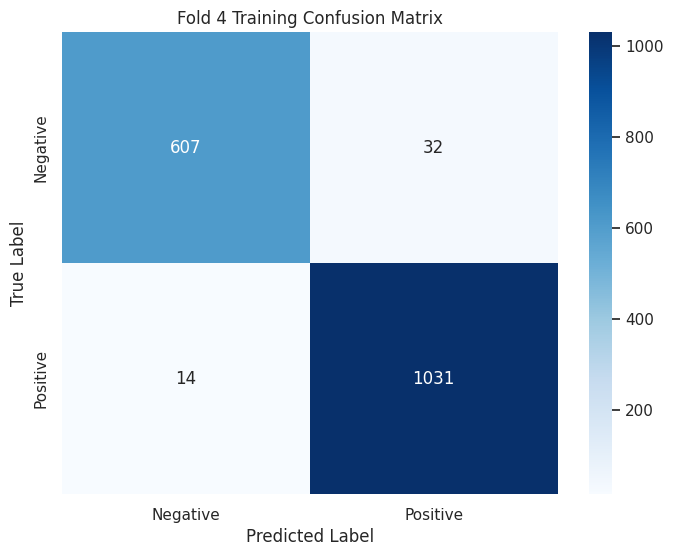

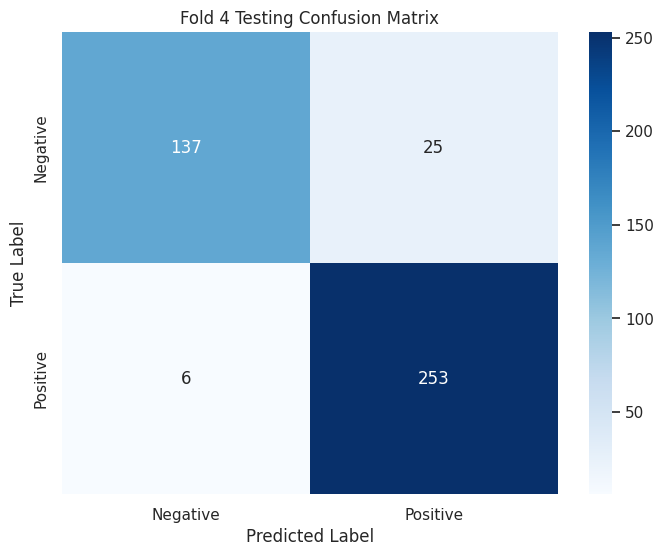

<Figure size 2000x1000 with 0 Axes>

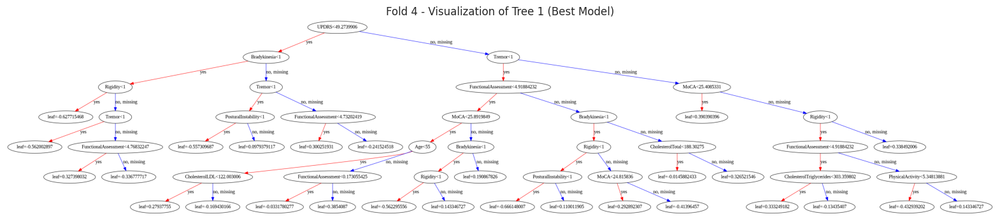

Fold 5 - Best Parameters:
{'gamma': 3.1639601002336892, 'learning_rate': 0.26530453405870175, 'max_depth': 3, 'n_estimators': 94, 'subsample': 0.7779741042005286}


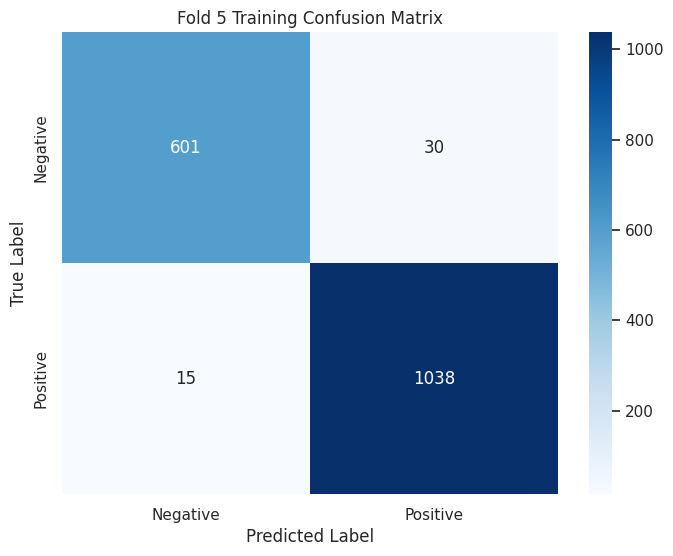

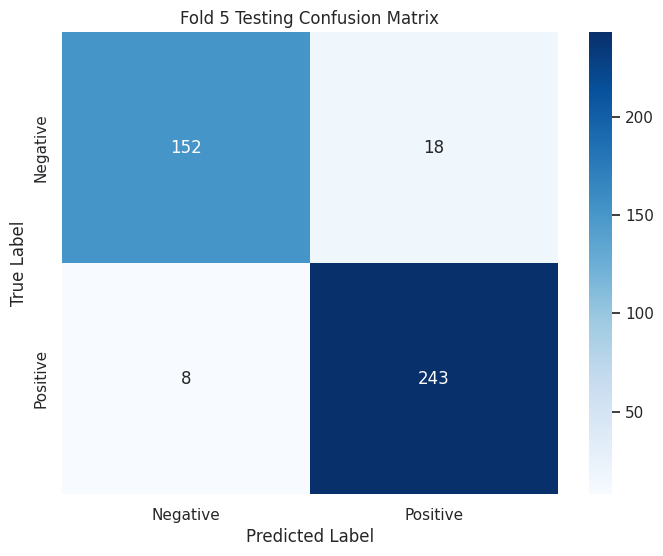

<Figure size 2000x1000 with 0 Axes>

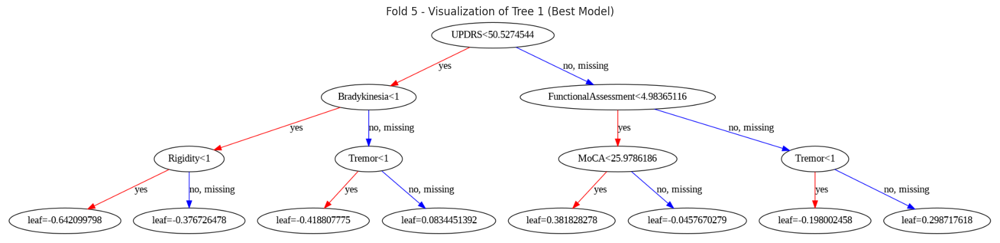


Best Global Parameters from Iteration 500 (Across All Folds):
{'gamma': 4.913911055367967, 'learning_rate': 0.24274282740029007, 'max_depth': 5, 'n_estimators': 82, 'subsample': 0.698566901710332}


<Figure size 2000x1000 with 0 Axes>

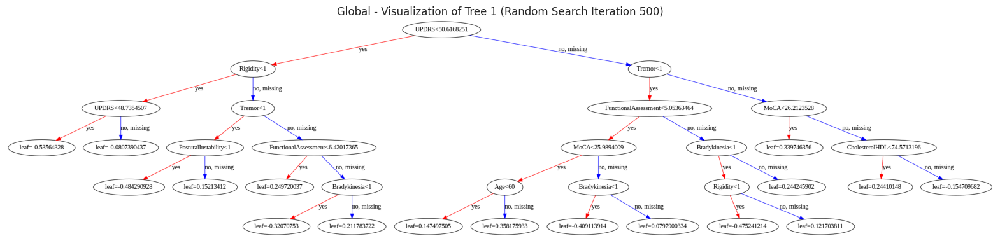

All fold metrics have been saved to 'fold_metrics.xlsx'


In [ ]:
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from sklearn.metrics import confusion_matrix, roc_auc_score, accuracy_score
from scipy.stats import randint, uniform
import pandas as pd
from sklearn.model_selection import RandomizedSearchCV

# Define feature names
feature_names = [
    'Age', 'Gender', 'Ethnicity', 'EducationLevel', 'BMI', 'Smoking',
    'AlcoholConsumption', 'PhysicalActivity', 'DietQuality', 'SleepQuality',
    'FamilyHistoryParkinsons', 'TraumaticBrainInjury', 'Hypertension', 'Diabetes',
    'Depression', 'Stroke', 'SystolicBP', 'DiastolicBP', 'CholesterolTotal',
    'CholesterolLDL', 'CholesterolHDL', 'CholesterolTriglycerides', 'UPDRS', 'MoCA',
    'FunctionalAssessment', 'Tremor', 'Rigidity', 'Bradykinesia',
    'PosturalInstability', 'SpeechProblems', 'SleepDisorders', 'Constipation'
]

# Initialize lists to store results
fold_metrics = []

# Placeholder for storing global sample model (Iteration 500)
global_sample_model = None

# Initialize list to store all best parameters across all folds
all_best_params = []

# Initialize variable to track best global parameter
global_best_score = -1  # Start with a low value (as ROC AUC score ranges from 0 to 1)
global_best_params = None

# Loop through each fold
for i in range(1, 6):
    # Load training and test data for the current fold
    train_df = pd.read_excel('fold_data.xlsx', sheet_name=f'Fold_{i}_Train')
    test_df = pd.read_excel('fold_data.xlsx', sheet_name=f'Fold_{i}_Test')

    # Separate features and target
    X_train = train_df.drop('target', axis=1)
    y_train = train_df['target']
    X_test = test_df.drop('target', axis=1)
    y_test = test_df['target']

    # Define XGBoost parameters for RandomizedSearch
    param_dist = {
        'n_estimators': randint(50, 100),
        'max_depth': randint(3, 8),
        'learning_rate': uniform(0.01, 0.29),
        'subsample': uniform(0.6, 0.3),
        'gamma': uniform(0, 5),
    }

    # Initialize the XGBoost Classifier
    model = xgb.XGBClassifier(
        use_label_encoder=False,
        objective='binary:logistic',
        eval_metric='logloss'
    )

    # Initialize RandomizedSearchCV
    random_search = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_dist,
        scoring='roc_auc',
        cv=5,
        n_jobs=-1,
        n_iter=500,
        random_state=None,
    )

    # Fit the model with RandomizedSearch
    random_search.fit(X_train, y_train)

    # Get the best model for this fold
    best_model5 = random_search.best_estimator_

    # Get the best parameters for this fold
    fold_best_params = random_search.best_params_
    print(f"Fold {i} - Best Parameters:")
    print(fold_best_params)

    # Evaluate the model on test set
    y_train_pred = best_model5.predict(X_train)
    y_test_pred = best_model5.predict(X_test)

    # Predict probabilities for AUC-ROC calculation
    y_train_prob = best_model5.predict_proba(X_train)[:, 1]
    y_test_prob = best_model5.predict_proba(X_test)[:, 1]

    # Calculate metrics
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    train_auc = roc_auc_score(y_train, y_train_prob)
    test_auc = roc_auc_score(y_test, y_test_prob)

    # Confusion matrices
    train_conf_matrix = confusion_matrix(y_train, y_train_pred)
    test_conf_matrix = confusion_matrix(y_test, y_test_pred)

    # Save fold metrics
    fold_metrics.append({
        'Fold': i,
        'Train Accuracy': train_accuracy,
        'Test Accuracy': test_accuracy,
        'Train AUC-ROC': train_auc,
        'Test AUC-ROC': test_auc,
    })

    # Plot confusion matrices
    def plot_confusion_matrix(cm, labels, title='Confusion Matrix'):
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
        plt.xlabel('Predicted Label')
        plt.ylabel('True Label')
        plt.title(title)
        plt.show()

    labels = ['Negative', 'Positive']
    plot_confusion_matrix(train_conf_matrix, labels, title=f'Fold {i} Training Confusion Matrix')
    plot_confusion_matrix(test_conf_matrix, labels, title=f'Fold {i} Testing Confusion Matrix')

    # Visualize the first tree of the best model for this fold
    plt.figure(figsize=(20, 10))
    xgb.plot_tree(best_model5, num_trees=0, feature_names=feature_names)
    plt.title(f'Fold {i} - Visualization of Tree 1 (Best Model)')
    plt.show()

    # Compare and update global best parameters based on the highest AUC score
    if test_auc > global_best_score:
        global_best_score = test_auc
        global_best_params = fold_best_params
        global_sample_model = best_model5

# Print the best parameters from the global iteration 500 across all folds
print("\nBest Global Parameters from Iteration 500 (Across All Folds):")
print(global_best_params)

# Visualize a sample tree for global Random Search Iteration 500 (Best Model)
plt.figure(figsize=(20, 10))
xgb.plot_tree(global_sample_model, num_trees=0, feature_names=feature_names)
plt.title('Global - Visualization of Tree 1 (Random Search Iteration 500)')
plt.show()

# Save all metrics to a DataFrame
metrics_df = pd.DataFrame(fold_metrics)

# Save metrics to an Excel file
metrics_df.to_excel('fold_metrics.xlsx', index=False)
print("All fold metrics have been saved to 'fold_metrics.xlsx'")

Fold 1 - Best Parameters:
{'gamma': 3.2311796647038378, 'learning_rate': 0.18308772746955027, 'max_depth': 3, 'n_estimators': 61, 'subsample': 0.8897516381097041}


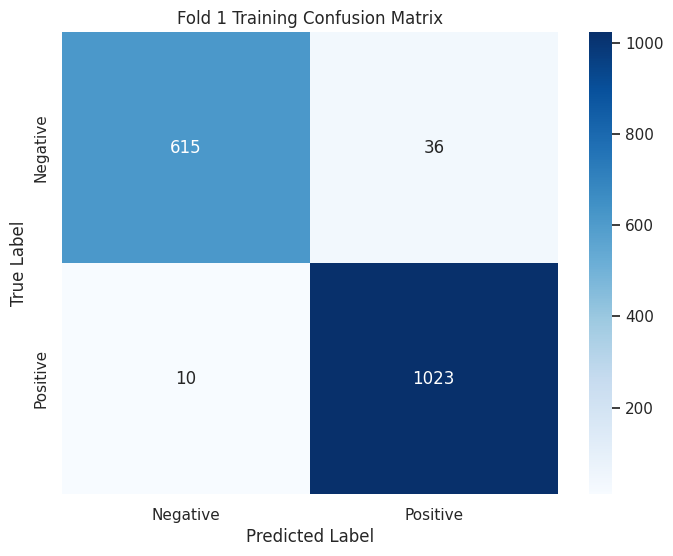

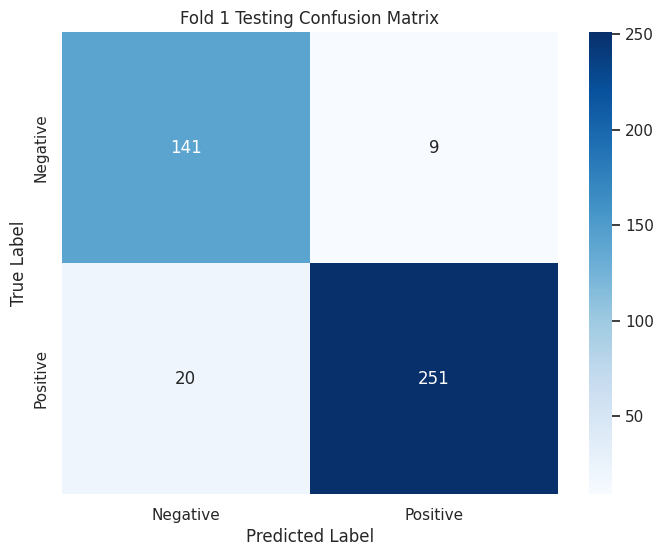

<Figure size 2000x1000 with 0 Axes>

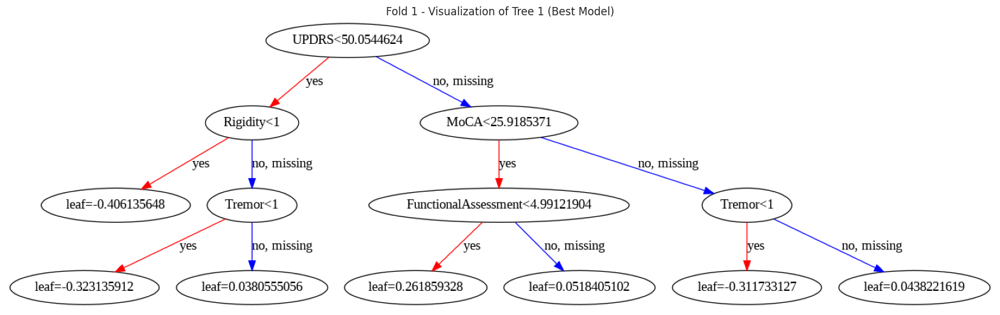

Fold 2 - Best Parameters:
{'gamma': 4.326816165403909, 'learning_rate': 0.25442717738705894, 'max_depth': 3, 'n_estimators': 69, 'subsample': 0.7729759365742468}


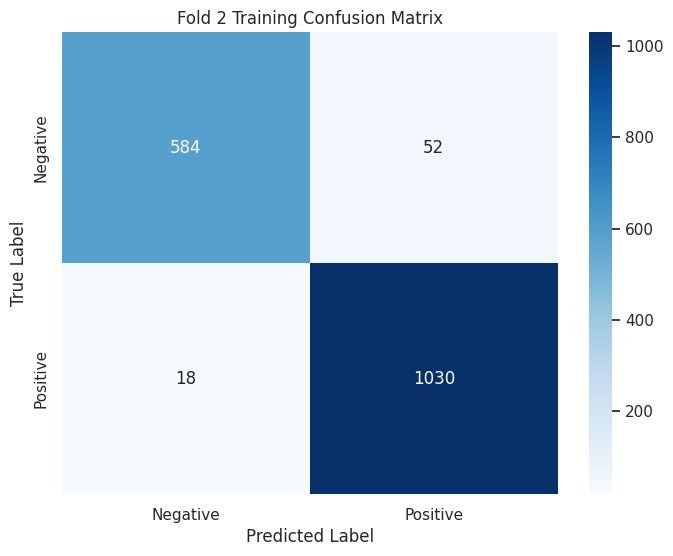

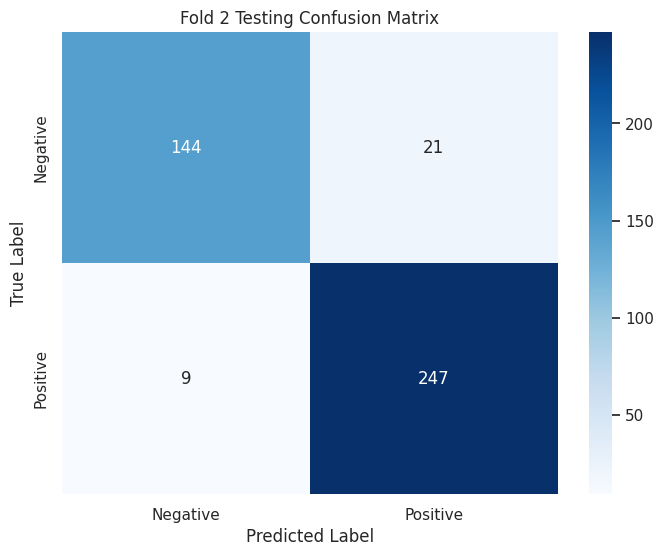

<Figure size 2000x1000 with 0 Axes>

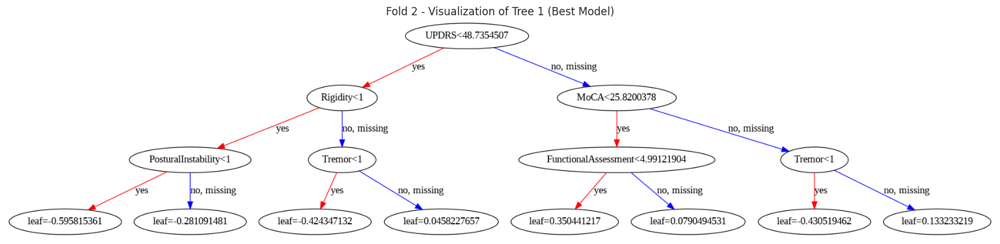

Fold 3 - Best Parameters:
{'gamma': 4.692098841774738, 'learning_rate': 0.18914686806198375, 'max_depth': 6, 'n_estimators': 75, 'subsample': 0.8251917650493213}


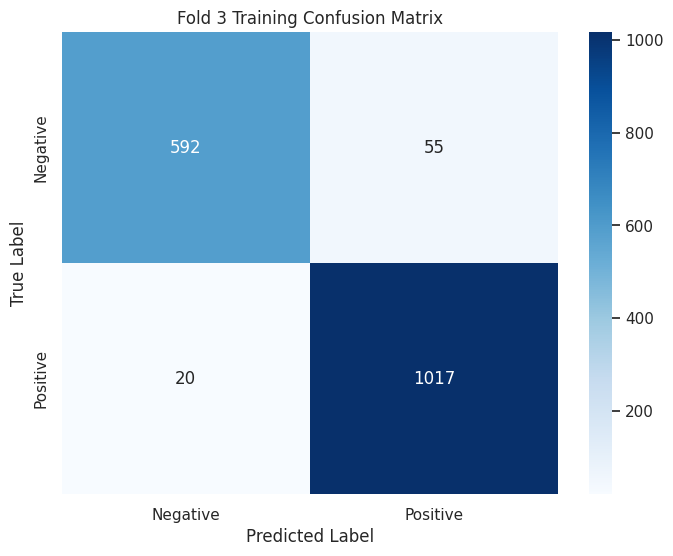

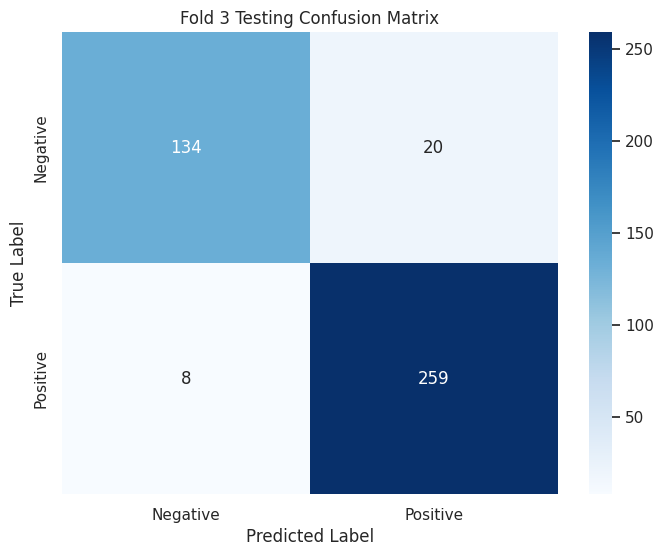

<Figure size 2000x1000 with 0 Axes>

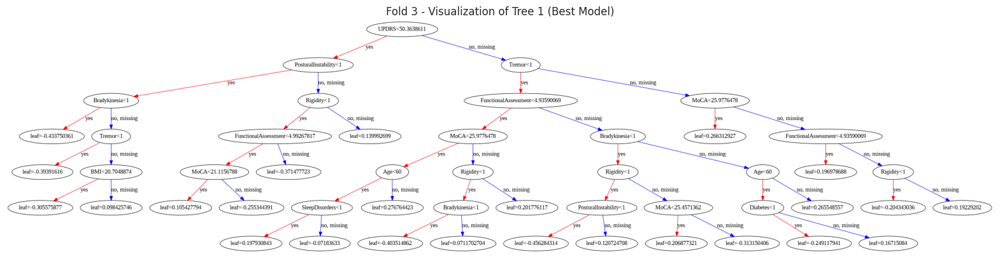

Fold 4 - Best Parameters:
{'gamma': 4.361546240527432, 'learning_rate': 0.16542421037042104, 'max_depth': 4, 'n_estimators': 80, 'subsample': 0.7760743849735182}


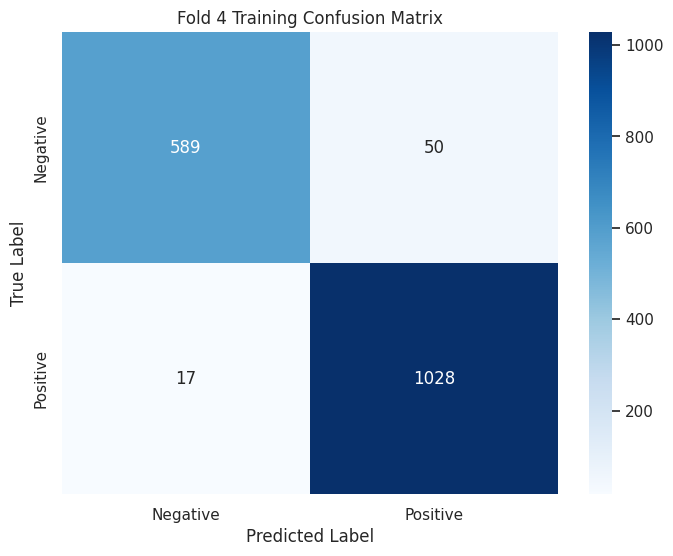

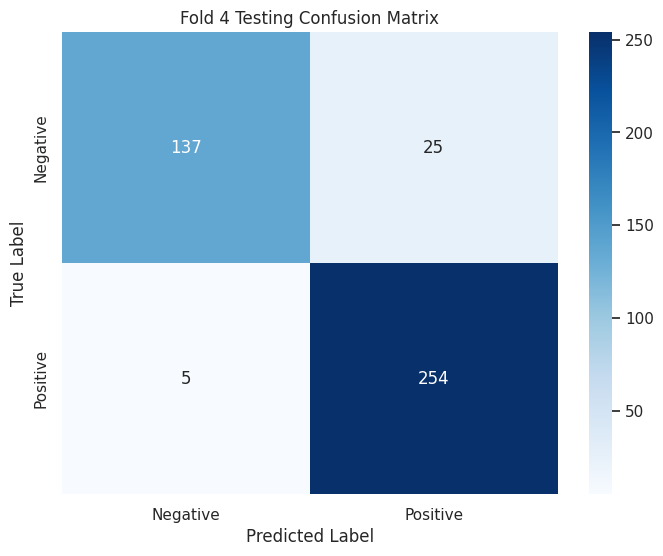

<Figure size 2000x1000 with 0 Axes>

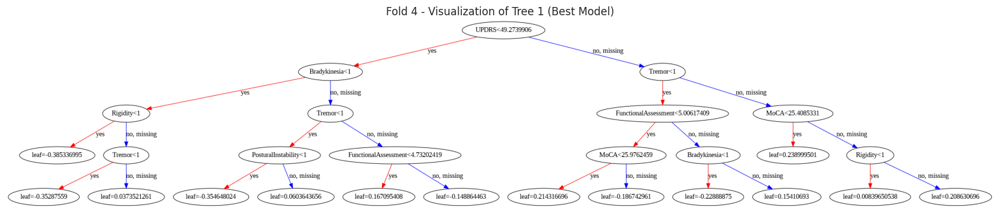

Fold 5 - Best Parameters:
{'gamma': 4.233638713334356, 'learning_rate': 0.24873555424745356, 'max_depth': 3, 'n_estimators': 82, 'subsample': 0.7385031155941475}


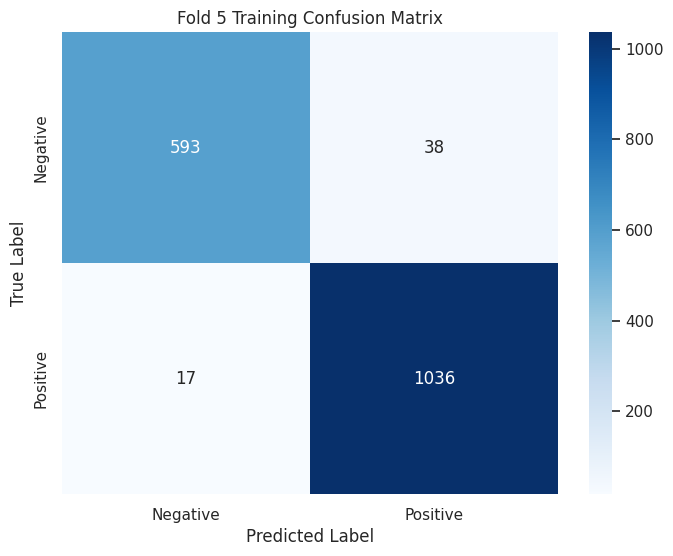

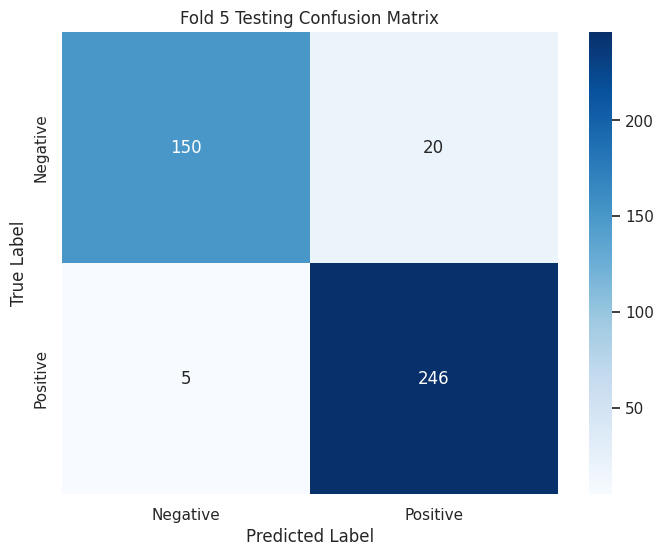

<Figure size 2000x1000 with 0 Axes>

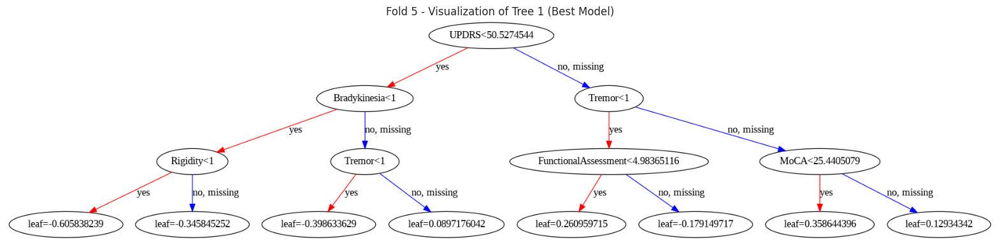


Best Global Parameters from Iteration 1000 (Across All Folds):
{'gamma': 4.326816165403909, 'learning_rate': 0.25442717738705894, 'max_depth': 3, 'n_estimators': 69, 'subsample': 0.7729759365742468}


<Figure size 2000x1000 with 0 Axes>

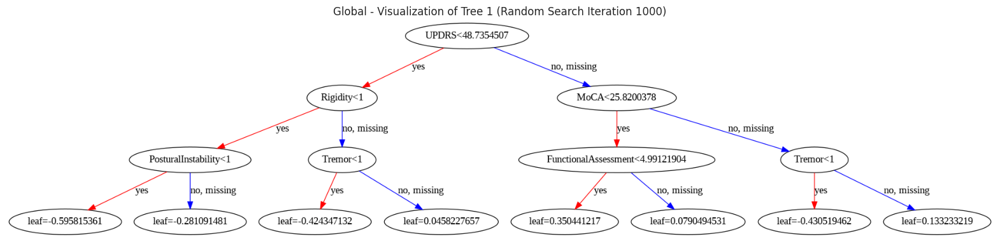

All fold metrics have been saved to 'fold_metrics.xlsx'


In [ ]:
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from sklearn.metrics import confusion_matrix, roc_auc_score, accuracy_score
from scipy.stats import randint, uniform
import pandas as pd
from sklearn.model_selection import RandomizedSearchCV

# Define feature names
feature_names = [
    'Age', 'Gender', 'Ethnicity', 'EducationLevel', 'BMI', 'Smoking',
    'AlcoholConsumption', 'PhysicalActivity', 'DietQuality', 'SleepQuality',
    'FamilyHistoryParkinsons', 'TraumaticBrainInjury', 'Hypertension', 'Diabetes',
    'Depression', 'Stroke', 'SystolicBP', 'DiastolicBP', 'CholesterolTotal',
    'CholesterolLDL', 'CholesterolHDL', 'CholesterolTriglycerides', 'UPDRS', 'MoCA',
    'FunctionalAssessment', 'Tremor', 'Rigidity', 'Bradykinesia',
    'PosturalInstability', 'SpeechProblems', 'SleepDisorders', 'Constipation'
]

# Initialize lists to store results
fold_metrics = []

# Placeholder for storing global sample model (Iteration 1000)
global_sample_model = None

# Initialize list to store all best parameters across all folds
all_best_params = []

# Initialize variable to track best global parameter
global_best_score = -1  # Start with a low value (as ROC AUC score ranges from 0 to 1)
global_best_params = None

# Loop through each fold
for i in range(1, 6):
    # Load training and test data for the current fold
    train_df = pd.read_excel('fold_data.xlsx', sheet_name=f'Fold_{i}_Train')
    test_df = pd.read_excel('fold_data.xlsx', sheet_name=f'Fold_{i}_Test')

    # Separate features and target
    X_train = train_df.drop('target', axis=1)
    y_train = train_df['target']
    X_test = test_df.drop('target', axis=1)
    y_test = test_df['target']

    # Define XGBoost parameters for RandomizedSearch
    param_dist = {
        'n_estimators': randint(50, 100),
        'max_depth': randint(3, 8),
        'learning_rate': uniform(0.01, 0.29),
        'subsample': uniform(0.6, 0.3),
        'gamma': uniform(0, 5),
    }

    # Initialize the XGBoost Classifier
    model = xgb.XGBClassifier(
        use_label_encoder=False,
        objective='binary:logistic',
        eval_metric='logloss'
    )

    # Initialize RandomizedSearchCV
    random_search = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_dist,
        scoring='roc_auc',
        cv=5,
        n_jobs=-1,
        n_iter=1000,
        random_state=None,
    )

    # Fit the model with RandomizedSearch
    random_search.fit(X_train, y_train)

    # Get the best model for this fold
    best_model6 = random_search.best_estimator_

    # Get the best parameters for this fold
    fold_best_params = random_search.best_params_
    print(f"Fold {i} - Best Parameters:")
    print(fold_best_params)

    # Evaluate the model on test set
    y_train_pred = best_model6.predict(X_train)
    y_test_pred = best_model6.predict(X_test)

    # Predict probabilities for AUC-ROC calculation
    y_train_prob = best_model6.predict_proba(X_train)[:, 1]
    y_test_prob = best_model6.predict_proba(X_test)[:, 1]

    # Calculate metrics
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    train_auc = roc_auc_score(y_train, y_train_prob)
    test_auc = roc_auc_score(y_test, y_test_prob)

    # Confusion matrices
    train_conf_matrix = confusion_matrix(y_train, y_train_pred)
    test_conf_matrix = confusion_matrix(y_test, y_test_pred)

    # Save fold metrics
    fold_metrics.append({
        'Fold': i,
        'Train Accuracy': train_accuracy,
        'Test Accuracy': test_accuracy,
        'Train AUC-ROC': train_auc,
        'Test AUC-ROC': test_auc,
    })

    # Plot confusion matrices
    def plot_confusion_matrix(cm, labels, title='Confusion Matrix'):
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
        plt.xlabel('Predicted Label')
        plt.ylabel('True Label')
        plt.title(title)
        plt.show()

    labels = ['Negative', 'Positive']
    plot_confusion_matrix(train_conf_matrix, labels, title=f'Fold {i} Training Confusion Matrix')
    plot_confusion_matrix(test_conf_matrix, labels, title=f'Fold {i} Testing Confusion Matrix')

    # Visualize the first tree of the best model for this fold
    plt.figure(figsize=(20, 10))
    xgb.plot_tree(best_model6, num_trees=0, feature_names=feature_names)
    plt.title(f'Fold {i} - Visualization of Tree 1 (Best Model)')
    plt.show()

    # Compare and update global best parameters based on the highest AUC score
    if test_auc > global_best_score:
        global_best_score = test_auc
        global_best_params = fold_best_params
        global_sample_model = best_model6

# Print the best parameters from the global iteration 500 across all folds
print("\nBest Global Parameters from Iteration 1000 (Across All Folds):")
print(global_best_params)

# Visualize a sample tree for global Random Search Iteration 1000 (Best Model)
plt.figure(figsize=(20, 10))
xgb.plot_tree(global_sample_model, num_trees=0, feature_names=feature_names)
plt.title('Global - Visualization of Tree 1 (Random Search Iteration 1000)')
plt.show()

# Save all metrics to a DataFrame
metrics_df = pd.DataFrame(fold_metrics)

# Save metrics to an Excel file
metrics_df.to_excel('fold_metrics.xlsx', index=False)
print("All fold metrics have been saved to 'fold_metrics.xlsx'")

# PENGARUH KONFIGURASI PARAMETER TERHADAP AKURASI

**GRAFIK PENGARUH LEARNING RATE TERHADAP PRESENTASE RATA RATA AKURASI**

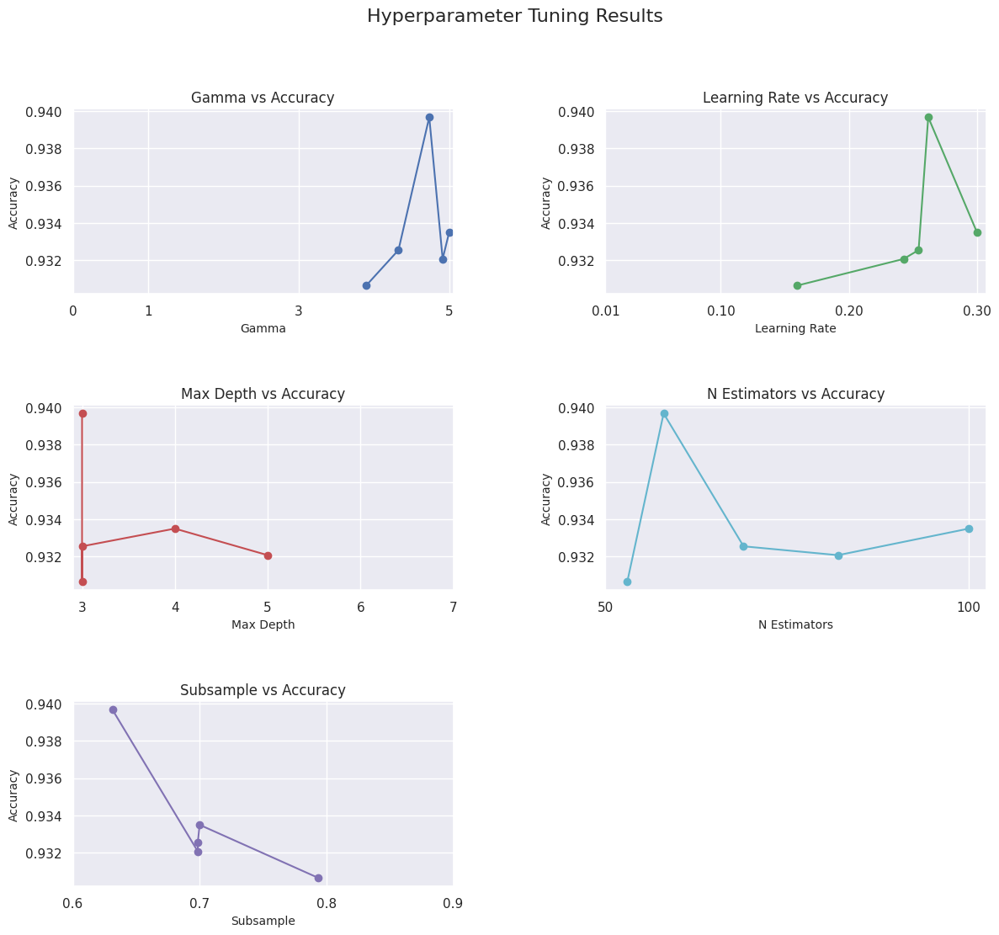

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Data hasil tuning hyperparameter
data = {
    'gamma': [5, 4.735815347, 3.898109893, 4.913911055, 4.326816165],
    'learning_rate': [0.3, 0.261959651, 0.15984415, 0.242742827, 0.254427177],
    'max_depth': [4, 3, 3, 5, 3],
    'n_estimators': [100, 58, 53, 82, 69],
    'subsample': [0.7, 0.631234036, 0.793739002, 0.698566902, 0.698566902],
    'accuracy': [0.933491686, 0.939667458, 0.93064133, 0.932066508, 0.932541568],
}

# Data range untuk visualisasi
parameter_ranges = {
    'gamma': [0, 1, 3, 5],
    'learning_rate': [0.01, 0.1, 0.2, 0.3],
    'max_depth': [3, 4, 5, 6, 7],
    'n_estimators': [50, 100],
    'subsample': [0.6, 0.7, 0.8, 0.9],
}

# Convert data ke DataFrame
df = pd.DataFrame(data)

# Sorting untuk visualisasi yang lebih baik
df_sorted_gamma = df.sort_values('gamma')
df_sorted_lr = df.sort_values('learning_rate')
df_sorted_max_depth = df.sort_values('max_depth')
df_sorted_n_estimators = df.sort_values('n_estimators')
df_sorted_subsample = df.sort_values('subsample')

# Plot data
fig, axes = plt.subplots(3, 2, figsize=(14, 12), gridspec_kw={'wspace': 0.4, 'hspace': 0.6})

# Gamma vs Accuracy
axes[0, 0].plot(df_sorted_gamma['gamma'], df_sorted_gamma['accuracy'], marker='o', color='b', linestyle='-', markersize=6)
axes[0, 0].set_title('Gamma vs Accuracy', fontsize=12)
axes[0, 0].set_xlabel('Gamma', fontsize=10)
axes[0, 0].set_ylabel('Accuracy', fontsize=10)
axes[0, 0].set_xticks(parameter_ranges['gamma'])

# Learning Rate vs Accuracy
axes[0, 1].plot(df_sorted_lr['learning_rate'], df_sorted_lr['accuracy'], marker='o', color='g', linestyle='-', markersize=6)
axes[0, 1].set_title('Learning Rate vs Accuracy', fontsize=12)
axes[0, 1].set_xlabel('Learning Rate', fontsize=10)
axes[0, 1].set_ylabel('Accuracy', fontsize=10)
axes[0, 1].set_xticks(parameter_ranges['learning_rate'])

# Max Depth vs Accuracy
axes[1, 0].plot(df_sorted_max_depth['max_depth'], df_sorted_max_depth['accuracy'], marker='o', color='r', linestyle='-', markersize=6)
axes[1, 0].set_title('Max Depth vs Accuracy', fontsize=12)
axes[1, 0].set_xlabel('Max Depth', fontsize=10)
axes[1, 0].set_ylabel('Accuracy', fontsize=10)
axes[1, 0].set_xticks(parameter_ranges['max_depth'])

# N Estimators vs Accuracy
axes[1, 1].plot(df_sorted_n_estimators['n_estimators'], df_sorted_n_estimators['accuracy'], marker='o', color='c', linestyle='-', markersize=6)
axes[1, 1].set_title('N Estimators vs Accuracy', fontsize=12)
axes[1, 1].set_xlabel('N Estimators', fontsize=10)
axes[1, 1].set_ylabel('Accuracy', fontsize=10)
axes[1, 1].set_xticks(parameter_ranges['n_estimators'])

# Subsample vs Accuracy
axes[2, 0].plot(df_sorted_subsample['subsample'], df_sorted_subsample['accuracy'], marker='o', color='m', linestyle='-', markersize=6)
axes[2, 0].set_title('Subsample vs Accuracy', fontsize=12)
axes[2, 0].set_xlabel('Subsample', fontsize=10)
axes[2, 0].set_ylabel('Accuracy', fontsize=10)
axes[2, 0].set_xticks(parameter_ranges['subsample'])

# Menghapus subplot kosong
fig.delaxes(axes[2, 1])

# Menyesuaikan tata letak agar lebih rapi
plt.tight_layout(rect=[0, 0, 1, 0.95])
fig.suptitle('Hyperparameter Tuning Results', fontsize=16)
plt.show()

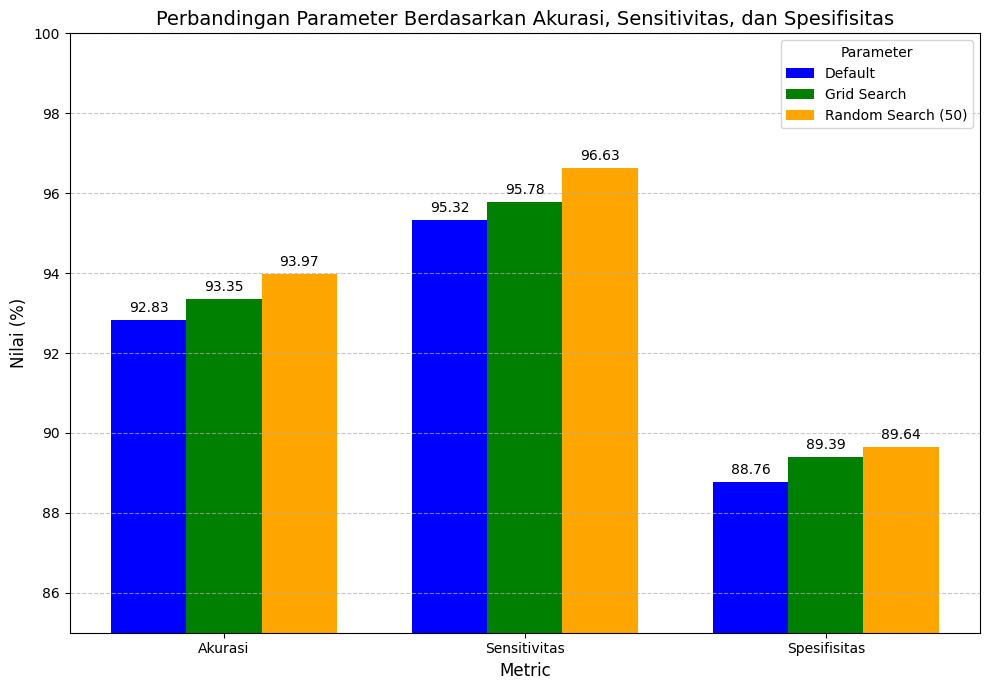

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Data terbaru
data = {
    'Metric': ['Akurasi', 'Sensitivitas', 'Spesifisitas'],
    'Default': [92.83, 95.32, 88.76],
    'Grid Search': [93.35, 95.78, 89.39],
    'Random Search (50)': [93.97, 96.63, 89.64]
}

# Convert data ke DataFrame
df = pd.DataFrame(data)

# Membuat grouped bar plot
fig, ax = plt.subplots(figsize=(10, 7))
bar_width = 0.25
x = np.arange(len(df['Metric']))

# Plot setiap parameter
default_bars = ax.bar(x - bar_width, df['Default'], bar_width, label='Default', color='blue')
grid_bars = ax.bar(x, df['Grid Search'], bar_width, label='Grid Search', color='green')
random_bars = ax.bar(x + bar_width, df['Random Search (50)'], bar_width, label='Random Search (50)', color='orange')

# Menambahkan nilai di atas setiap bar
def add_labels(bars):
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2.0, height + 0.2, f'{height:.2f}', ha='center', fontsize=10)

add_labels(default_bars)
add_labels(grid_bars)
add_labels(random_bars)

# Kustomisasi plot
ax.set_xlabel('Metric', fontsize=12)
ax.set_ylabel('Nilai (%)', fontsize=12)
ax.set_title('Perbandingan Parameter Berdasarkan Akurasi, Sensitivitas, dan Spesifisitas', fontsize=14)
ax.set_xticks(x)
ax.set_xticklabels(df['Metric'], fontsize=10)
ax.legend(title='Parameter', fontsize=10)
ax.set_ylim(85, 100)  # Menyesuaikan rentang sumbu y agar lebih jelas

# Menambahkan grid
ax.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

# Tampilkan plot
plt.show()